In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
features = [
    "sym_Jet0_pt", "sym_Jet1_pt", "sym_Jet2_pt", "sym_Jet3_pt",
    "sym_Jet0_eta", "sym_Jet1_eta", "sym_Jet2_eta", "sym_Jet3_eta",
    "sym_Jet0_phi", "sym_Jet1_phi", "sym_Jet2_phi", "sym_Jet3_phi",  
    "sym_Jet0_m", "sym_Jet1_m", "sym_Jet2_m", "sym_Jet3_m",
]

In [3]:
import numpy as np
from events_data import EventsData
from dataset import SCDatasetInfo

def plot_sr_stats(events, sr_stats, ax, label, **plot_kwargs):
    assert len(events) == len(sr_stats)

    sr_stats_argsort = np.argsort(sr_stats)[::-1]
    weights = events.weights[sr_stats_argsort]
    is_signal = events.is_signal[sr_stats_argsort]
    is_4b = events.is_4b[sr_stats_argsort]

    ax.plot(
        np.cumsum(weights * is_4b) / np.sum(weights * is_4b),
        np.cumsum(weights * is_signal) / np.sum(weights * is_signal),           
        label=label,
        **plot_kwargs,
    )

def get_is_signal(scdinfo: SCDatasetInfo, signal_filename: str):
    # Now show the answer
    is_signals = []
    for file, file_len in zip(scdinfo.files, scdinfo.get_file_lengths()):
        is_signals.append(
            np.full(file_len, True)
            if file.name == signal_filename
            else np.full(file_len, False)
        )
    is_signal = np.concatenate(is_signals)
    return is_signal



def events_from_scdinfo(scdinfo: SCDatasetInfo, features: list, signal_filename: str) -> EventsData:
    df = scdinfo.fetch_data()
    df["signal"] = get_is_signal(scdinfo, signal_filename)
    events = EventsData.from_dataframe(df, features)

    return events

def hist_events_by_labels(events: EventsData, values: np.ndarray, bins, ax, **hist_kwargs):
    assert len(values) == len(events)   
    ax.hist(values[events.is_3b], 
                        bins=bins, histtype="step", label="3b", 
                        weights=events.weights[events.is_3b], 
                        **hist_kwargs)
    ax.hist(values[events.is_bg4b], 
                bins=bins, histtype="step", label="bg4b", 
                weights=events.weights[events.is_bg4b], 
                **hist_kwargs)
    ax.hist(values[events.is_signal], 
                bins=bins, histtype="step", label="signal", 
                weights=events.weights[events.is_signal], 
                **hist_kwargs)

In [4]:
import numpy as np
import torch
from fvt_classifier import FvTClassifier
from tst_info import TSTInfo
from training_info import TrainingInfoV2
import yaml
import matplotlib.pyplot as plt
from counting_test_v1 import get_is_signal
from dataset import SCDatasetInfo
from events_data import EventsData
from matplotlib.gridspec import GridSpec

/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
def get_is_signal(scdinfo: SCDatasetInfo, signal_filename: str):
    # Now show the answer
    is_signals = []
    for file, file_len in zip(scdinfo.files, scdinfo.get_file_lengths()):
        is_signals.append(
            np.full(file_len, True)
            if file.name == signal_filename
            else np.full(file_len, False)
        )
    is_signal = np.concatenate(is_signals)
    return is_signal

def events_from_scdinfo(scdinfo: SCDatasetInfo, features: list, signal_filename: str) -> EventsData:
    df = scdinfo.fetch_data()
    df["signal"] = get_is_signal(scdinfo, signal_filename)
    events = EventsData.from_dataframe(df, features)

    return events

def hist_events_by_labels(events: EventsData, values: np.ndarray, bins, ax, **hist_kwargs):
    assert len(values) == len(events)   
    ax.hist(values[events.is_3b], 
                        bins=bins, histtype="step", label="3b", 
                        weights=events.weights[events.is_3b], 
                        **hist_kwargs)
    ax.hist(values[events.is_bg4b], 
                bins=bins, histtype="step", label="bg4b", 
                weights=events.weights[events.is_bg4b], 
                **hist_kwargs)
    ax.hist(values[events.is_signal], 
                bins=bins, histtype="step", label="signal", 
                weights=events.weights[events.is_signal], 
                **hist_kwargs)

In [13]:
hparams_filter = {
    "seed": 0
}
hashes = TSTInfo.find(hparam_filter=hparams_filter)
tstinfo = TSTInfo.load(hashes[0])
print(tstinfo.parent_hash)


None


Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
------------------------------

Epoch 5: 100%|██████████| 141/141 [00:03<00:00, 36.98it/s, v_num=6, val_loss=0.674, train_loss=0.673]


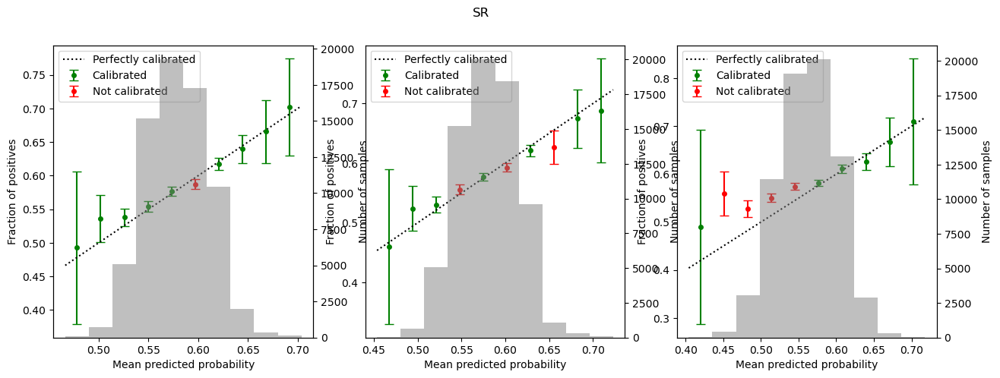

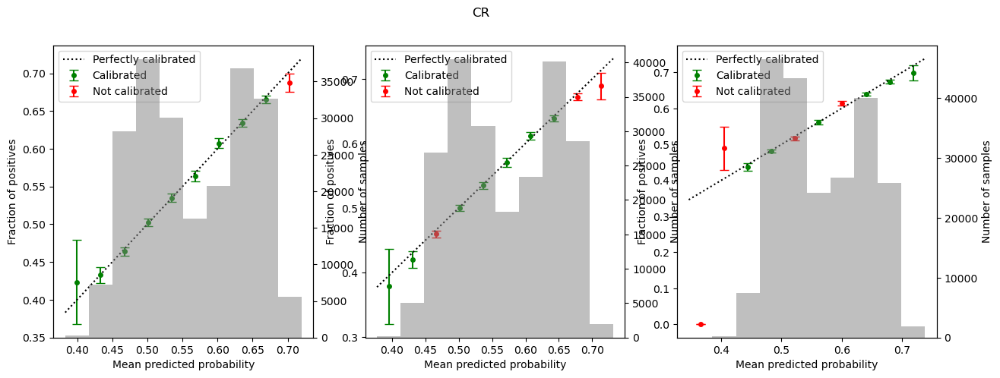

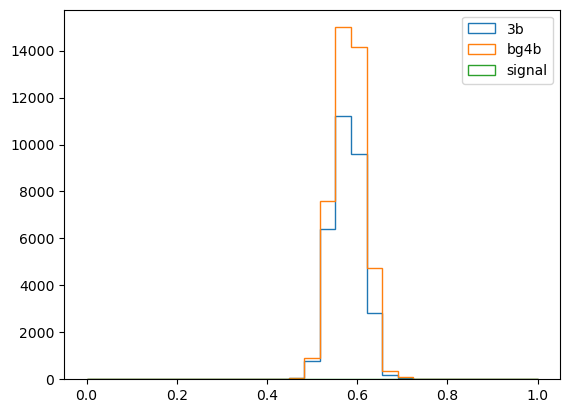

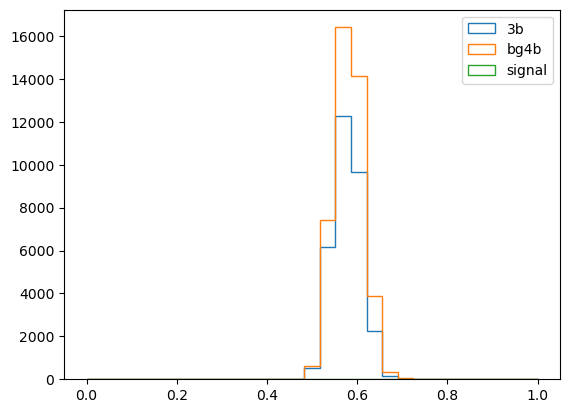

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=0, new=True
Sigma avg CR 2.0212114
Sigma avg bg4b CR 2.0212114
Sigma avg SR 1.5823144
Sigma avg bg4b SR 1.5823144
CR events 215805
SR events 70503


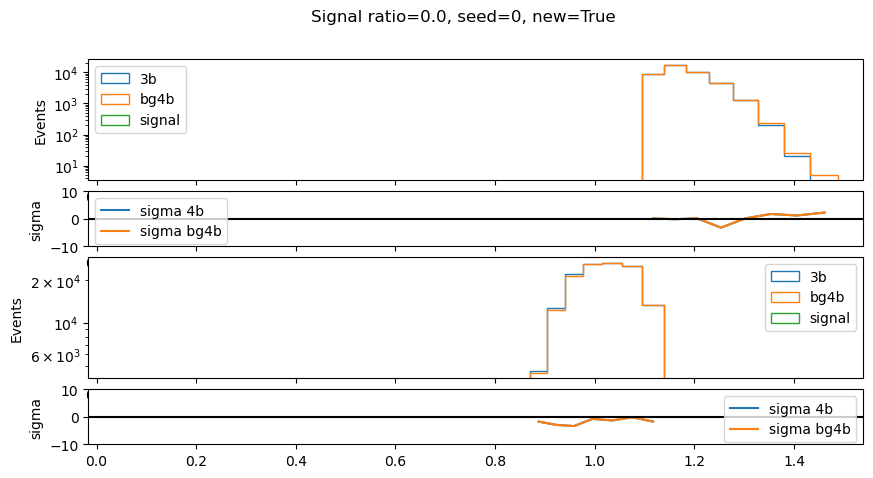

Signal ratio=0.0, seed=0, new=False
Sigma avg CR 4.975187
Sigma avg bg4b CR 4.975187
Sigma avg SR 5.1754932
Sigma avg bg4b SR 5.1754932
CR events 215805
SR events 70503


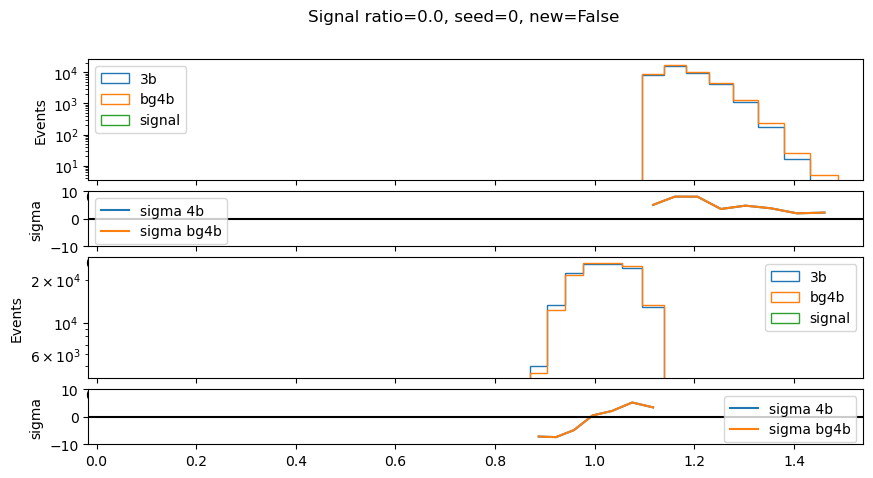

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 8: 100%|██████████| 140/140 [00:04<00:00, 33.71it/s, v_num=4, val_loss=0.674, train_loss=0.672]


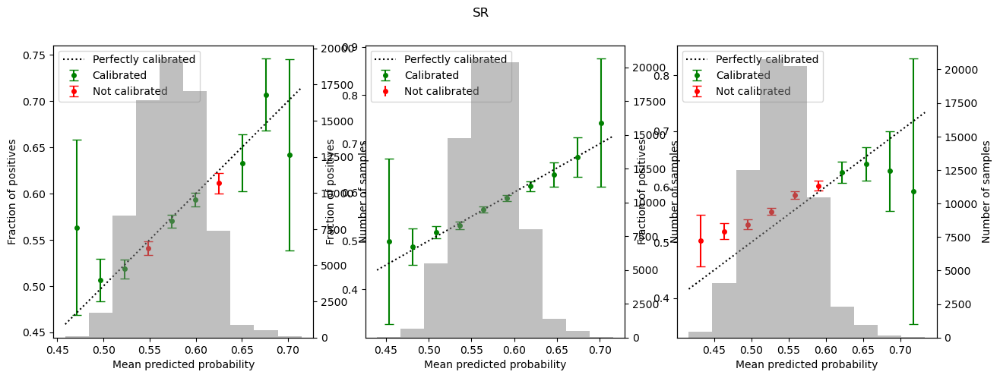

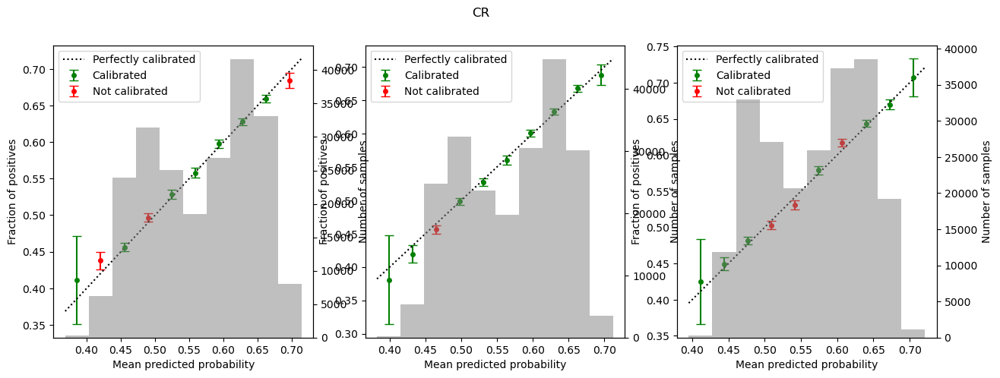

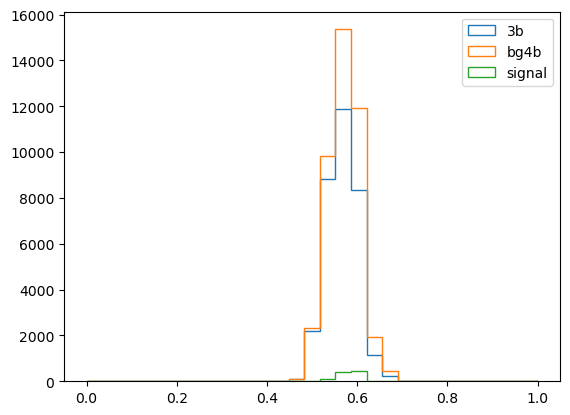

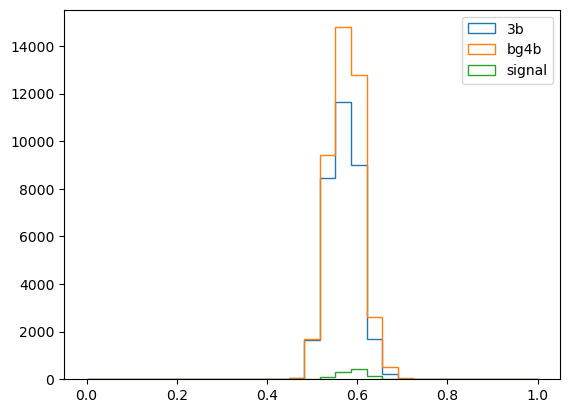

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=0, new=True
Sigma avg CR 1.9551884
Sigma avg bg4b CR 2.099768
Sigma avg SR 1.515564
Sigma avg bg4b SR 2.4514008
CR events 214943
SR events 71824


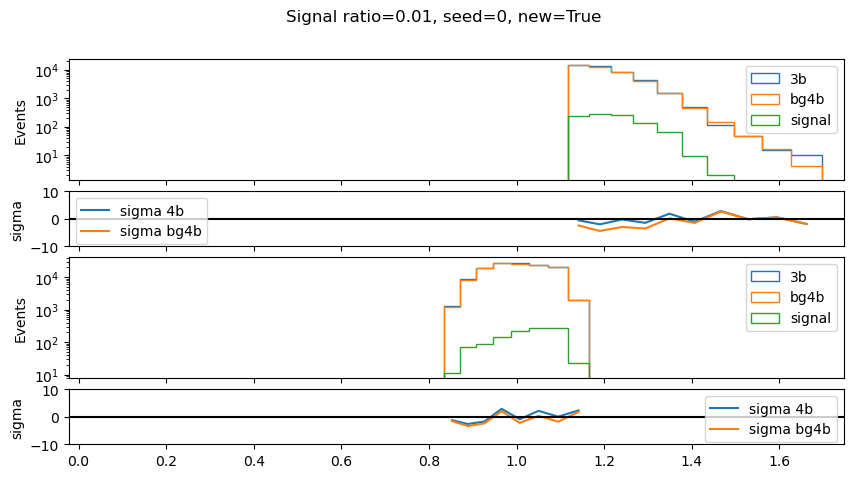

Signal ratio=0.01, seed=0, new=False
Sigma avg CR 5.522808
Sigma avg bg4b CR 5.157659
Sigma avg SR 7.114232
Sigma avg bg4b SR 5.6118693
CR events 214943
SR events 71824


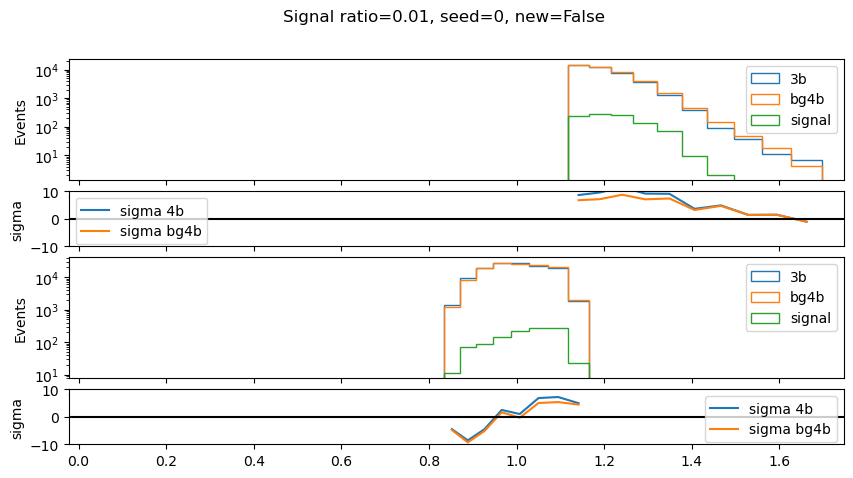

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 142/142 [00:05<00:00, 26.83it/s, v_num=9, val_loss=0.674, train_loss=0.674]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 142/142 [00:05<00:00, 26.04it/s, v_num=9, val_loss=0.674, train_loss=0.674]


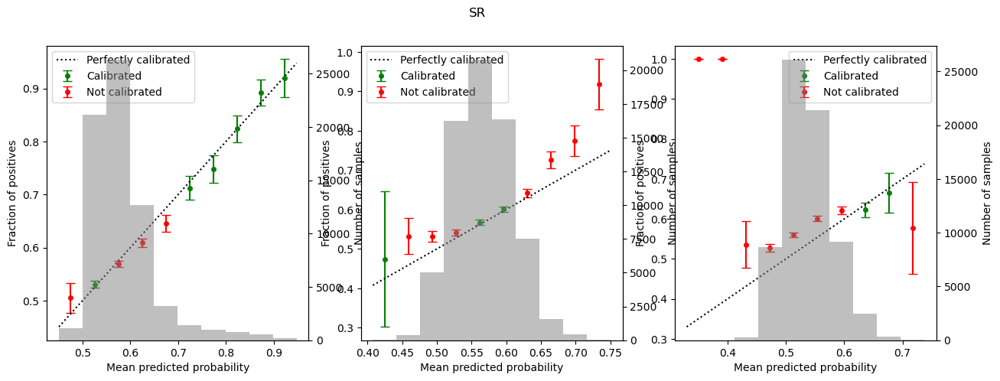

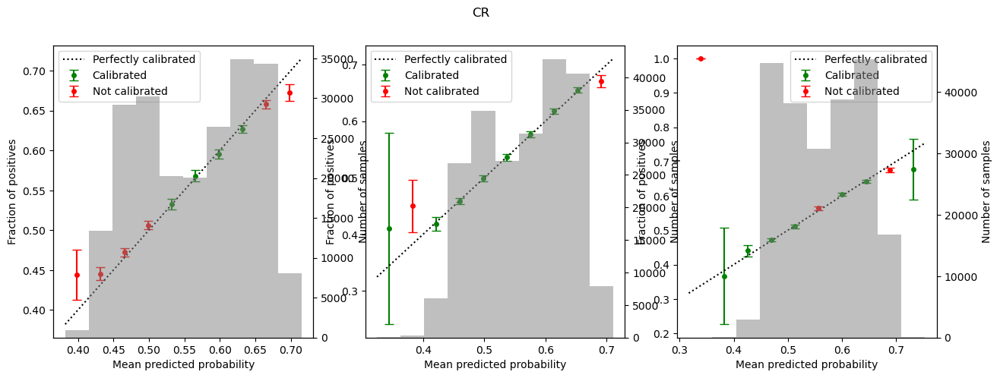

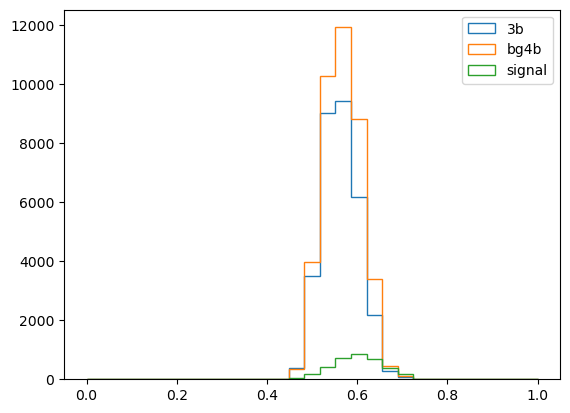

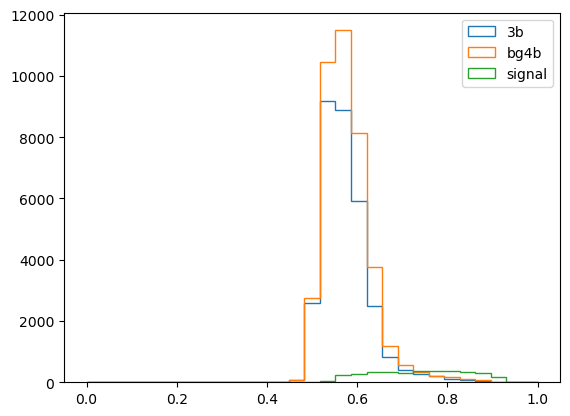

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=0, new=True
Sigma avg CR 1.2252538
Sigma avg bg4b CR 1.2858373
Sigma avg SR 6.1271687
Sigma avg bg4b SR 1.7088293
CR events 217696
SR events 68372


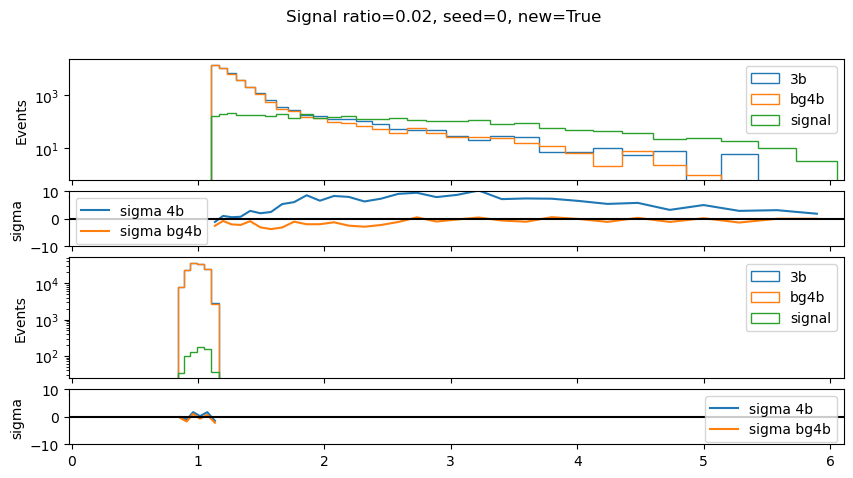

Signal ratio=0.02, seed=0, new=False
Sigma avg CR 4.6957006
Sigma avg bg4b CR 4.6117096
Sigma avg SR 8.379773
Sigma avg bg4b SR 3.1029966
CR events 217696
SR events 68372


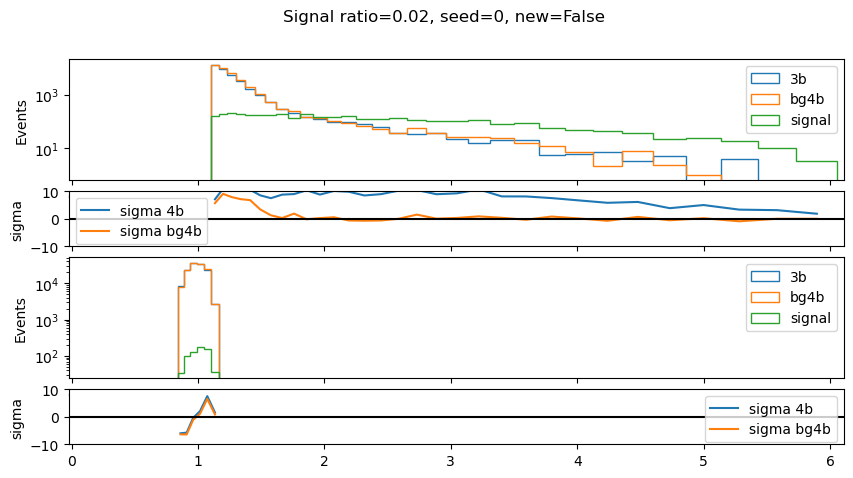

Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 5: 100%|██████████| 145/145 [00:06<00:00, 22.44it/s, v_num=14, val_loss=0.682, train_loss=0.681]


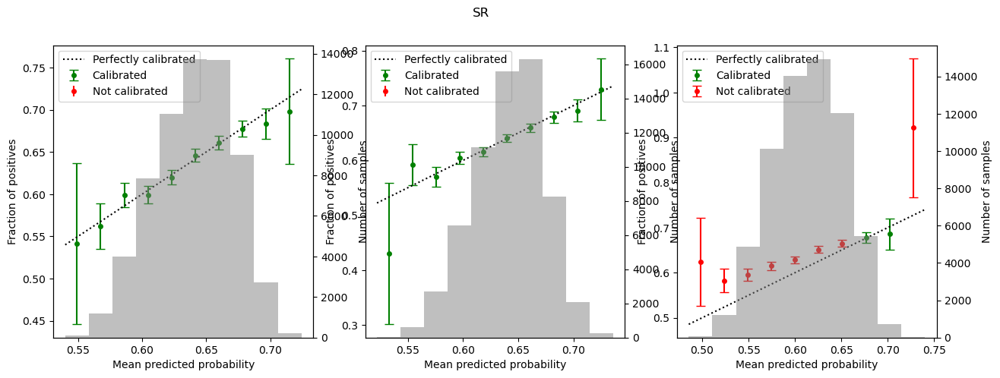

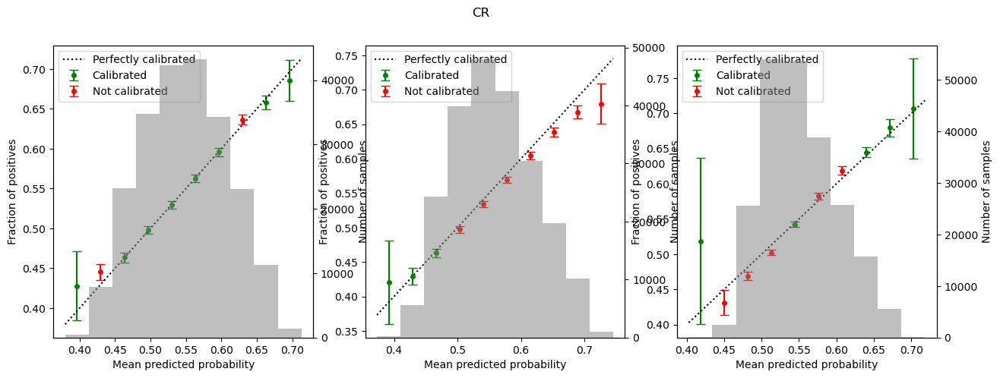

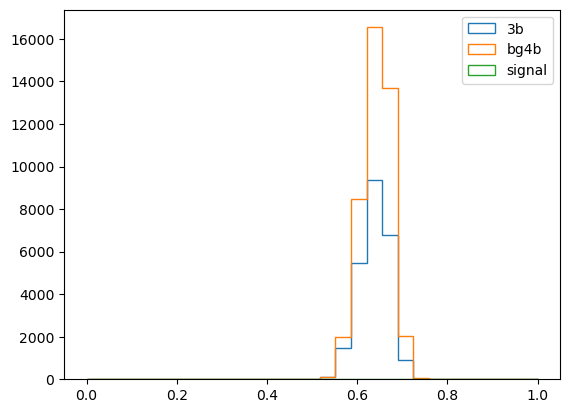

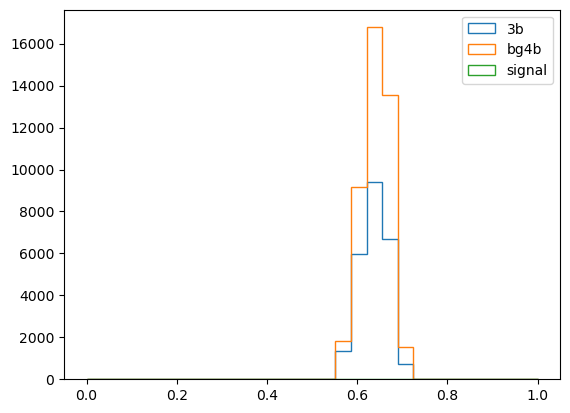

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=1, new=True
Sigma avg CR 4.156831
Sigma avg bg4b CR 4.156831
Sigma avg SR 2.1994627
Sigma avg bg4b SR 2.1994627
CR events 221874
SR events 63510


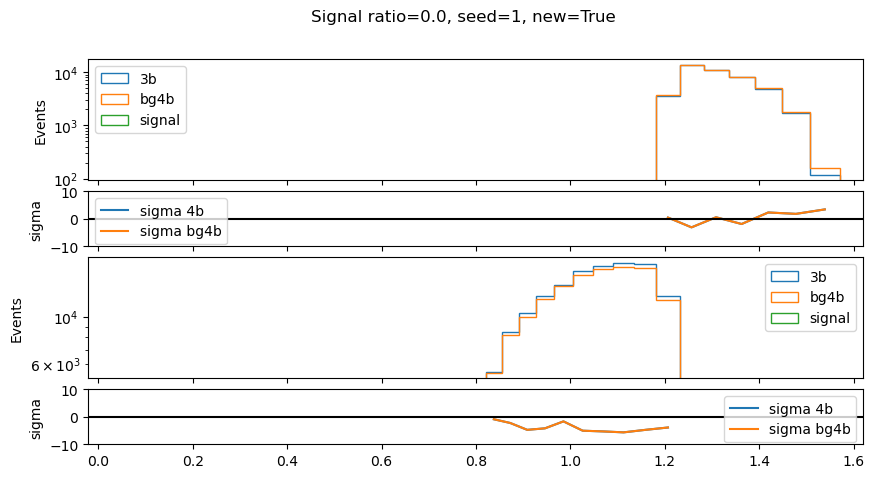

Signal ratio=0.0, seed=1, new=False
Sigma avg CR 7.5346017
Sigma avg bg4b CR 7.5346017
Sigma avg SR 8.399352
Sigma avg bg4b SR 8.399352
CR events 221874
SR events 63510


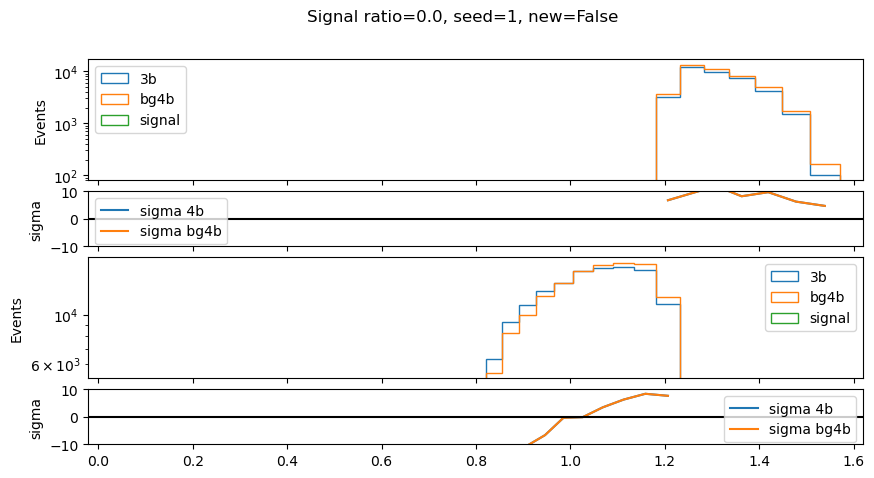

Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 6: 100%|██████████| 143/143 [00:05<00:00, 27.78it/s, v_num=1, val_loss=0.675, train_loss=0.676]


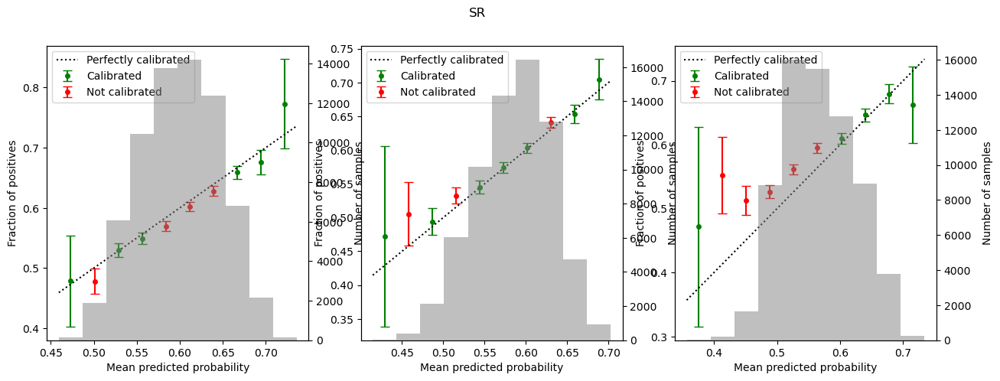

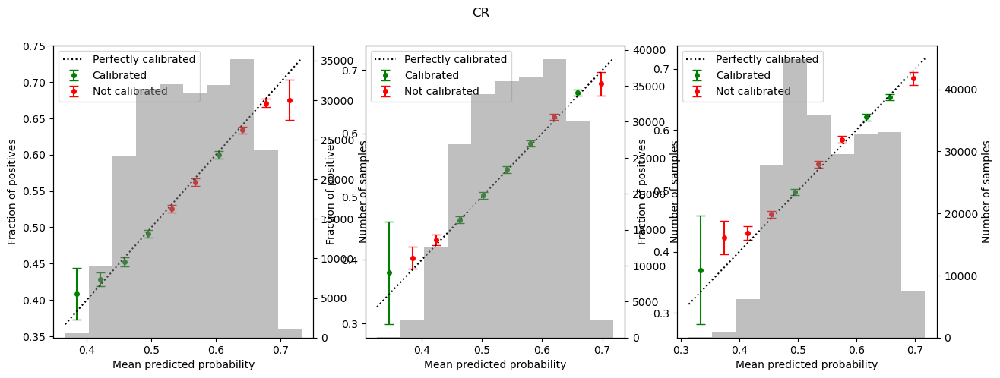

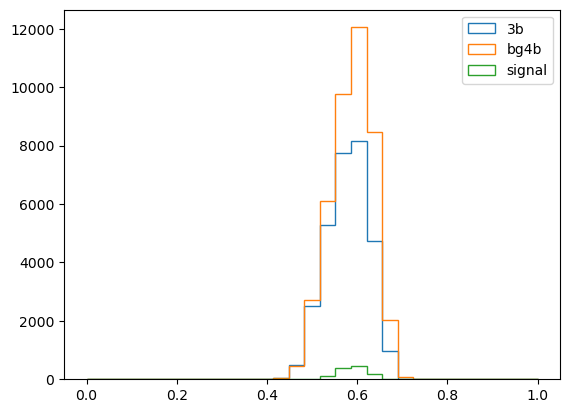

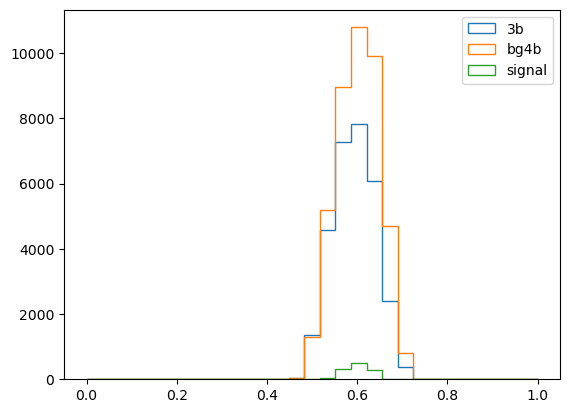

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=1, new=True
Sigma avg CR 2.8331053
Sigma avg bg4b CR 2.4450111
Sigma avg SR 2.5793958
Sigma avg bg4b SR 1.537594
CR events 218770
SR events 67986


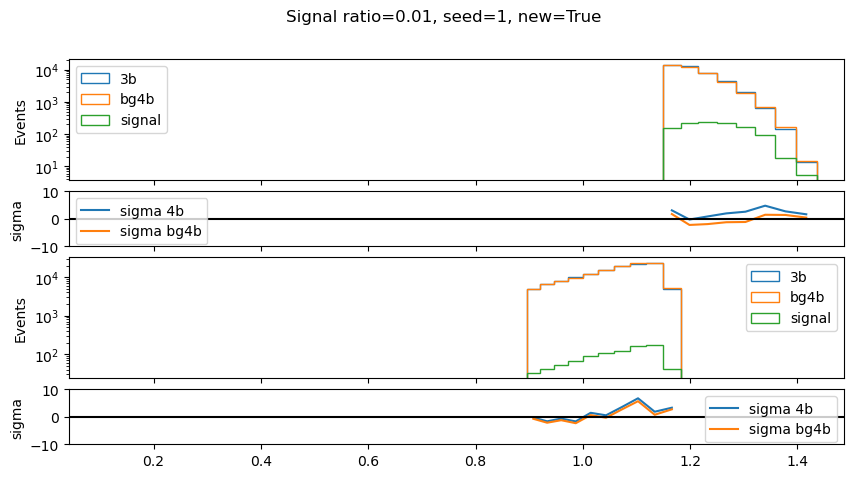

Signal ratio=0.01, seed=1, new=False
Sigma avg CR 4.1980414
Sigma avg bg4b CR 3.8641655
Sigma avg SR 7.628817
Sigma avg bg4b SR 5.1918993
CR events 218770
SR events 67986


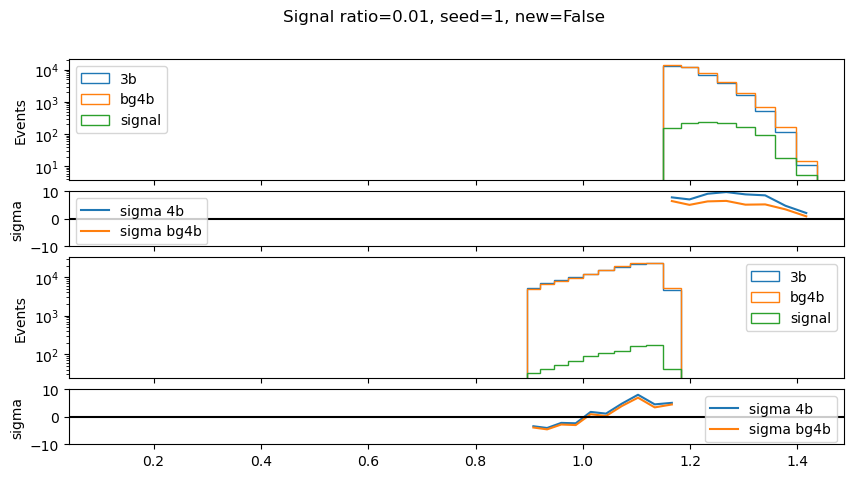

Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 7: 100%|██████████| 144/144 [00:04<00:00, 32.50it/s, v_num=1, val_loss=0.677, train_loss=0.677]


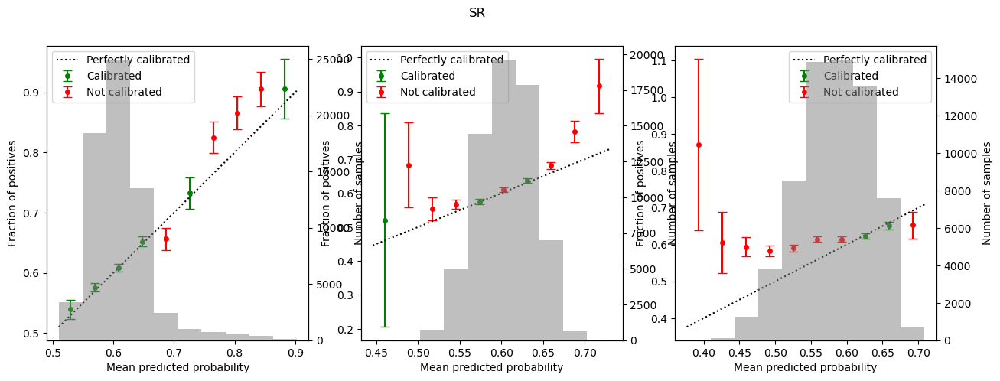

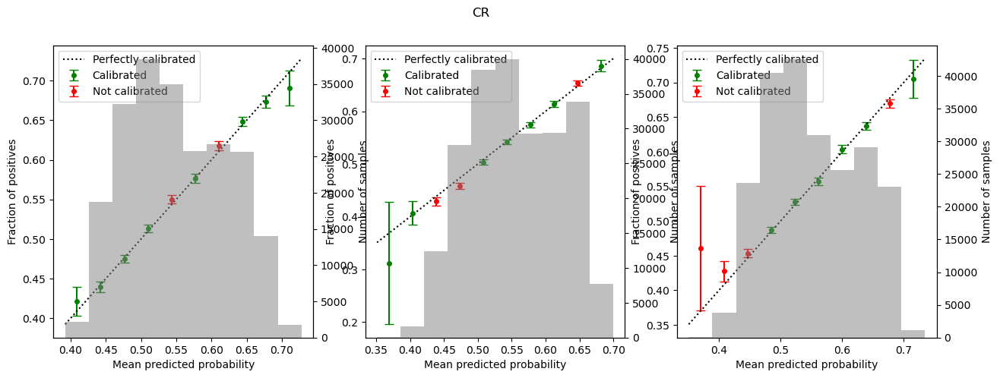

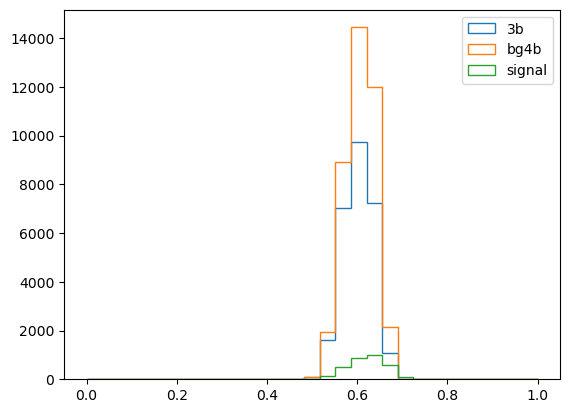

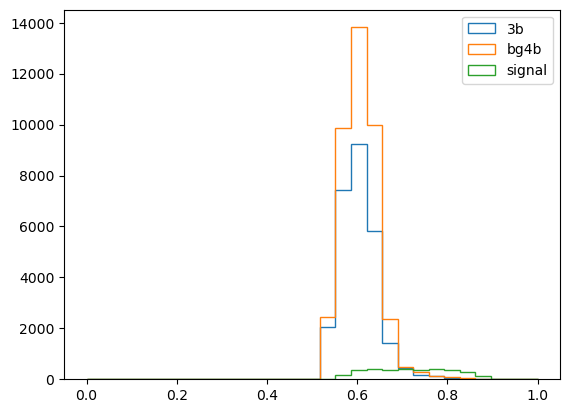

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=1, new=True
Sigma avg CR 2.903217
Sigma avg bg4b CR 3.3342745
Sigma avg SR 7.027791
Sigma avg bg4b SR 2.1680853
CR events 220340
SR events 65346


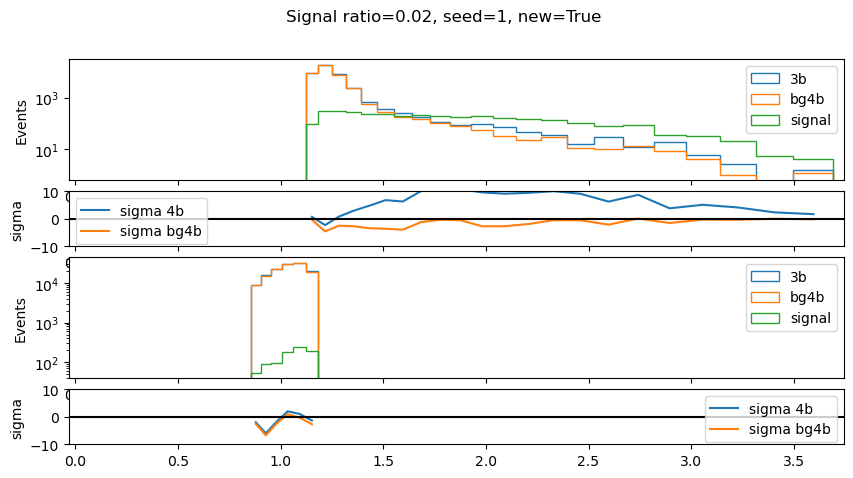

Signal ratio=0.02, seed=1, new=False
Sigma avg CR 4.9725857
Sigma avg bg4b CR 4.853675
Sigma avg SR 9.0481415
Sigma avg bg4b SR 2.0021713
CR events 220340
SR events 65346


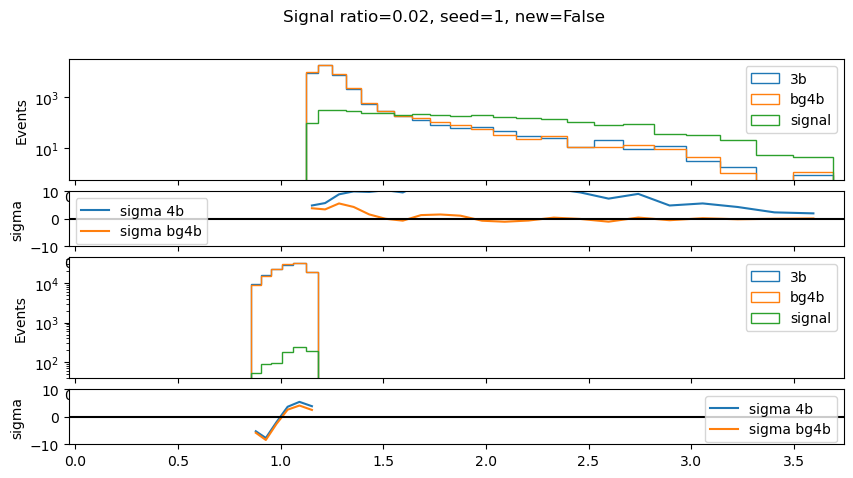

Seed set to 2
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 7: 100%|██████████| 141/141 [00:05<00:00, 25.73it/s, v_num=4, val_loss=0.674, train_loss=0.675]


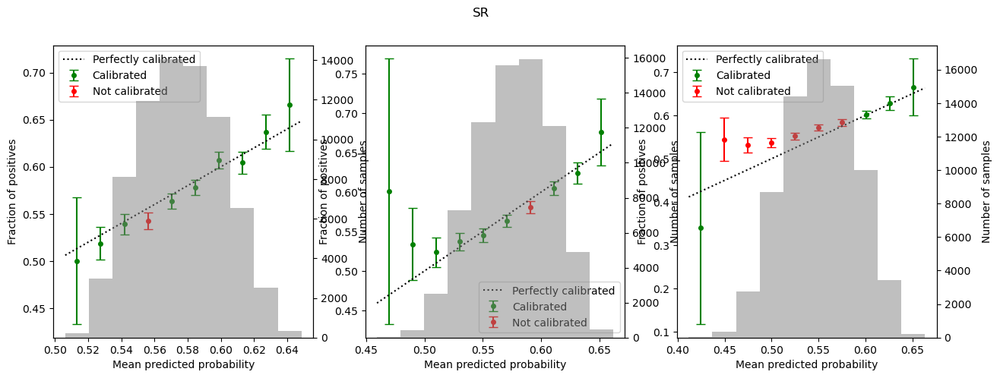

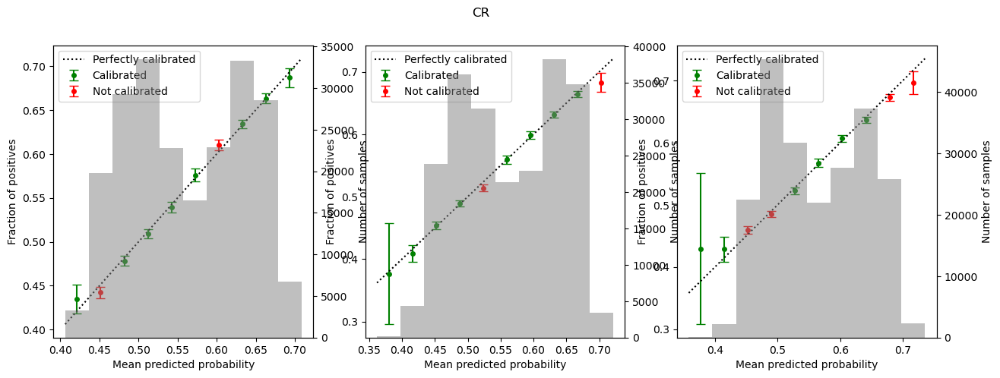

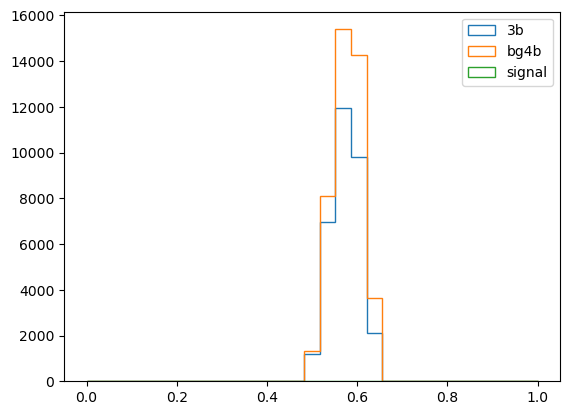

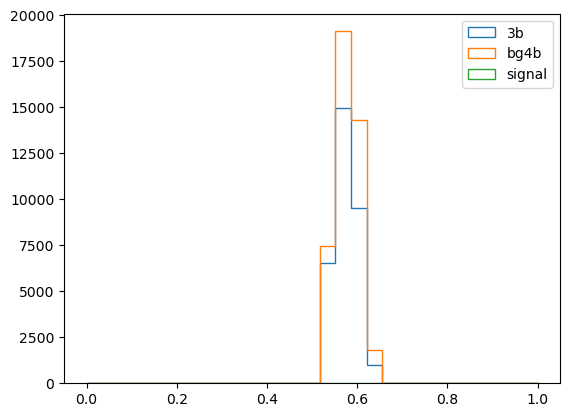

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=2, new=True
Sigma avg CR 1.440359
Sigma avg bg4b CR 1.440359
Sigma avg SR 2.698868
Sigma avg bg4b SR 2.698868
CR events 216485
SR events 71520


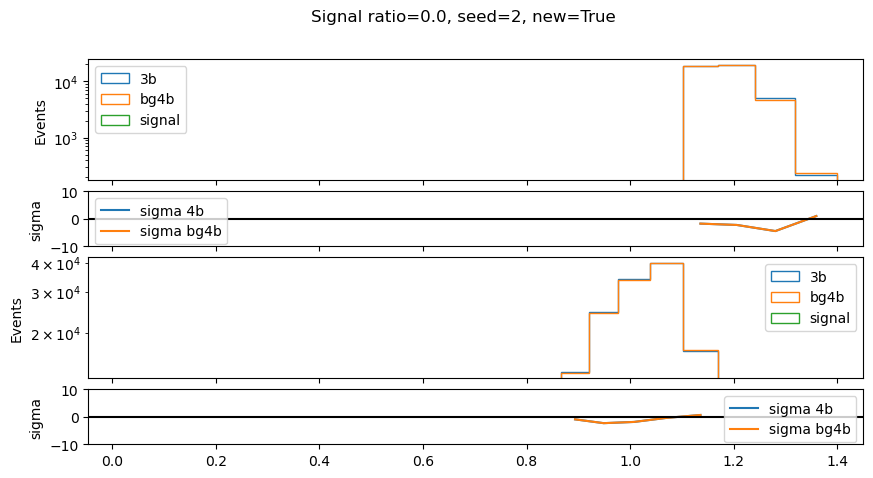

Signal ratio=0.0, seed=2, new=False
Sigma avg CR 5.9119782
Sigma avg bg4b CR 5.9119782
Sigma avg SR 8.023112
Sigma avg bg4b SR 8.023112
CR events 216485
SR events 71520


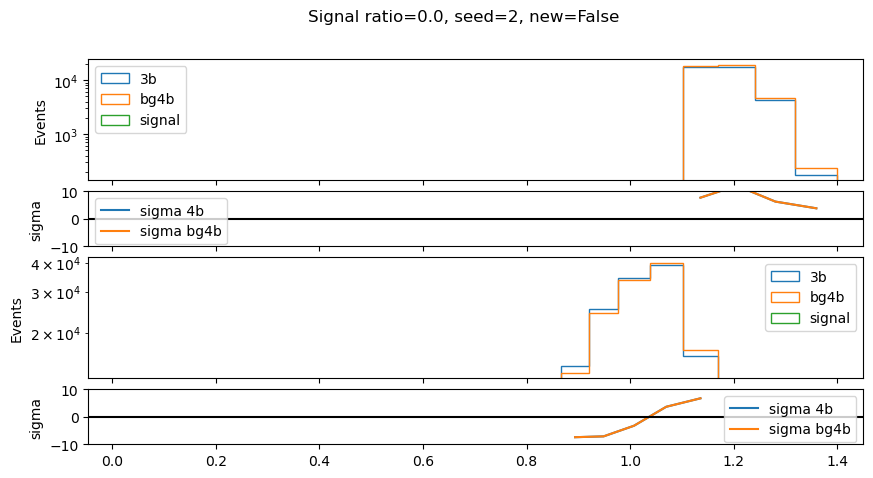

Seed set to 2
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 143/143 [00:04<00:00, 33.55it/s, v_num=1, val_loss=0.677, train_loss=0.676]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 143/143 [00:04<00:00, 33.50it/s, v_num=1, val_loss=0.677, train_loss=0.676]


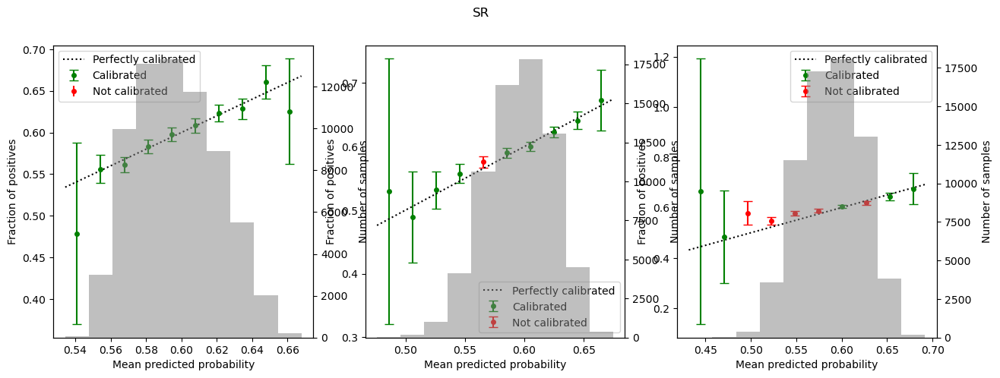

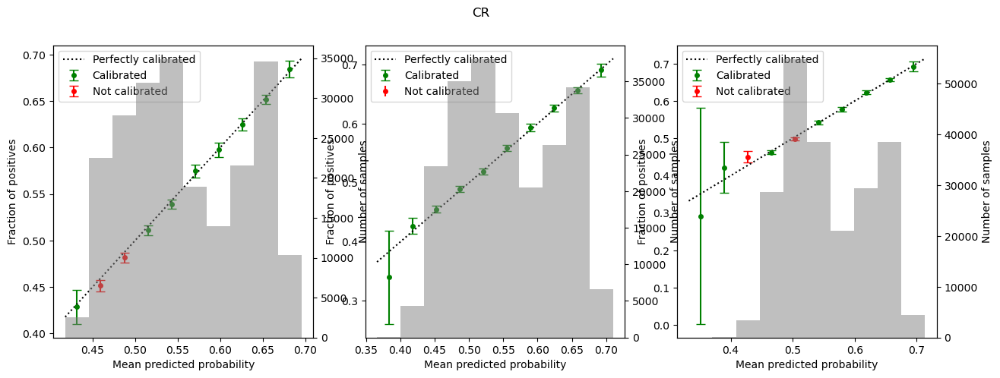

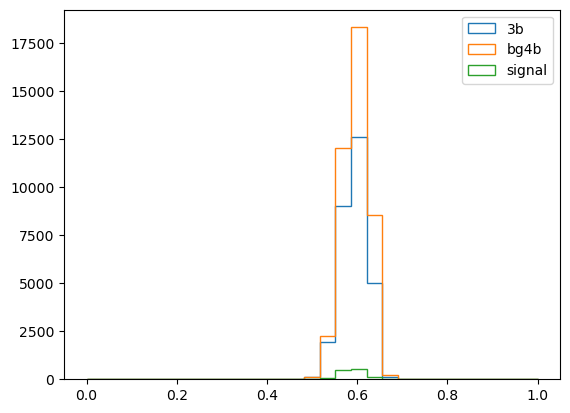

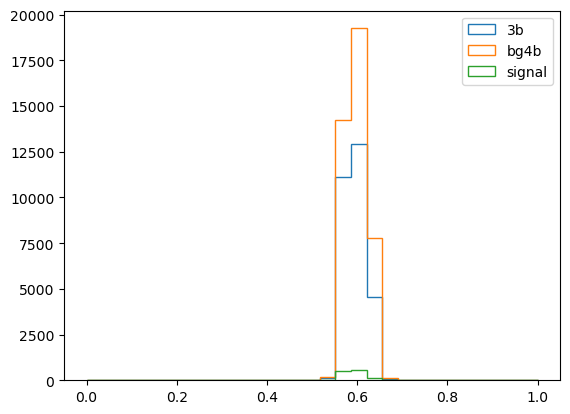

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=2, new=True
Sigma avg CR 2.0590327
Sigma avg bg4b CR 1.7690686
Sigma avg SR 2.533996
Sigma avg bg4b SR 3.1811712
CR events 219022
SR events 67865


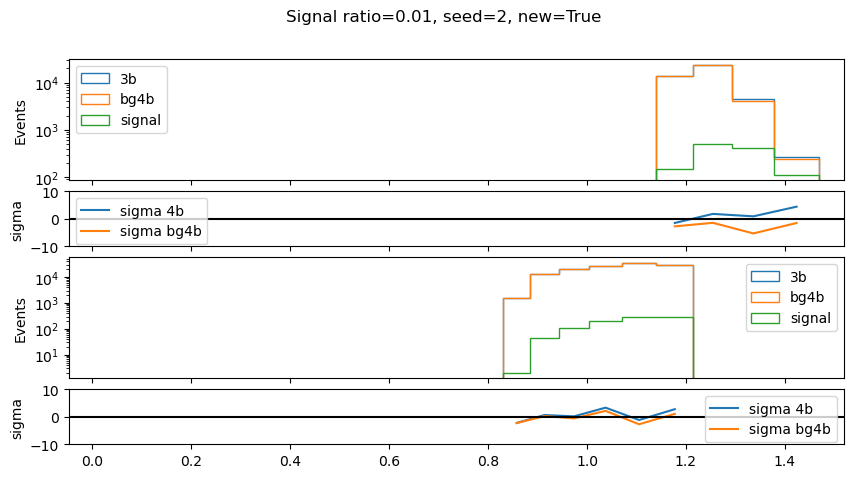

Signal ratio=0.01, seed=2, new=False
Sigma avg CR 4.3131456
Sigma avg bg4b CR 4.168986
Sigma avg SR 4.4548216
Sigma avg bg4b SR 1.9129401
CR events 219022
SR events 67865


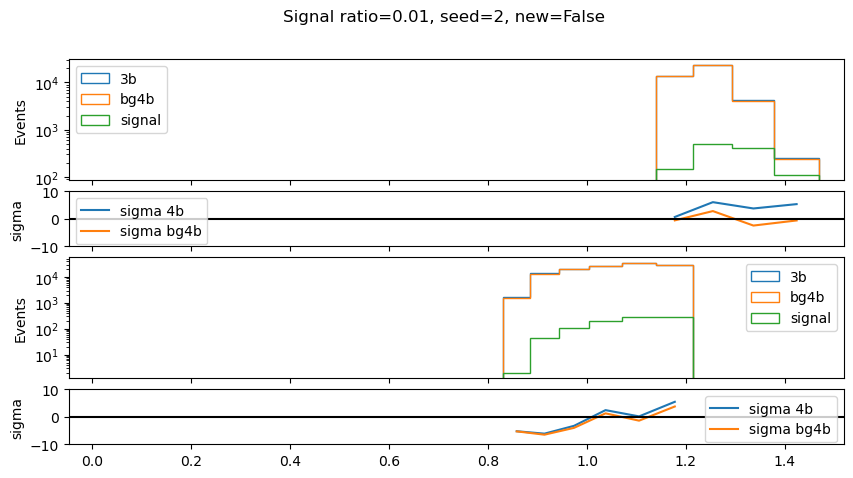

Seed set to 2
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 144/144 [00:02<00:00, 51.84it/s, v_num=1, val_loss=0.678, train_loss=0.678]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 144/144 [00:02<00:00, 49.84it/s, v_num=1, val_loss=0.678, train_loss=0.678]


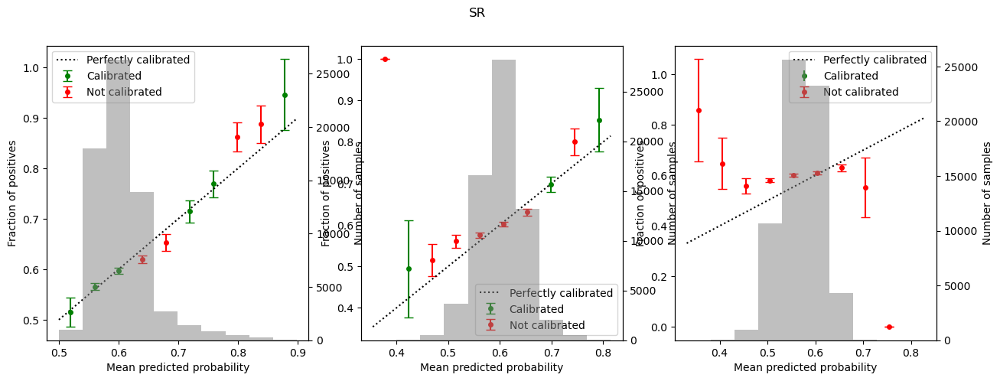

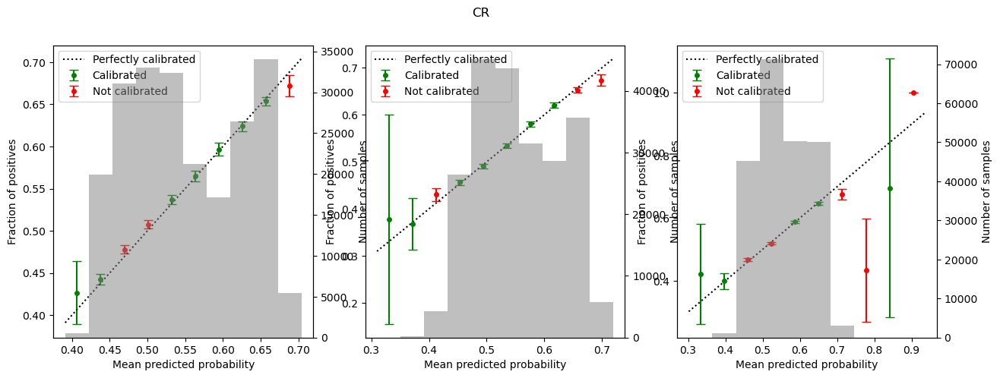

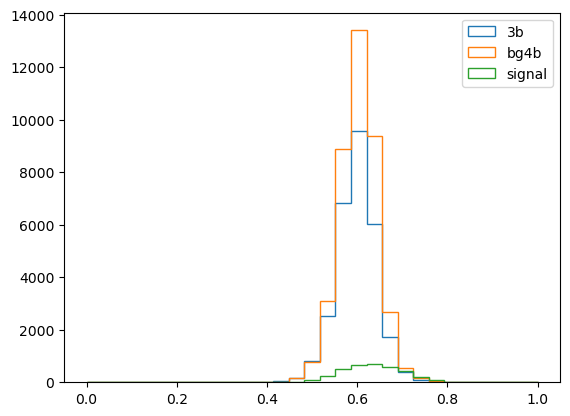

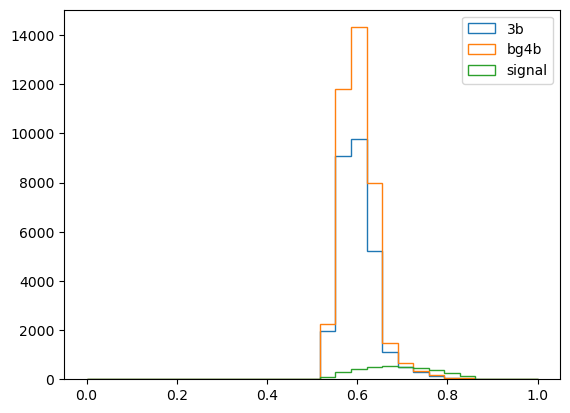

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=2, new=True
Sigma avg CR 1.6662639
Sigma avg bg4b CR 1.9886168
Sigma avg SR 5.4472647
Sigma avg bg4b SR 5.496288
CR events 221293
SR events 64923


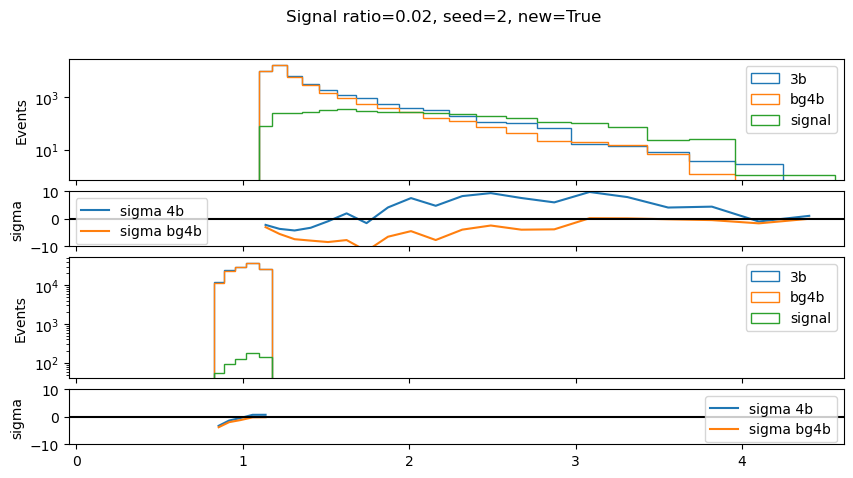

Signal ratio=0.02, seed=2, new=False
Sigma avg CR 5.6265044
Sigma avg bg4b CR 5.721331
Sigma avg SR 9.065451
Sigma avg bg4b SR 1.9762111
CR events 221293
SR events 64923


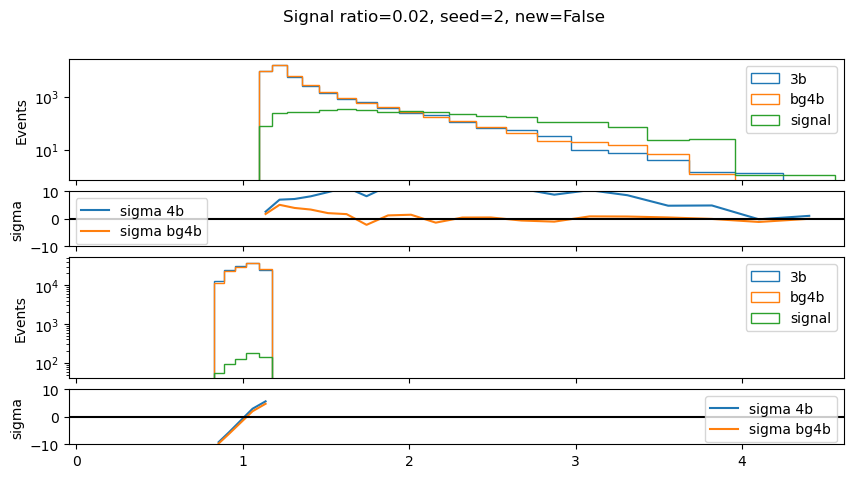

Seed set to 3
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 5: 100%|██████████| 144/144 [00:04<00:00, 33.04it/s, v_num=4, val_loss=0.680, train_loss=0.681]


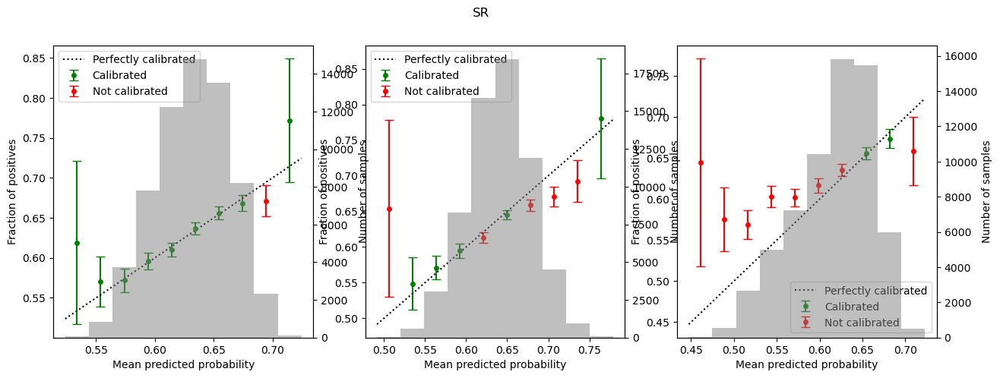

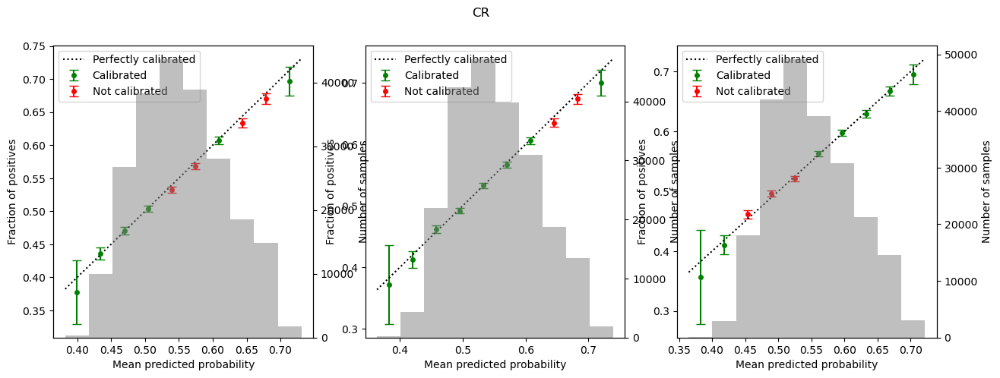

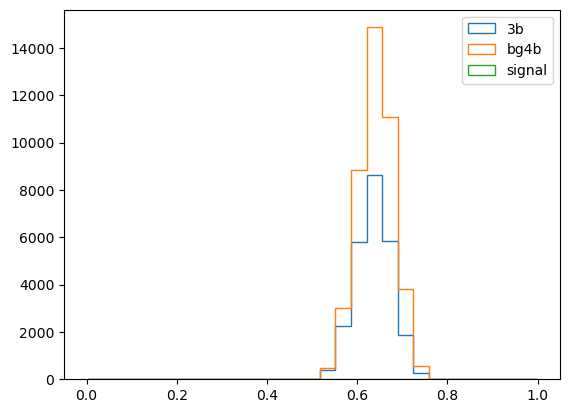

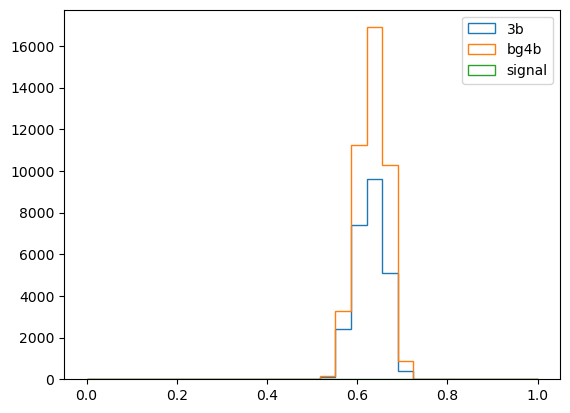

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=3, new=True
Sigma avg CR 1.9681803
Sigma avg bg4b CR 1.9681803
Sigma avg SR 3.892076
Sigma avg bg4b SR 3.892076
CR events 220949
SR events 63685


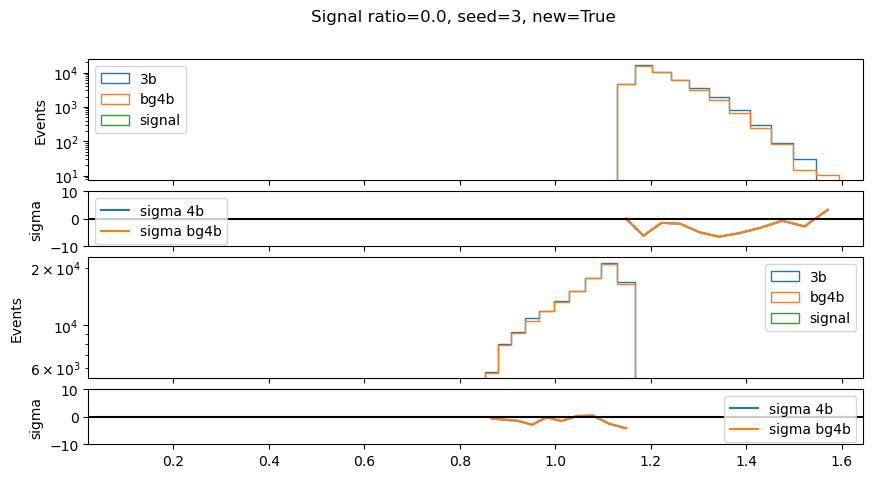

Signal ratio=0.0, seed=3, new=False
Sigma avg CR 4.202088
Sigma avg bg4b CR 4.202088
Sigma avg SR 4.6849885
Sigma avg bg4b SR 4.6849885
CR events 220949
SR events 63685


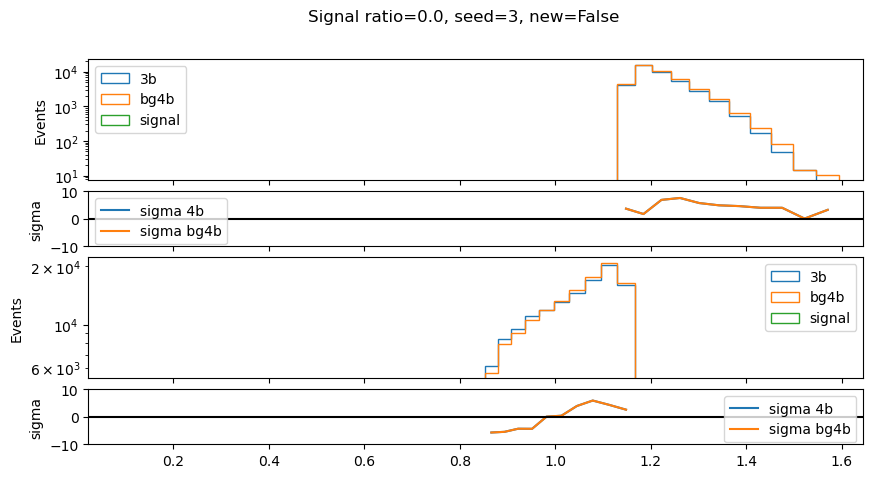

Seed set to 3
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 8: 100%|██████████| 145/145 [00:04<00:00, 34.99it/s, v_num=1, val_loss=0.679, train_loss=0.680]


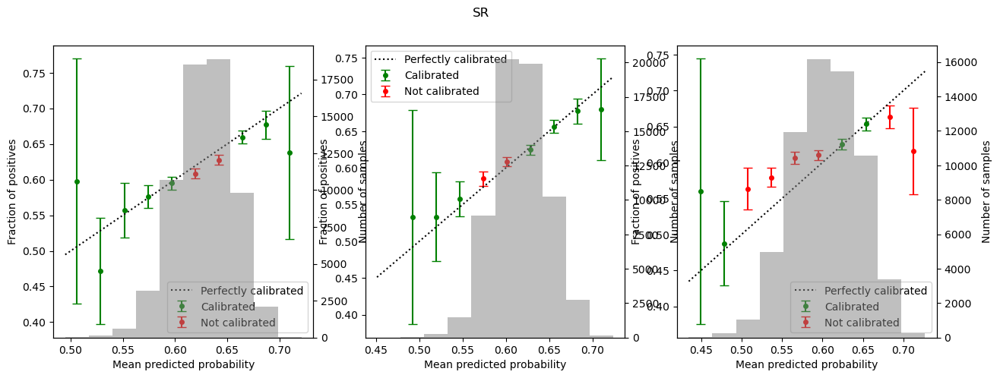

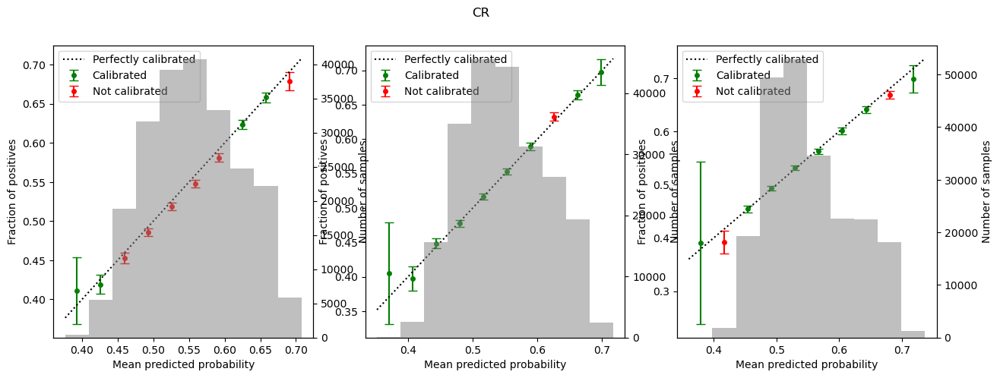

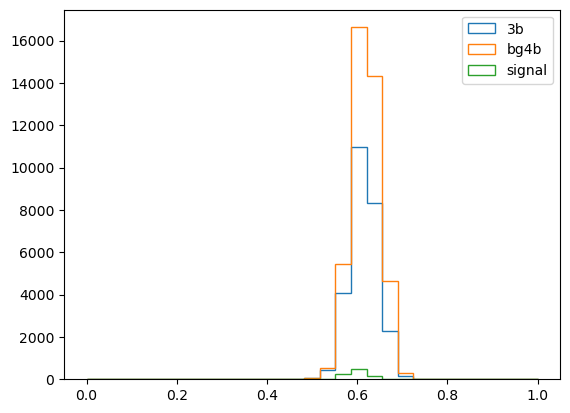

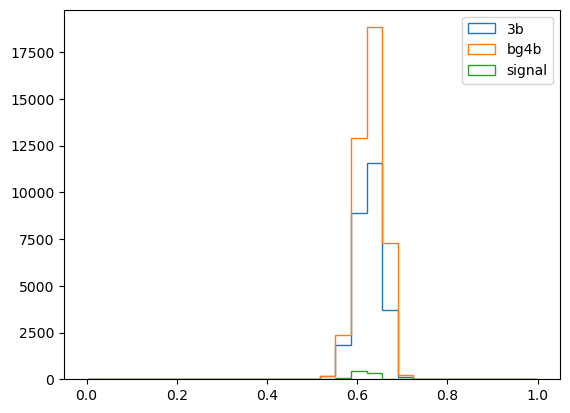

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=3, new=True
Sigma avg CR 1.2960706
Sigma avg bg4b CR 1.0425683
Sigma avg SR 1.2938952
Sigma avg bg4b SR 2.1965666
CR events 222494
SR events 63986


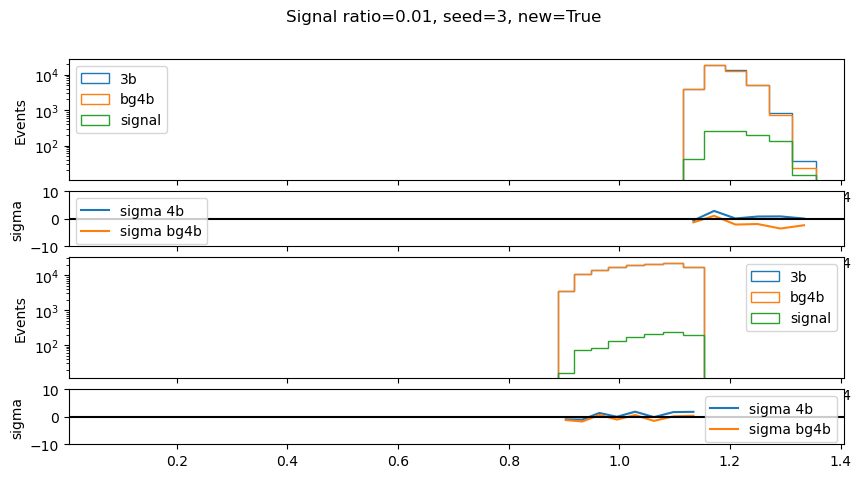

Signal ratio=0.01, seed=3, new=False
Sigma avg CR 5.2731867
Sigma avg bg4b CR 5.3783674
Sigma avg SR 4.6366305
Sigma avg bg4b SR 3.185731
CR events 222494
SR events 63986


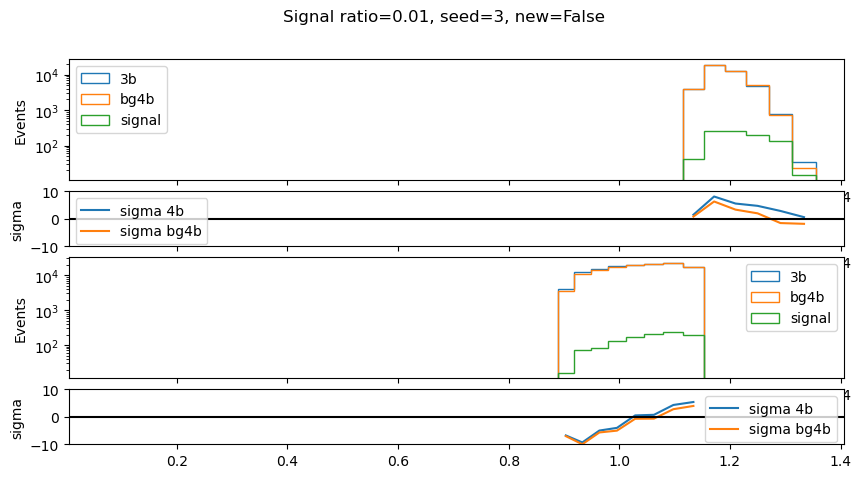

Seed set to 3
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 143/143 [00:03<00:00, 42.04it/s, v_num=1, val_loss=0.677, train_loss=0.677]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 143/143 [00:03<00:00, 40.61it/s, v_num=1, val_loss=0.677, train_loss=0.677]


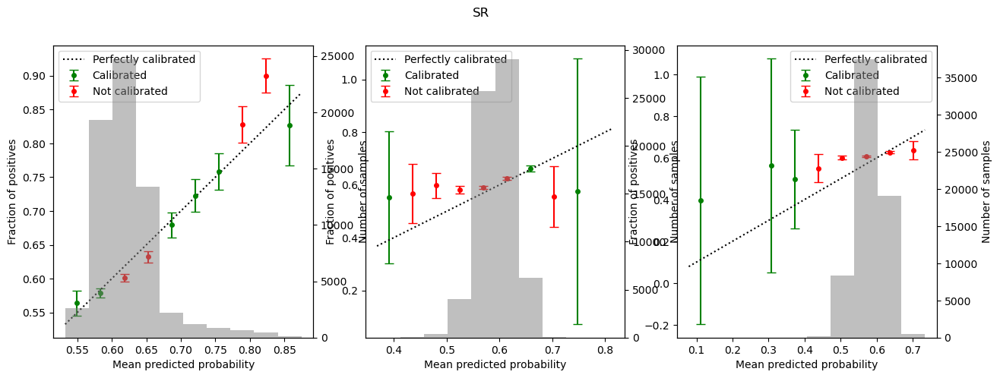

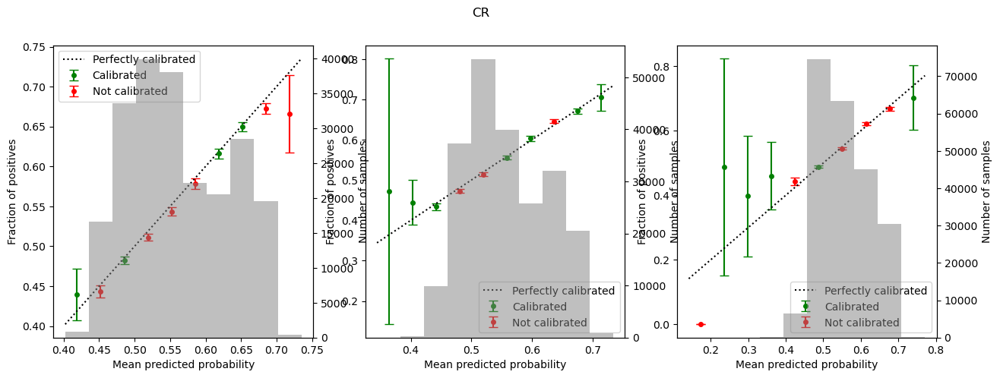

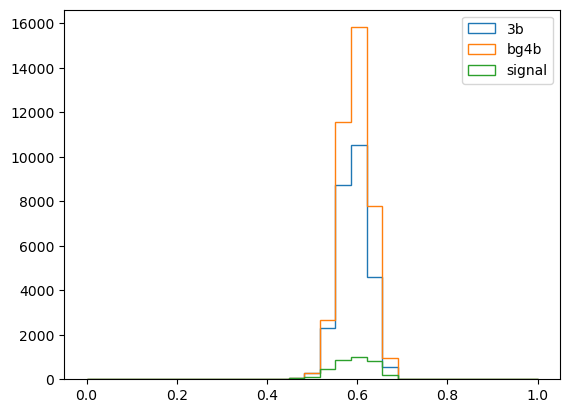

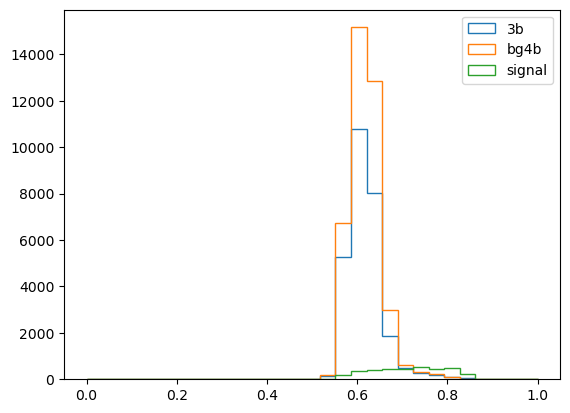

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=3, new=True
Sigma avg CR 3.6863704
Sigma avg bg4b CR 3.8544743
Sigma avg SR 7.9890146
Sigma avg bg4b SR 1.8174032
CR events 220025
SR events 65555


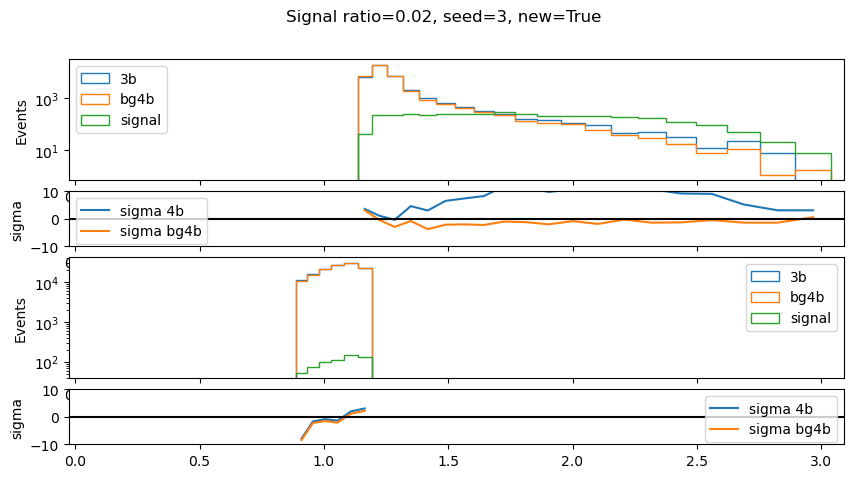

Signal ratio=0.02, seed=3, new=False
Sigma avg CR 5.7823334
Sigma avg bg4b CR 5.752797
Sigma avg SR 9.4948015
Sigma avg bg4b SR 1.7809787
CR events 220025
SR events 65555


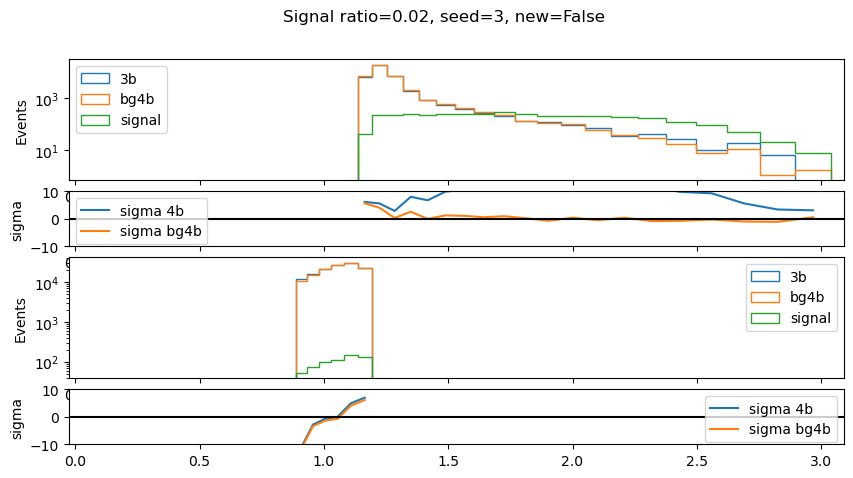

Seed set to 4
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 6: 100%|██████████| 145/145 [00:03<00:00, 42.40it/s, v_num=4, val_loss=0.677, train_loss=0.678]


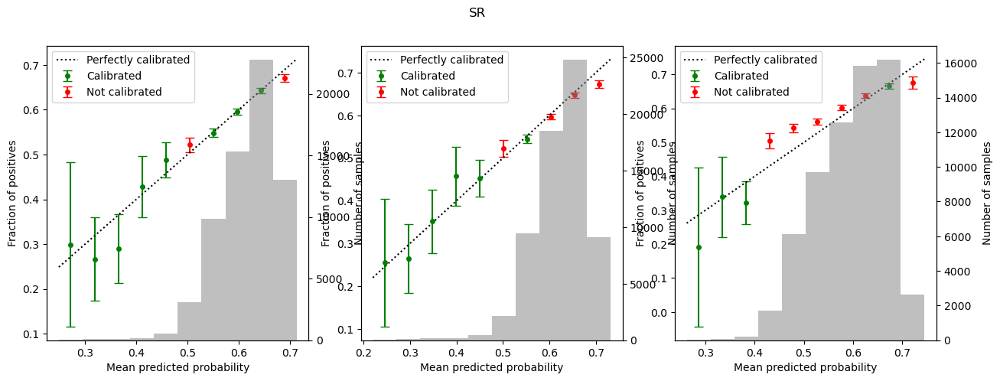

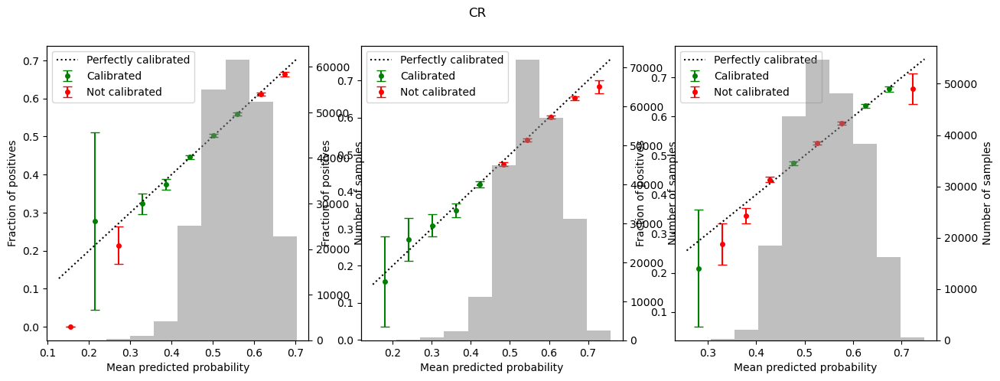

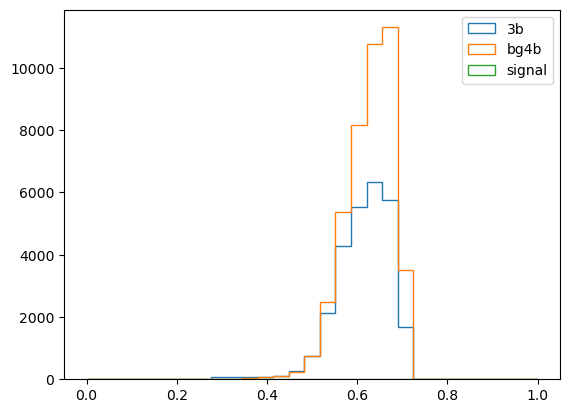

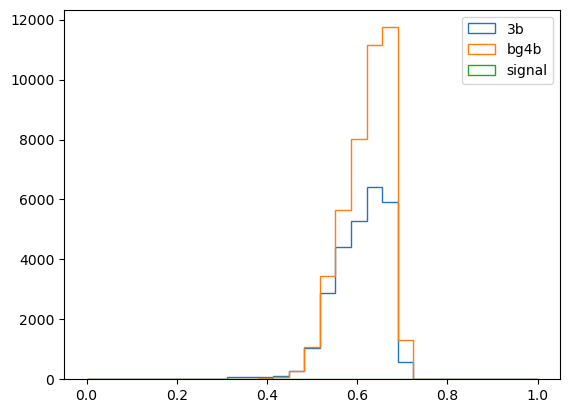

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=4, new=True
Sigma avg CR 4.7434406
Sigma avg bg4b CR 4.7434406
Sigma avg SR 3.9041715
Sigma avg bg4b SR 3.9041715
CR events 222222
SR events 65046


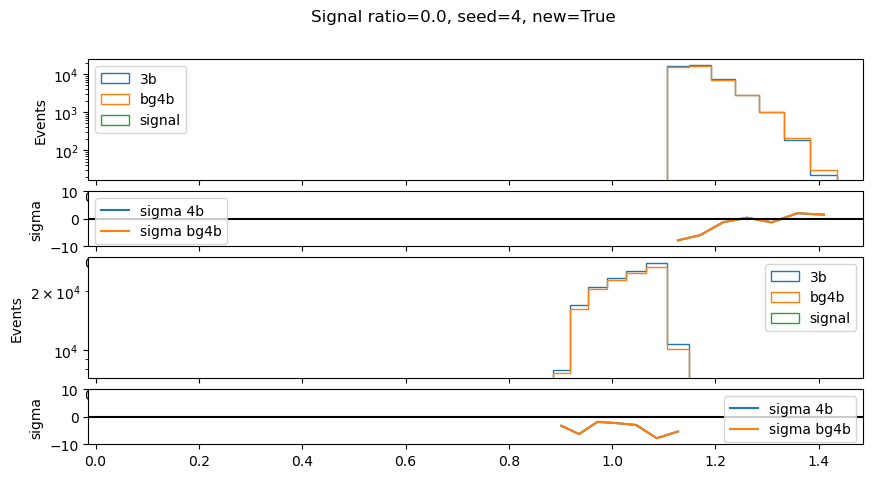

Signal ratio=0.0, seed=4, new=False
Sigma avg CR 4.9487886
Sigma avg bg4b CR 4.9487886
Sigma avg SR 6.4665413
Sigma avg bg4b SR 6.4665413
CR events 222222
SR events 65046


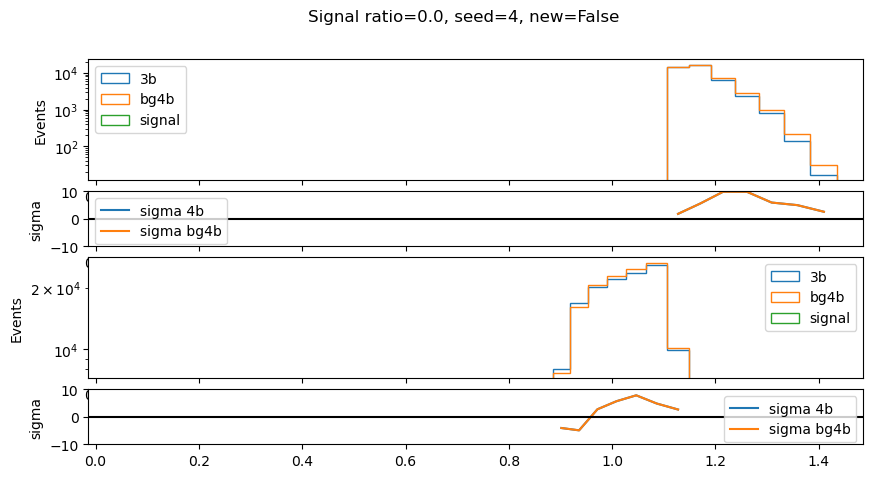

Seed set to 4
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 144/144 [00:02<00:00, 54.27it/s, v_num=1, val_loss=0.680, train_loss=0.682]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 144/144 [00:02<00:00, 53.92it/s, v_num=1, val_loss=0.680, train_loss=0.682]


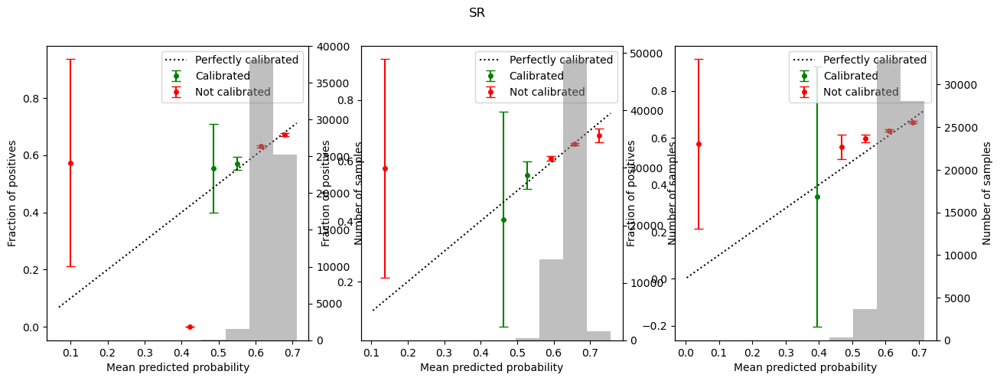

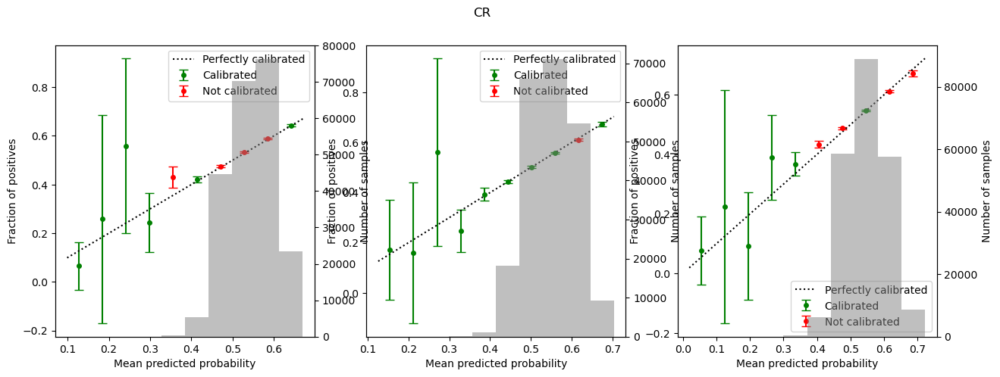

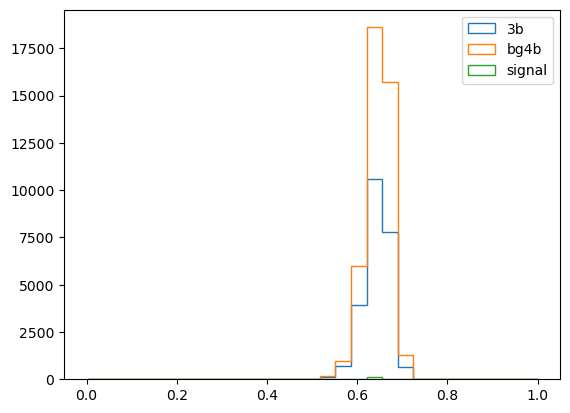

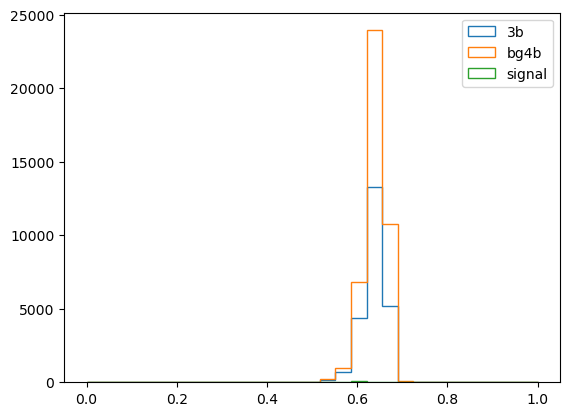

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=4, new=True
Sigma avg CR 2.1565013
Sigma avg bg4b CR 2.5982943
Sigma avg SR 1.5099536
Sigma avg bg4b SR 1.5710441
CR events 220358
SR events 64903


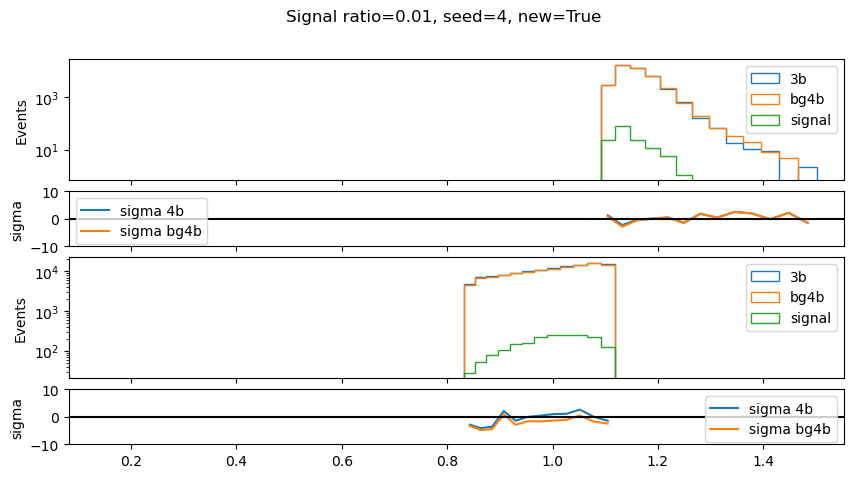

Signal ratio=0.01, seed=4, new=False
Sigma avg CR 3.4344976
Sigma avg bg4b CR 3.0131593
Sigma avg SR 2.5722346
Sigma avg bg4b SR 2.4473634
CR events 220358
SR events 64903


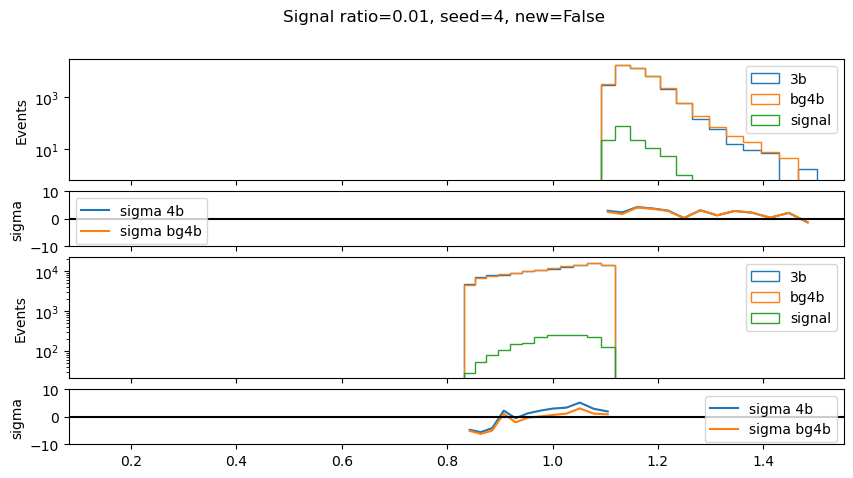

Seed set to 4
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 143/143 [00:02<00:00, 54.26it/s, v_num=1, val_loss=0.675, train_loss=0.675]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 143/143 [00:02<00:00, 53.88it/s, v_num=1, val_loss=0.675, train_loss=0.675]


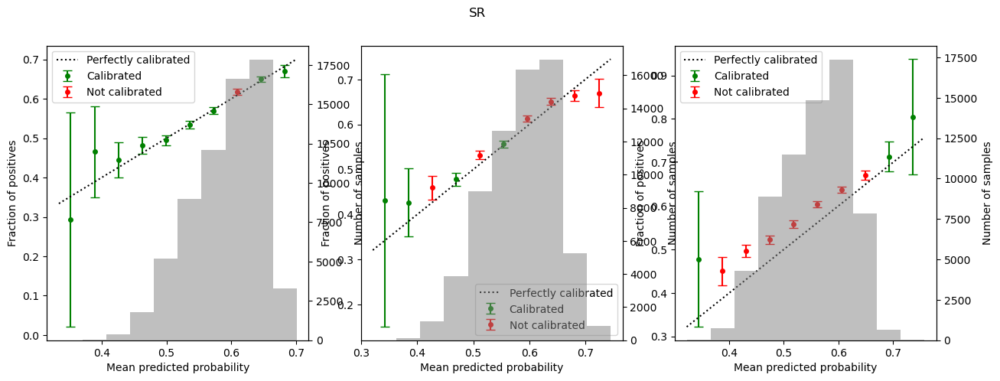

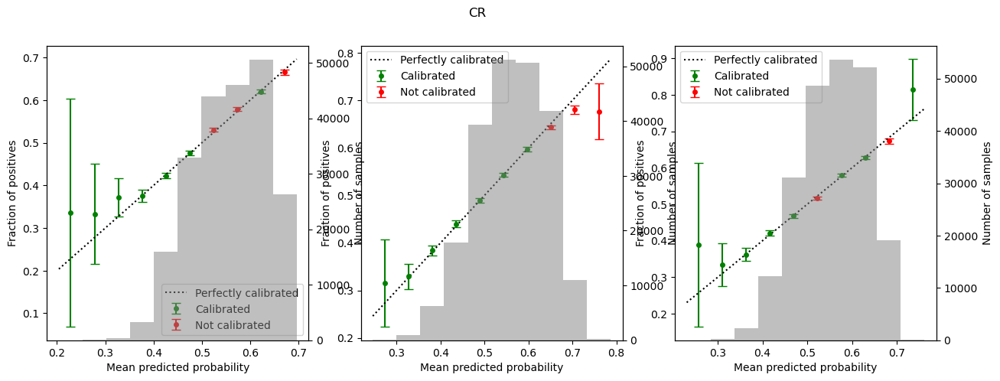

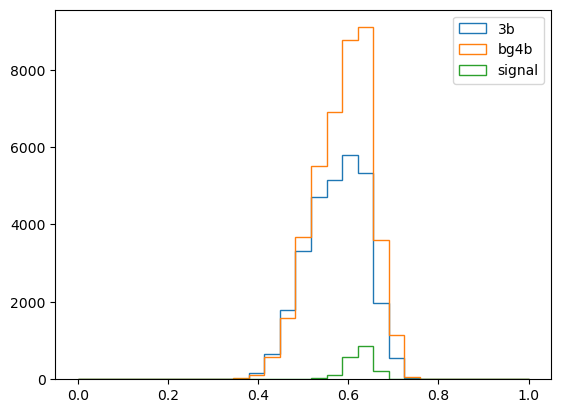

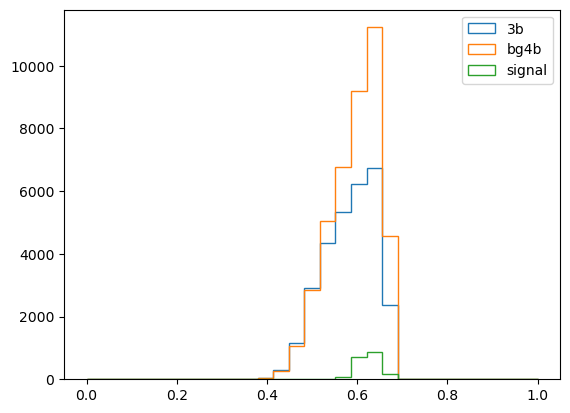

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=4, new=True
Sigma avg CR 2.8755648
Sigma avg bg4b CR 5.244398
Sigma avg SR 3.3020103
Sigma avg bg4b SR 1.4167842
CR events 219349
SR events 66188


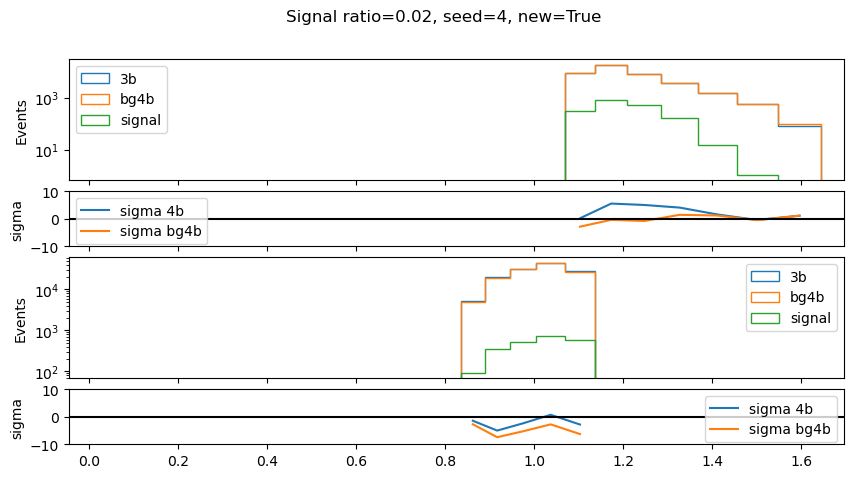

Signal ratio=0.02, seed=4, new=False
Sigma avg CR 8.0313835
Sigma avg bg4b CR 8.557965
Sigma avg SR 12.216106
Sigma avg bg4b SR 9.099678
CR events 219349
SR events 66188


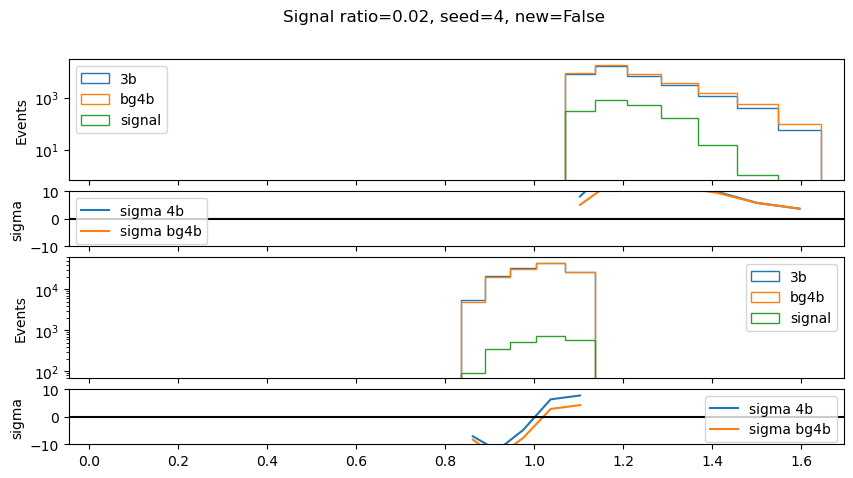

Seed set to 5
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 5: 100%|██████████| 140/140 [00:02<00:00, 47.75it/s, v_num=1, val_loss=0.672, train_loss=0.672]


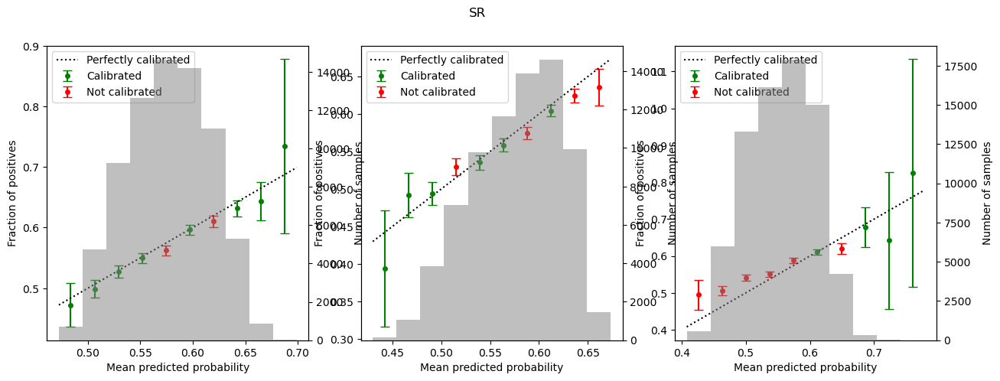

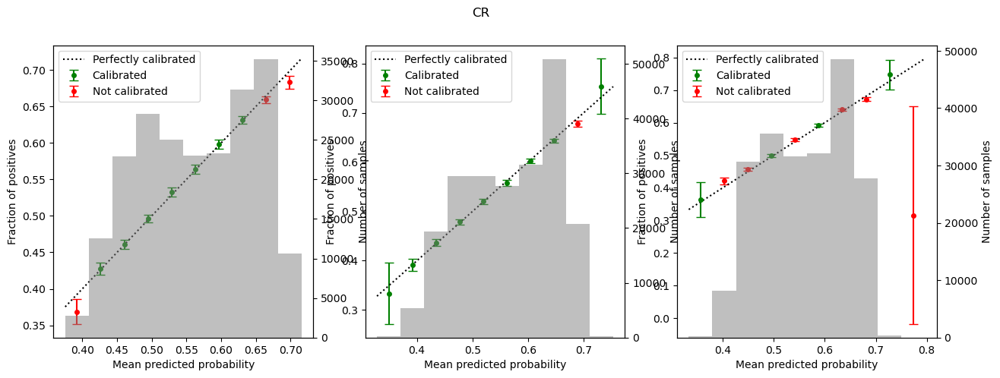

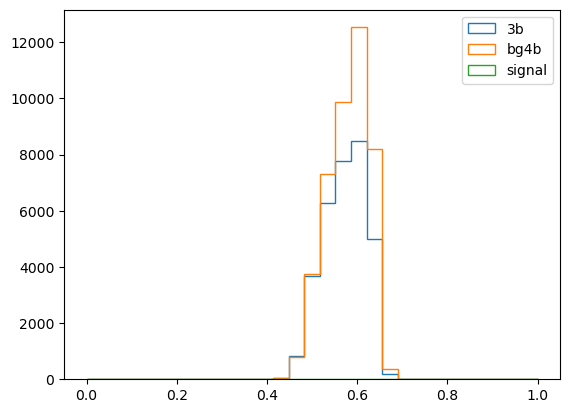

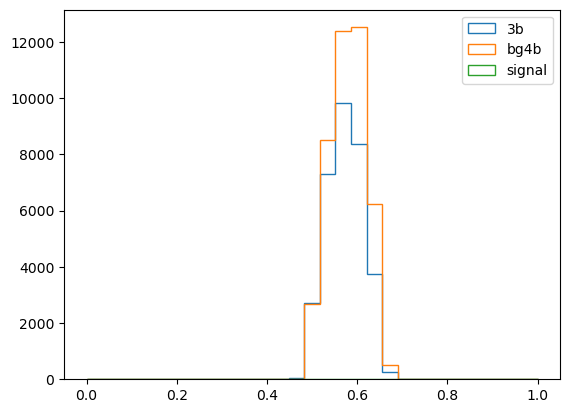

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=5, new=True
Sigma avg CR 1.9231746
Sigma avg bg4b CR 1.9231746
Sigma avg SR 2.664668
Sigma avg bg4b SR 2.664668
CR events 214995
SR events 73393


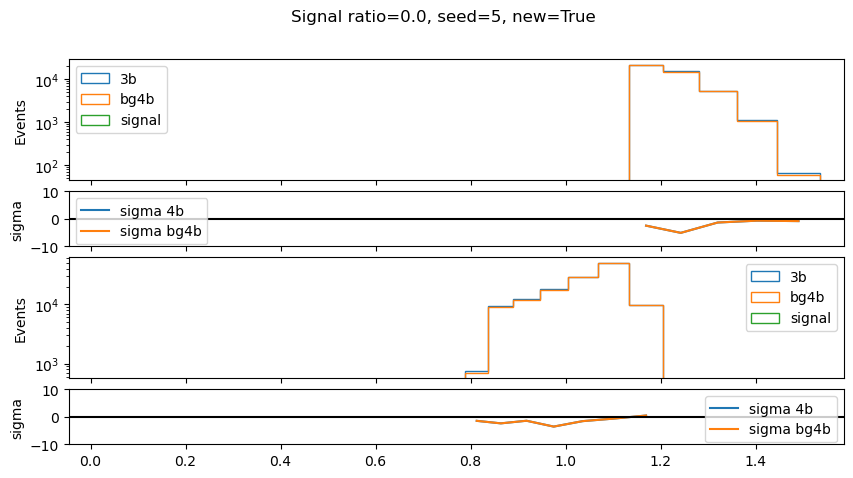

Signal ratio=0.0, seed=5, new=False
Sigma avg CR 4.1267514
Sigma avg bg4b CR 4.1267514
Sigma avg SR 5.332281
Sigma avg bg4b SR 5.332281
CR events 214995
SR events 73393


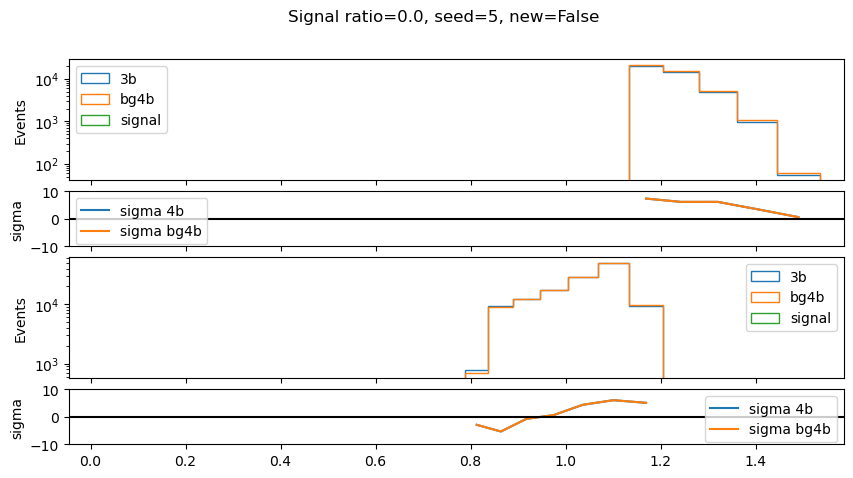

Seed set to 5
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 140/140 [00:02<00:00, 52.58it/s, v_num=1, val_loss=0.673, train_loss=0.673]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 140/140 [00:02<00:00, 50.32it/s, v_num=1, val_loss=0.673, train_loss=0.673]


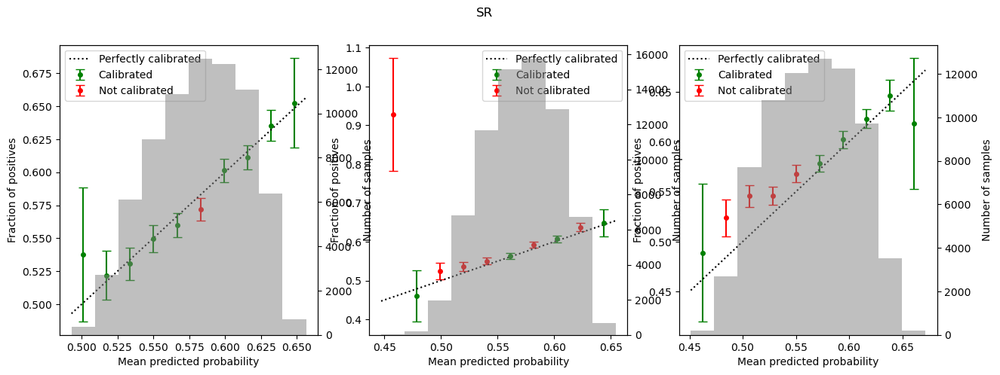

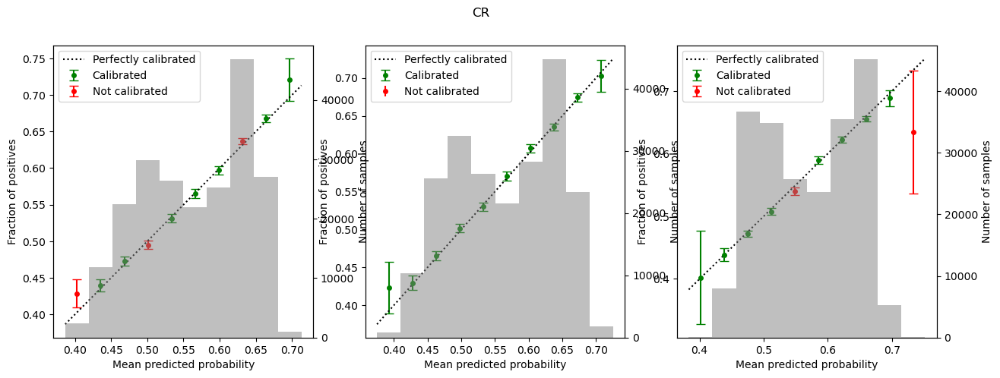

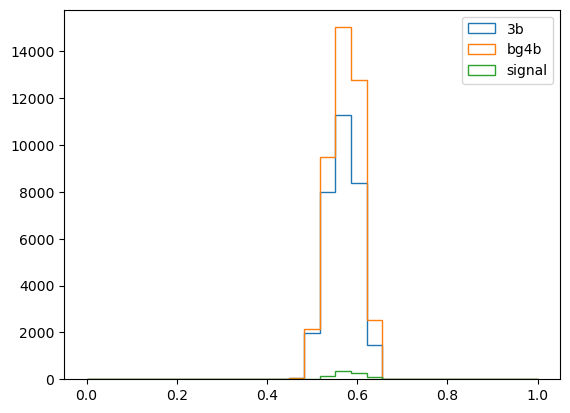

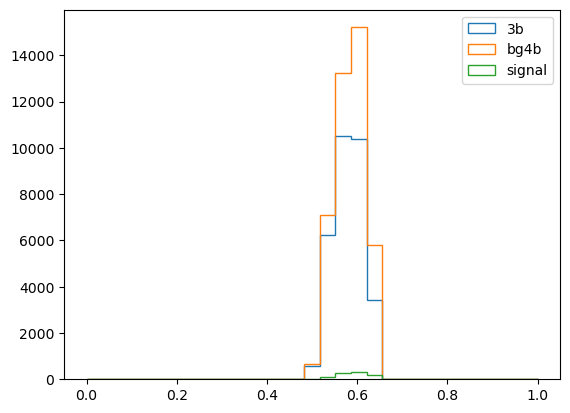

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=5, new=True
Sigma avg CR 3.9102538
Sigma avg bg4b CR 3.500464
Sigma avg SR 3.6750925
Sigma avg bg4b SR 2.1963105
CR events 215128
SR events 71797


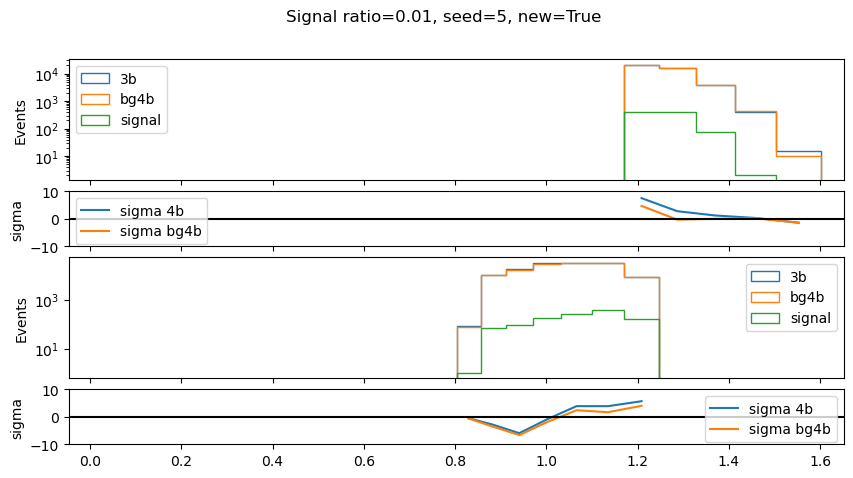

Signal ratio=0.01, seed=5, new=False
Sigma avg CR 5.240314
Sigma avg bg4b CR 5.3999257
Sigma avg SR 5.324409
Sigma avg bg4b SR 3.5268795
CR events 215128
SR events 71797


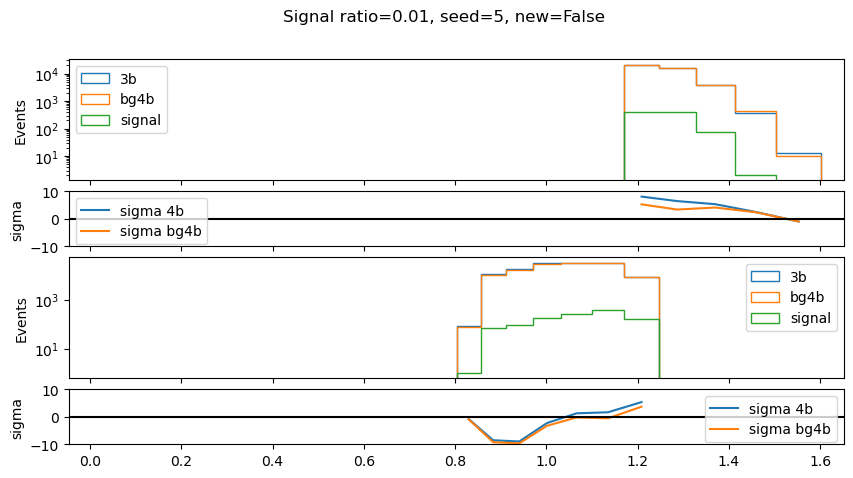

Seed set to 5
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 8: 100%|██████████| 142/142 [00:03<00:00, 38.58it/s, v_num=1, val_loss=0.676, train_loss=0.676]


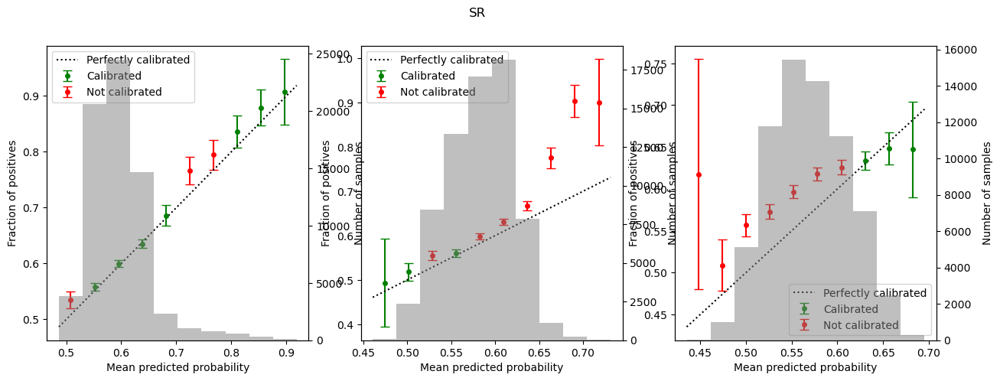

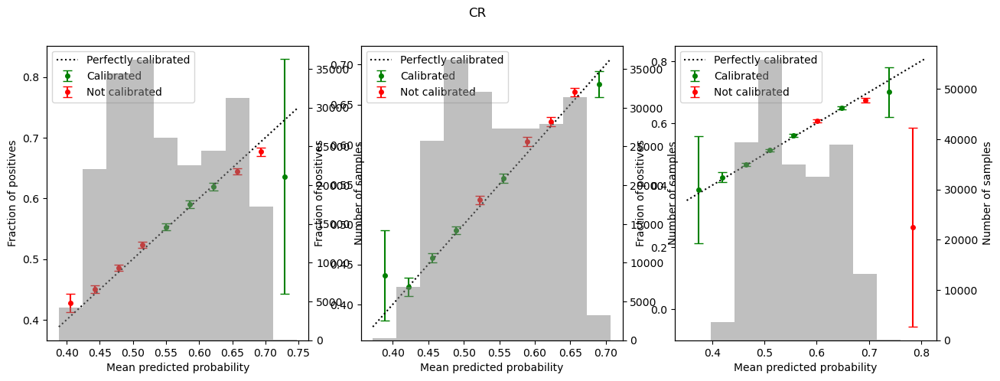

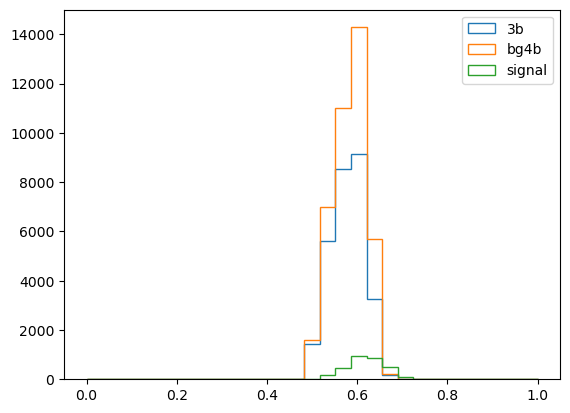

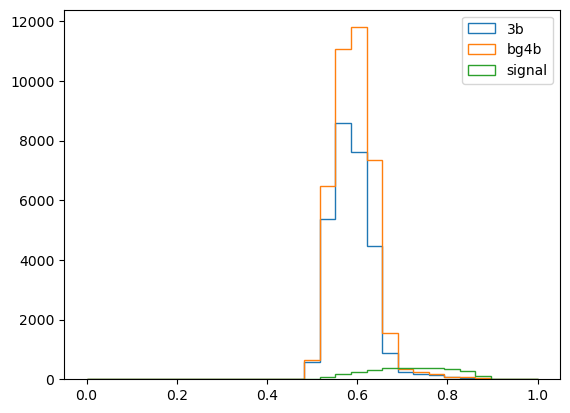

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=5, new=True
Sigma avg CR 4.258547
Sigma avg bg4b CR 3.318794
Sigma avg SR 7.362595
Sigma avg bg4b SR 1.6544361
CR events 218274
SR events 68708


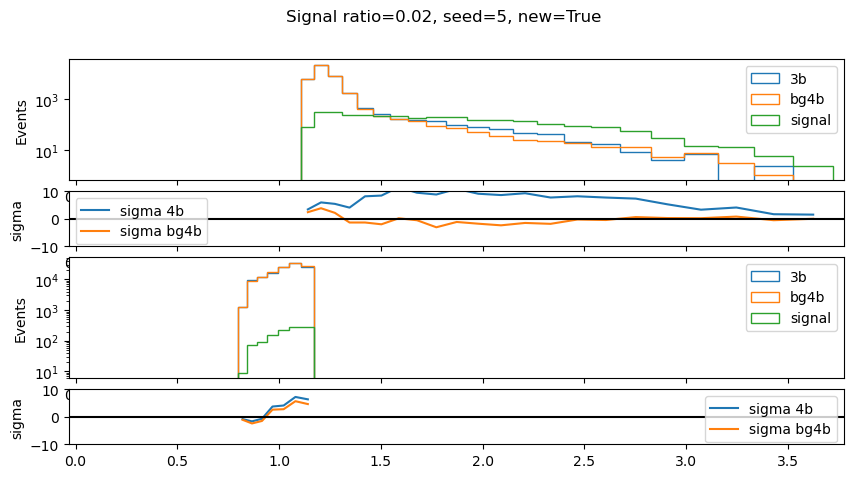

Signal ratio=0.02, seed=5, new=False
Sigma avg CR 4.898545
Sigma avg bg4b CR 4.701793
Sigma avg SR 9.147281
Sigma avg bg4b SR 2.7934766
CR events 218274
SR events 68708


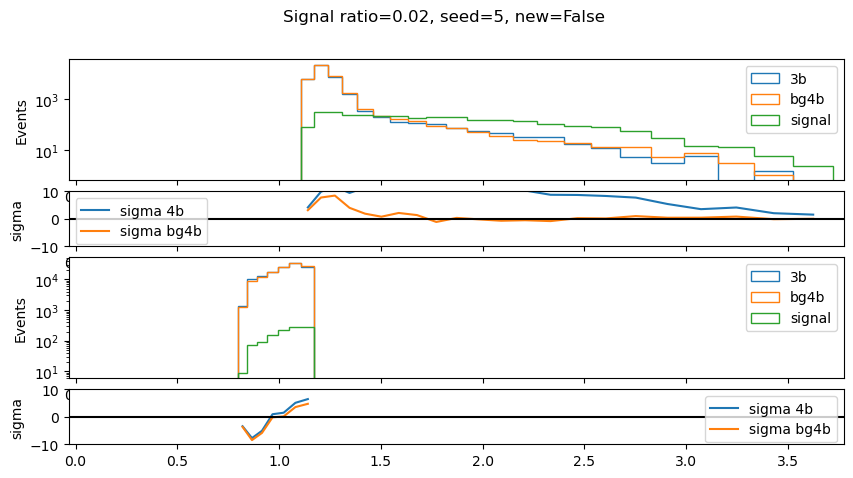

Seed set to 6
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 8: 100%|██████████| 144/144 [00:02<00:00, 54.44it/s, v_num=1, val_loss=0.678, train_loss=0.679]


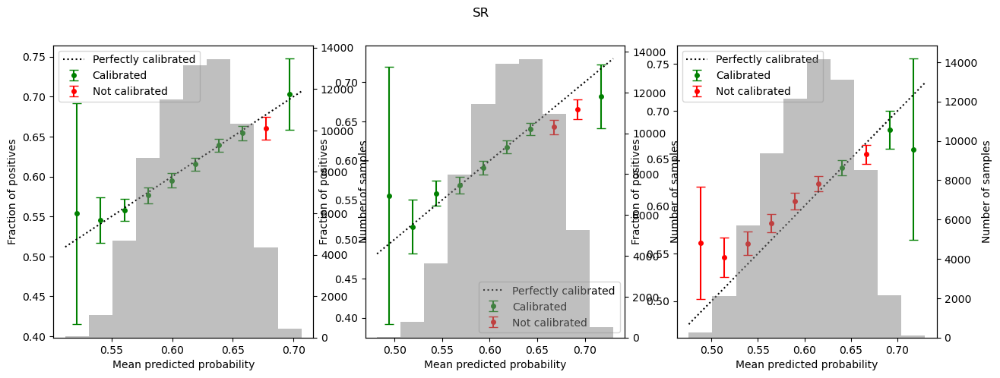

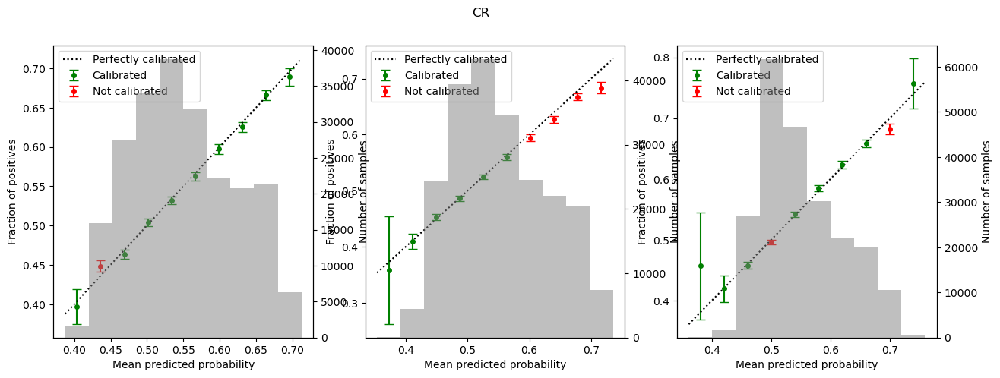

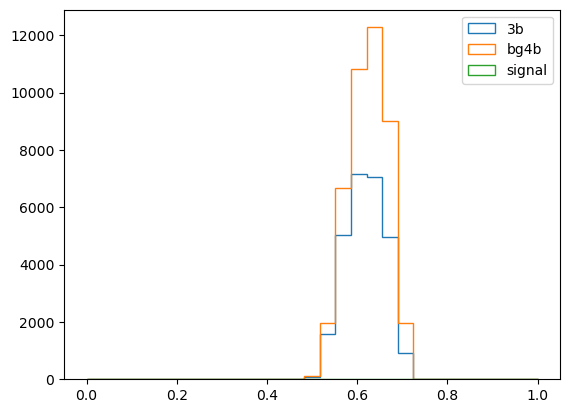

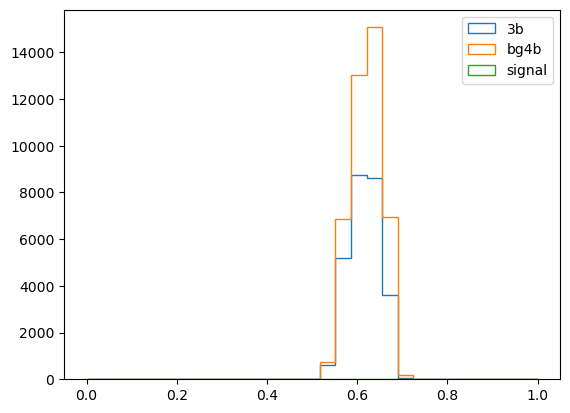

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=6, new=True
Sigma avg CR 3.0637808
Sigma avg bg4b CR 3.0637808
Sigma avg SR 4.138662
Sigma avg bg4b SR 4.138662
CR events 220351
SR events 67660


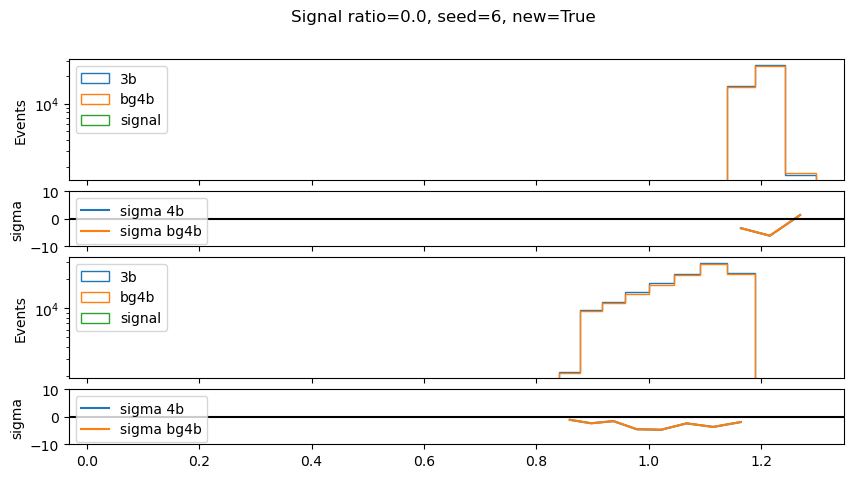

Signal ratio=0.0, seed=6, new=False
Sigma avg CR 4.7164903
Sigma avg bg4b CR 4.7164903
Sigma avg SR 3.9247363
Sigma avg bg4b SR 3.9247363
CR events 220351
SR events 67660


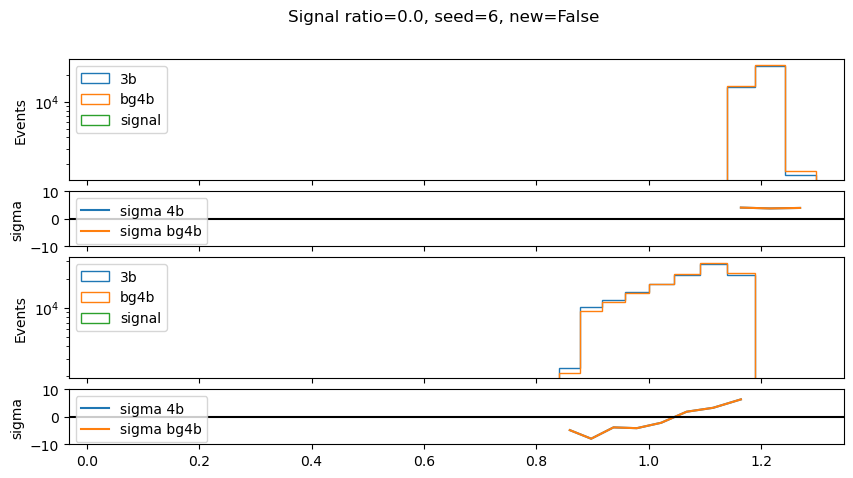

Seed set to 6
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 7: 100%|██████████| 143/143 [00:02<00:00, 53.79it/s, v_num=1, val_loss=0.678, train_loss=0.679]


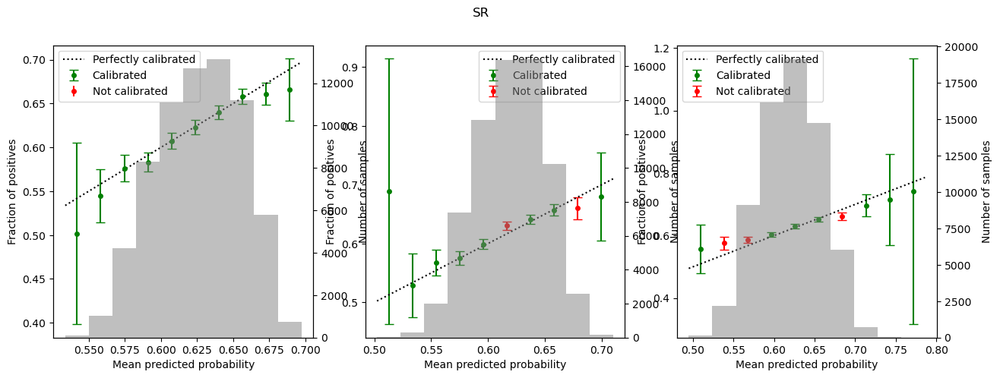

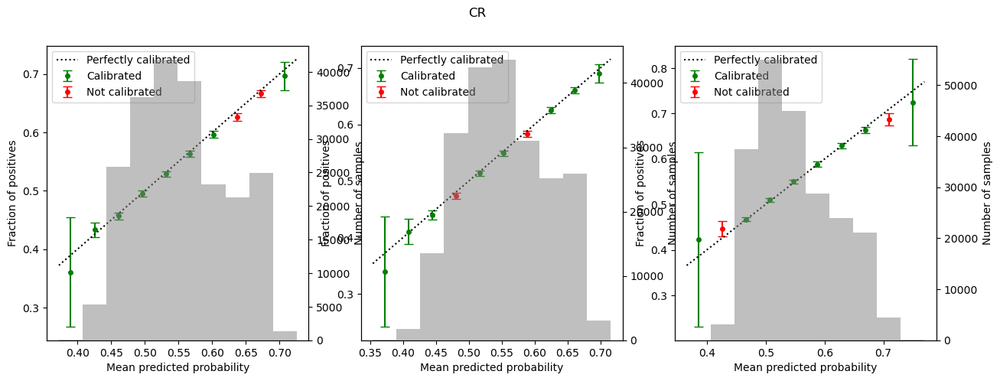

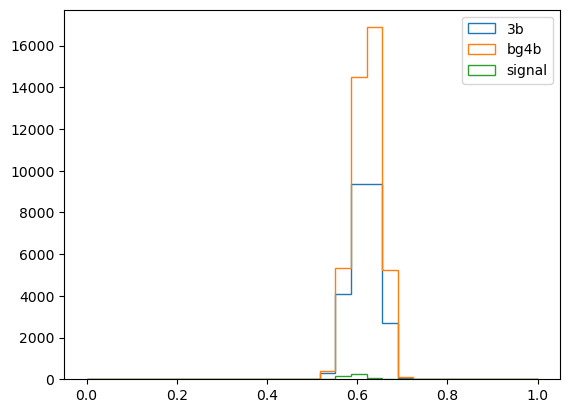

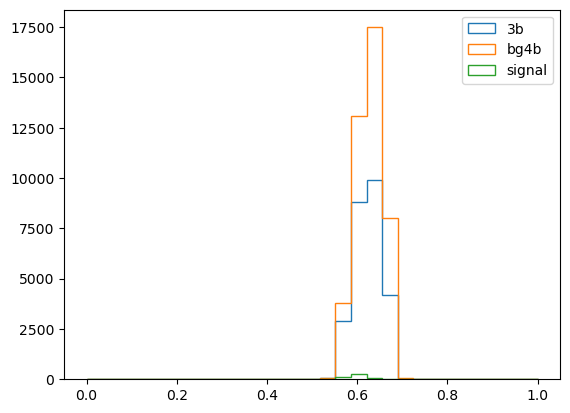

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=6, new=True
Sigma avg CR 2.9117086
Sigma avg bg4b CR 3.7055633
Sigma avg SR 1.6951768
Sigma avg bg4b SR 1.3134099
CR events 218765
SR events 68263


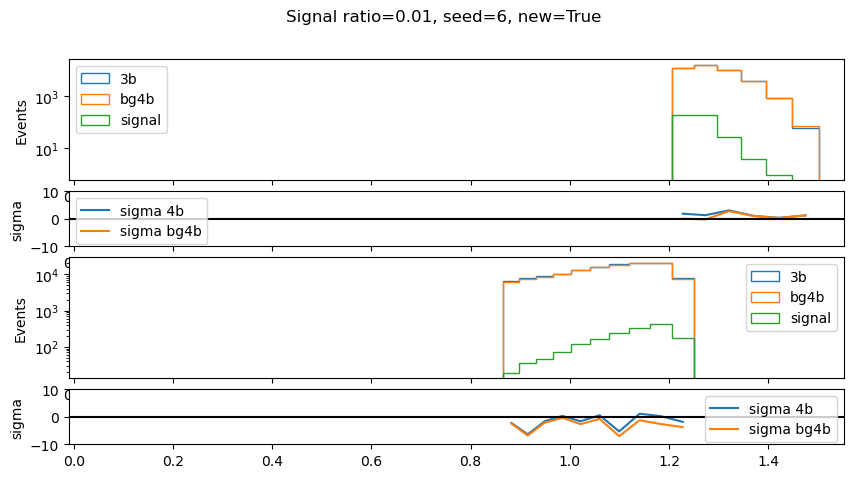

Signal ratio=0.01, seed=6, new=False
Sigma avg CR 3.892069
Sigma avg bg4b CR 3.731894
Sigma avg SR 1.5856732
Sigma avg bg4b SR 0.974784
CR events 218765
SR events 68263


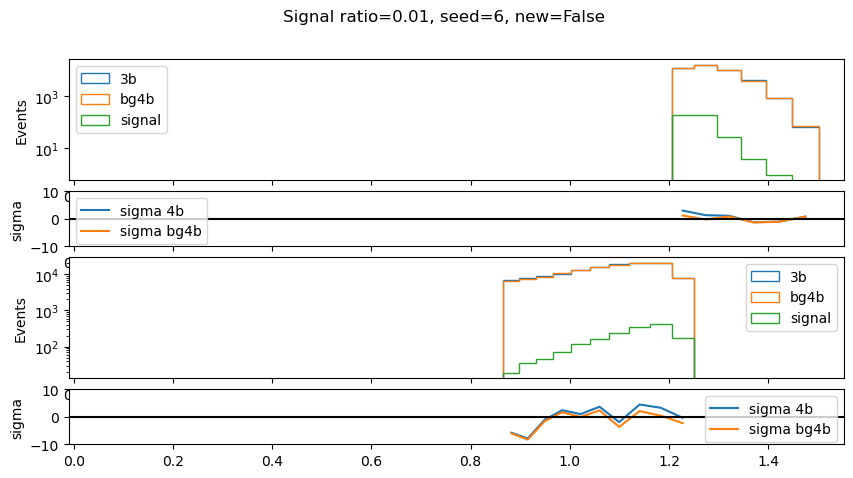

Seed set to 6
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 143/143 [00:02<00:00, 55.81it/s, v_num=1, val_loss=0.677, train_loss=0.676]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 143/143 [00:02<00:00, 55.66it/s, v_num=1, val_loss=0.677, train_loss=0.676]


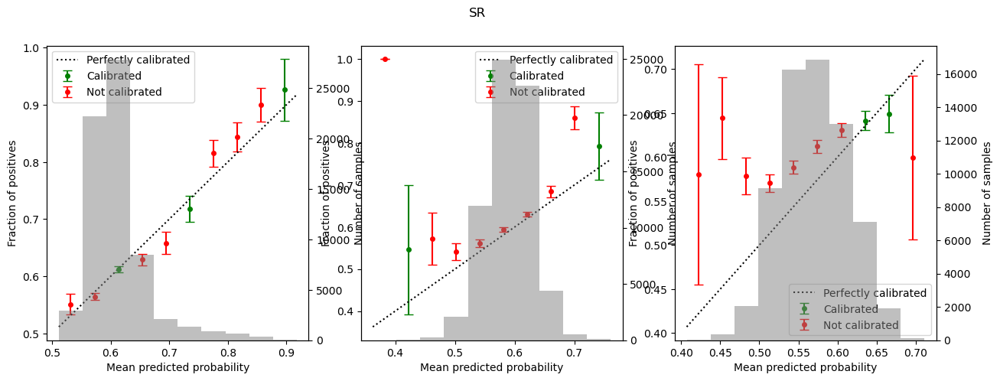

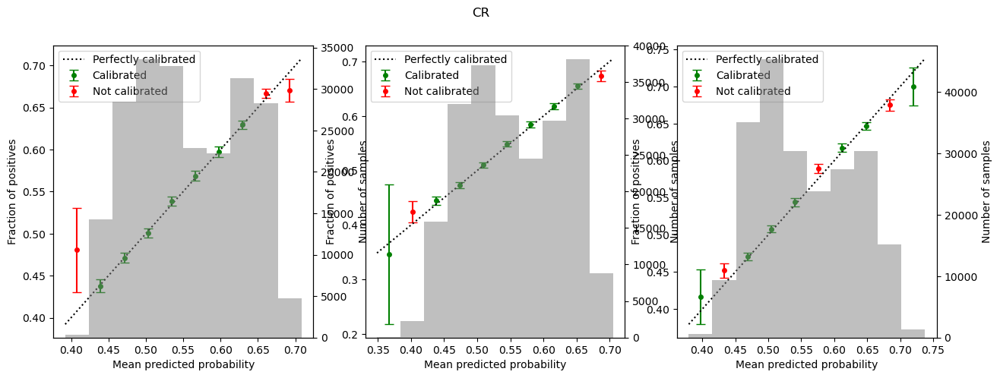

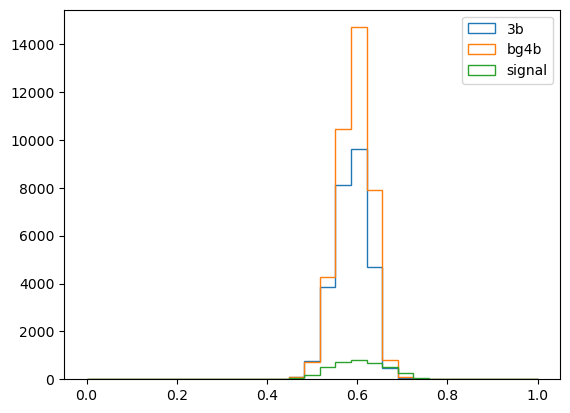

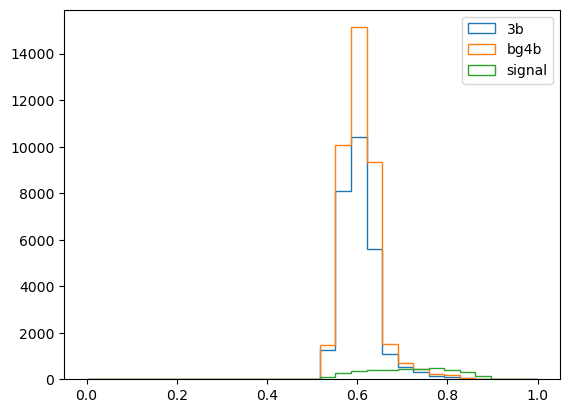

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=6, new=True
Sigma avg CR 2.0611477
Sigma avg bg4b CR 1.7787093
Sigma avg SR 7.476418
Sigma avg bg4b SR 2.8114622
CR events 218941
SR events 66842


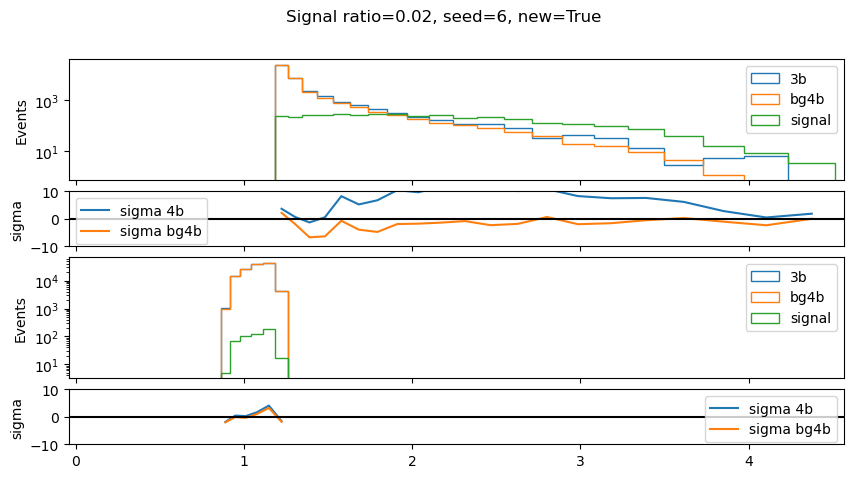

Signal ratio=0.02, seed=6, new=False
Sigma avg CR 5.0081887
Sigma avg bg4b CR 4.8244624
Sigma avg SR 9.938964
Sigma avg bg4b SR 2.5754042
CR events 218941
SR events 66842


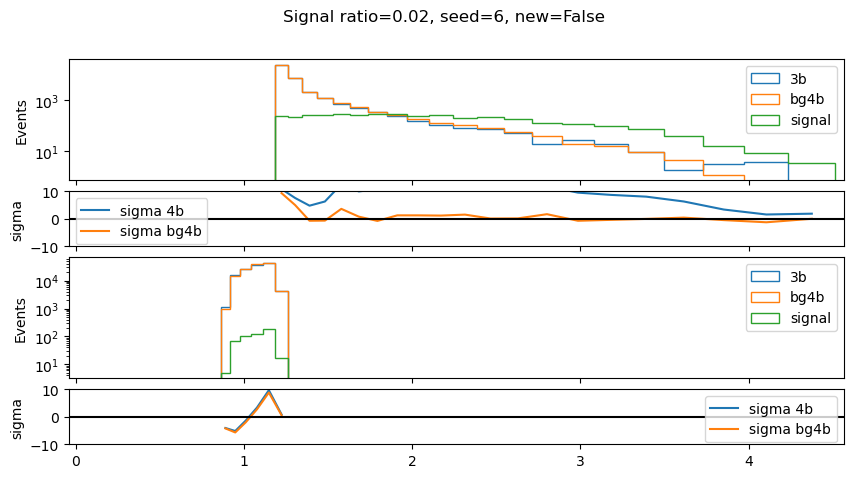

Seed set to 7
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 144/144 [00:03<00:00, 39.31it/s, v_num=1, val_loss=0.677, train_loss=0.678]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 144/144 [00:03<00:00, 38.16it/s, v_num=1, val_loss=0.677, train_loss=0.678]


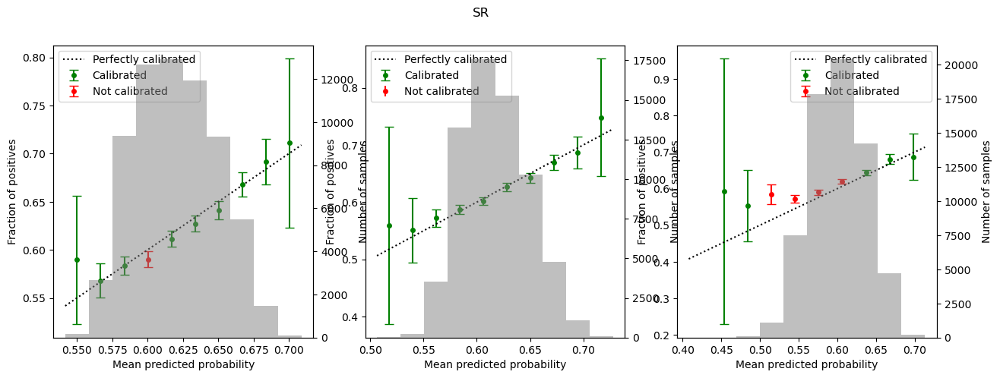

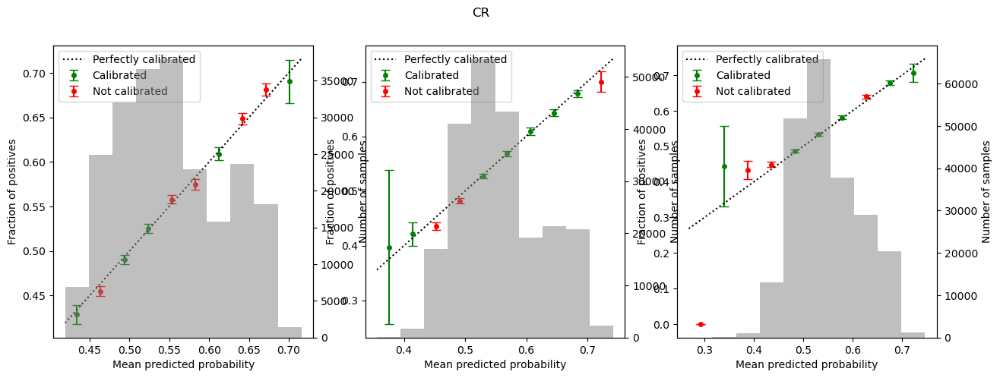

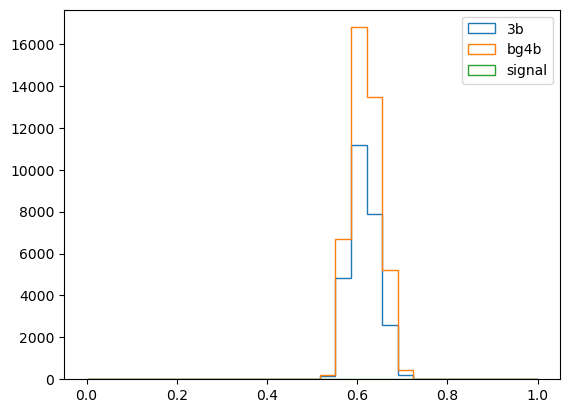

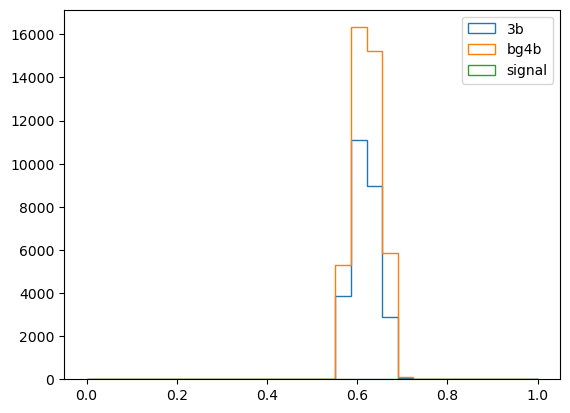

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=7, new=True
Sigma avg CR 4.3228097
Sigma avg bg4b CR 4.3228097
Sigma avg SR 2.9687462
Sigma avg bg4b SR 2.9687462
CR events 220218
SR events 66107


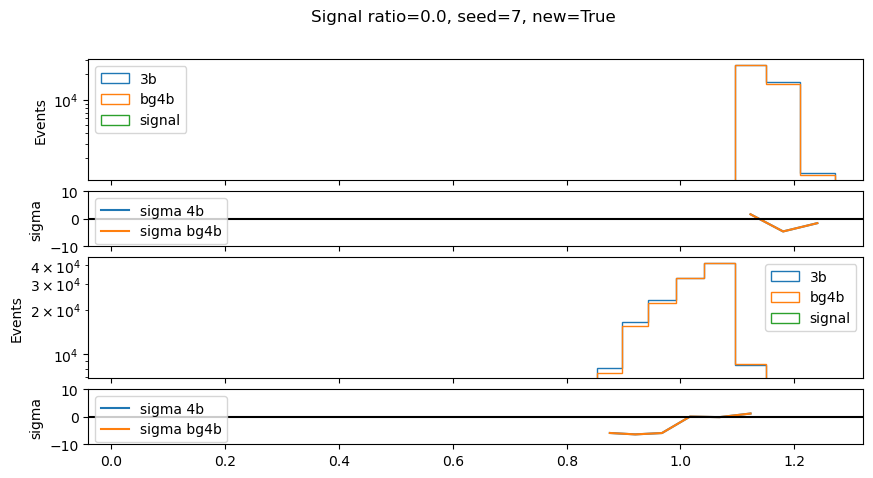

Signal ratio=0.0, seed=7, new=False
Sigma avg CR 6.447094
Sigma avg bg4b CR 6.447094
Sigma avg SR 7.386611
Sigma avg bg4b SR 7.386611
CR events 220218
SR events 66107


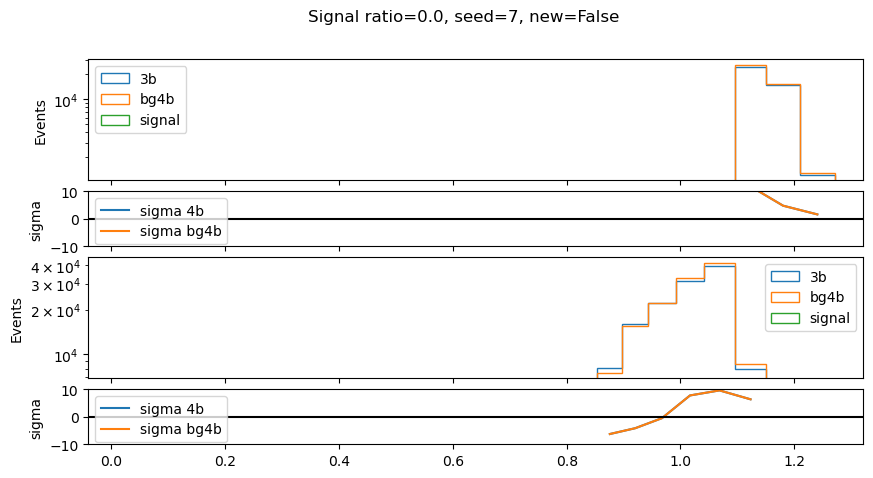

Seed set to 7
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 6: 100%|██████████| 144/144 [00:02<00:00, 49.51it/s, v_num=1, val_loss=0.679, train_loss=0.679]


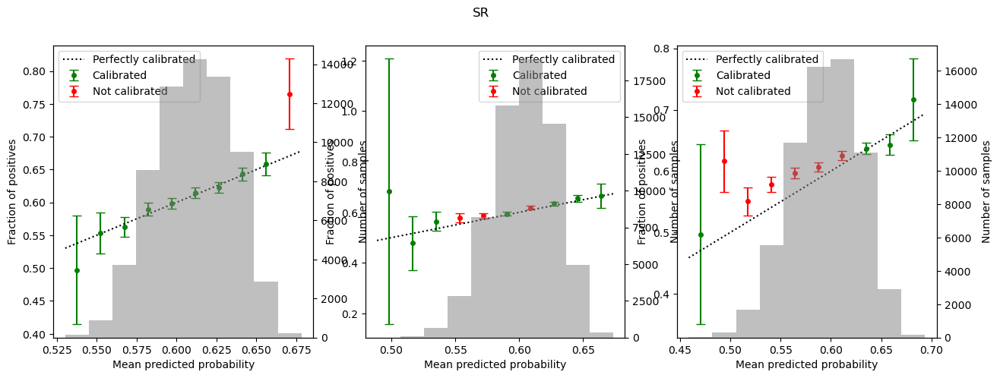

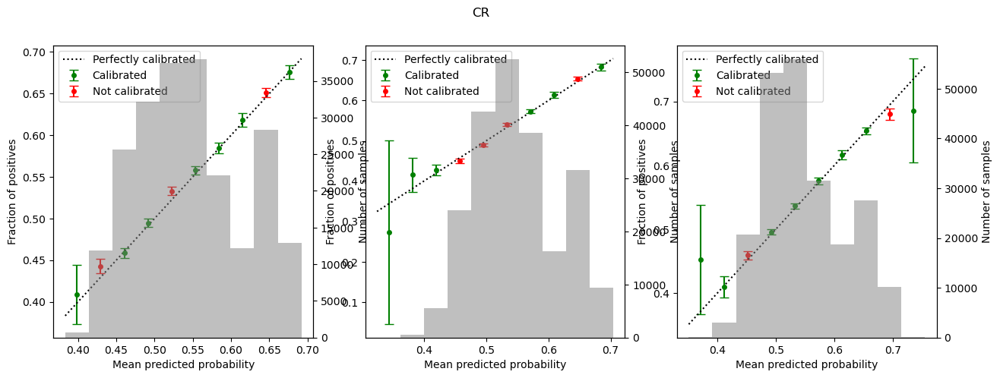

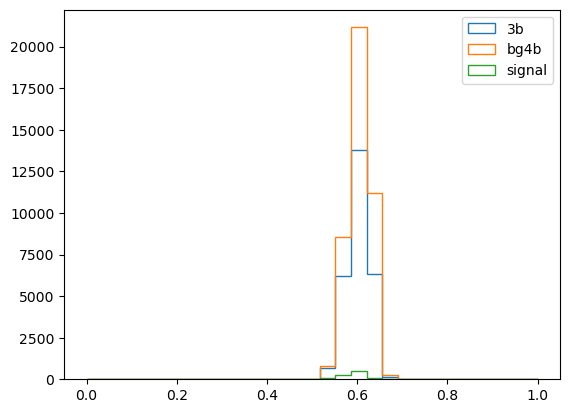

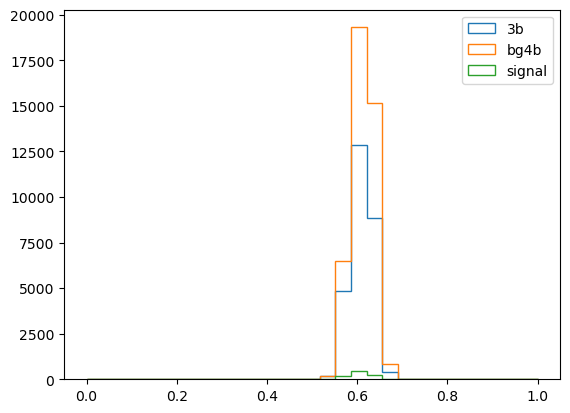

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=7, new=True
Sigma avg CR 3.2296028
Sigma avg bg4b CR 2.6975262
Sigma avg SR 4.949099
Sigma avg bg4b SR 2.1519794
CR events 221061
SR events 66407


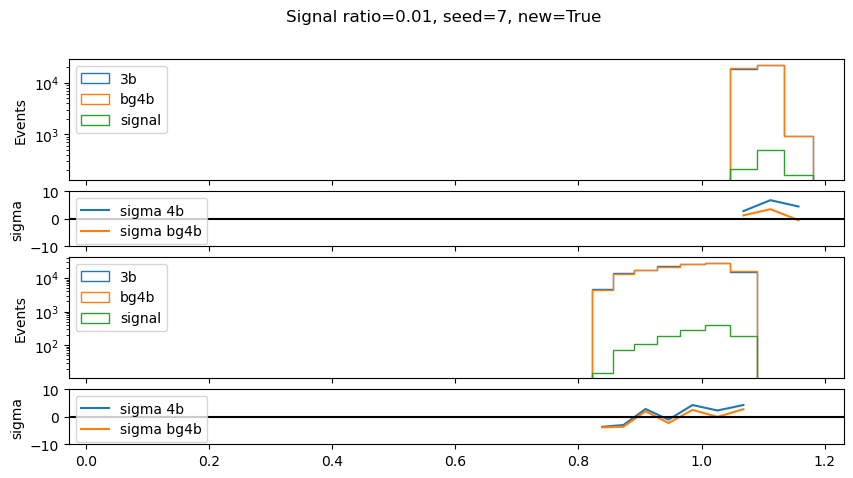

Signal ratio=0.01, seed=7, new=False
Sigma avg CR 5.941641
Sigma avg bg4b CR 5.4448333
Sigma avg SR 9.173681
Sigma avg bg4b SR 6.221742
CR events 221061
SR events 66407


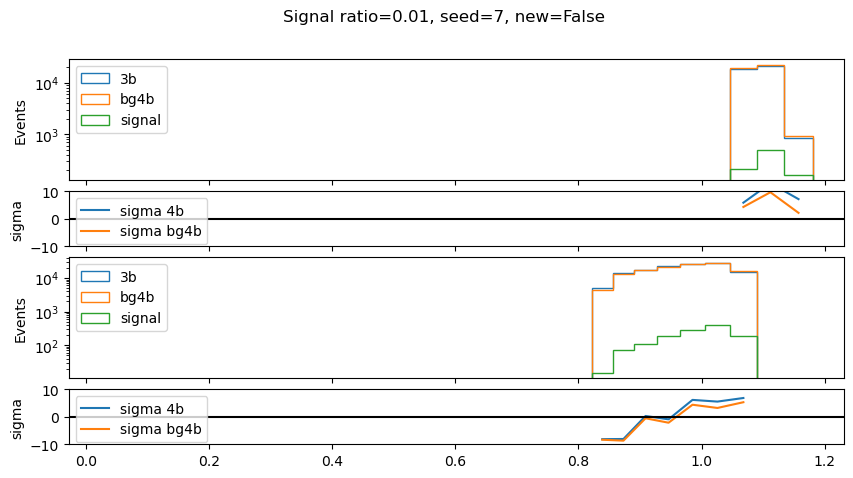

Seed set to 7
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 6: 100%|██████████| 144/144 [00:03<00:00, 42.31it/s, v_num=1, val_loss=0.677, train_loss=0.676]


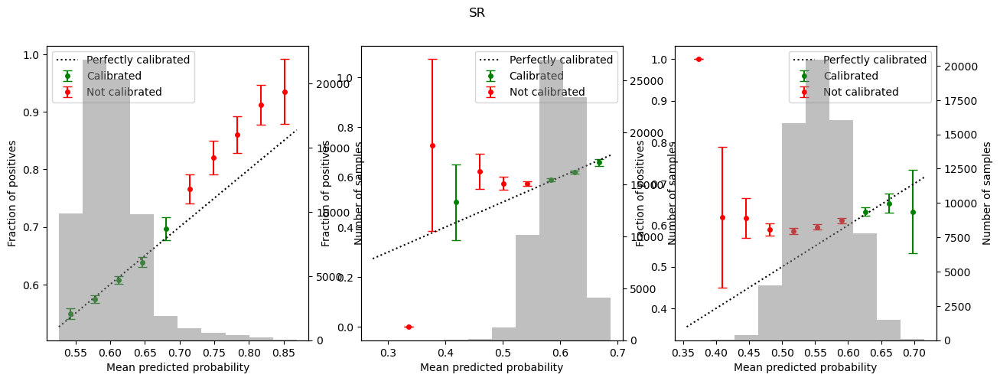

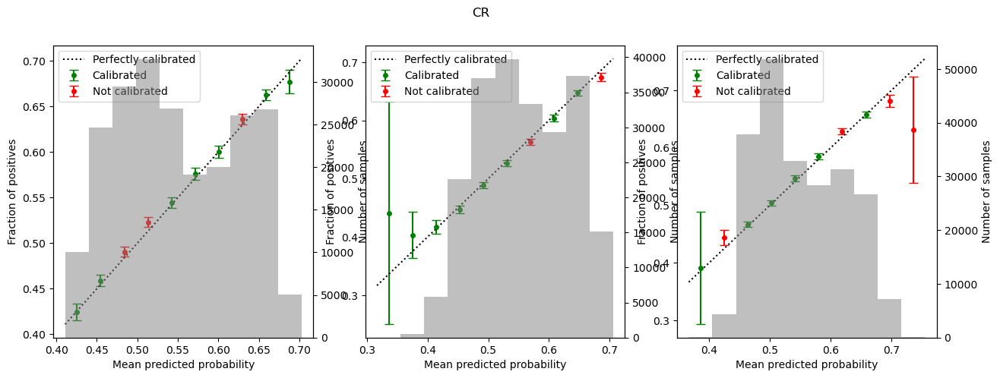

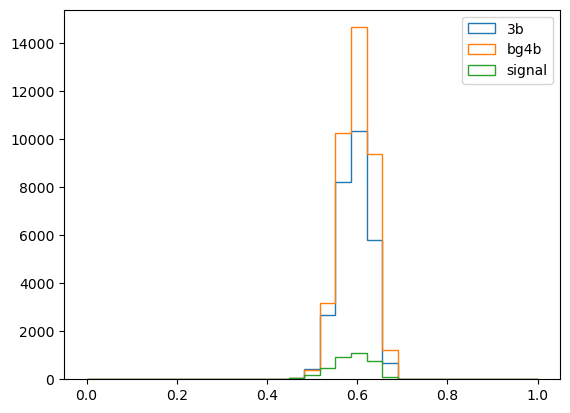

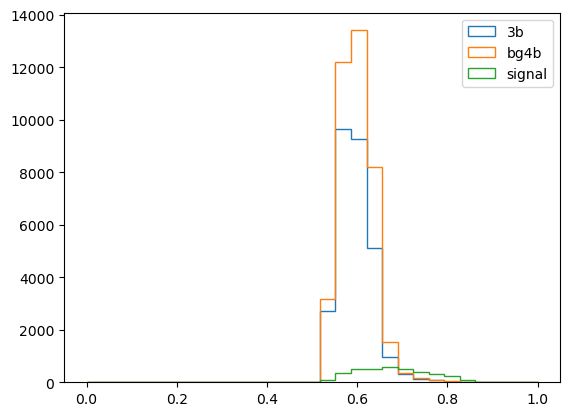

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=7, new=True
Sigma avg CR 3.1917353
Sigma avg bg4b CR 3.9314978
Sigma avg SR 9.777308
Sigma avg bg4b SR 3.736145
CR events 220807
SR events 66036


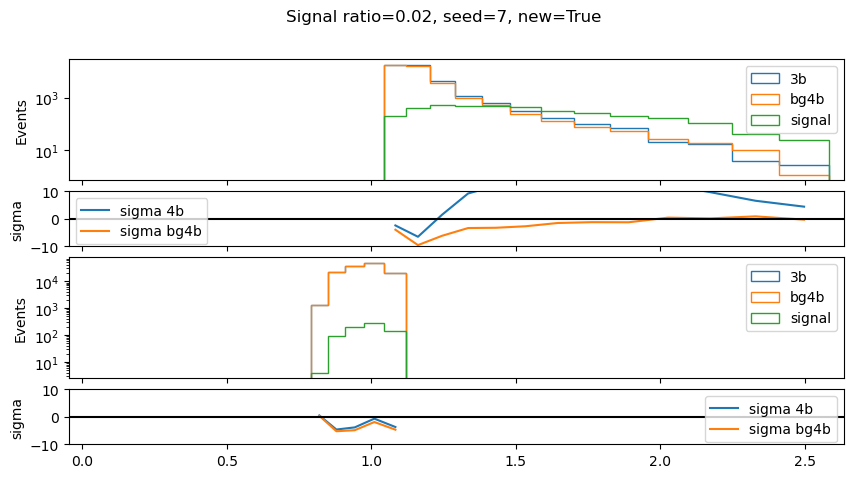

Signal ratio=0.02, seed=7, new=False
Sigma avg CR 7.153125
Sigma avg bg4b CR 6.801897
Sigma avg SR 12.866675
Sigma avg bg4b SR 4.065359
CR events 220807
SR events 66036


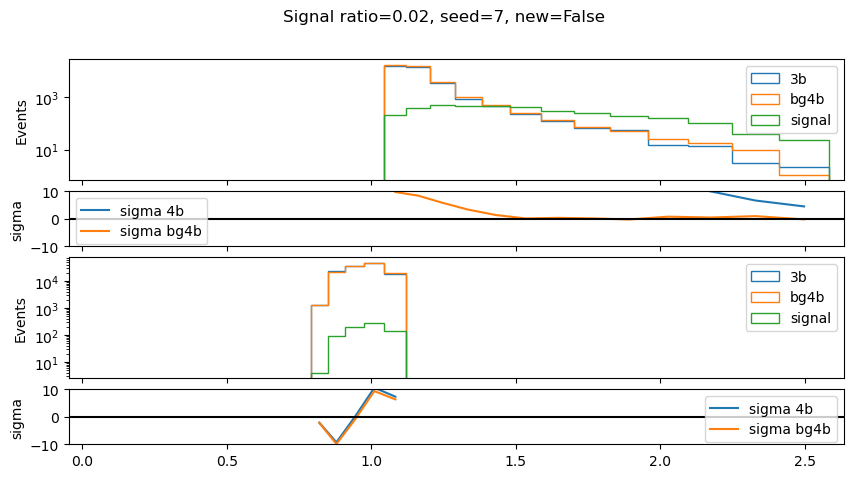

Seed set to 8
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 143/143 [00:02<00:00, 51.19it/s, v_num=1, val_loss=0.675, train_loss=0.676]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 143/143 [00:02<00:00, 50.85it/s, v_num=1, val_loss=0.675, train_loss=0.676]


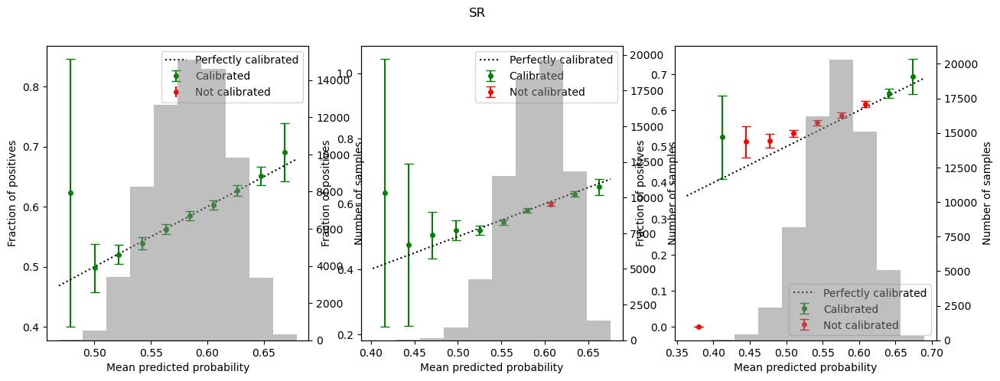

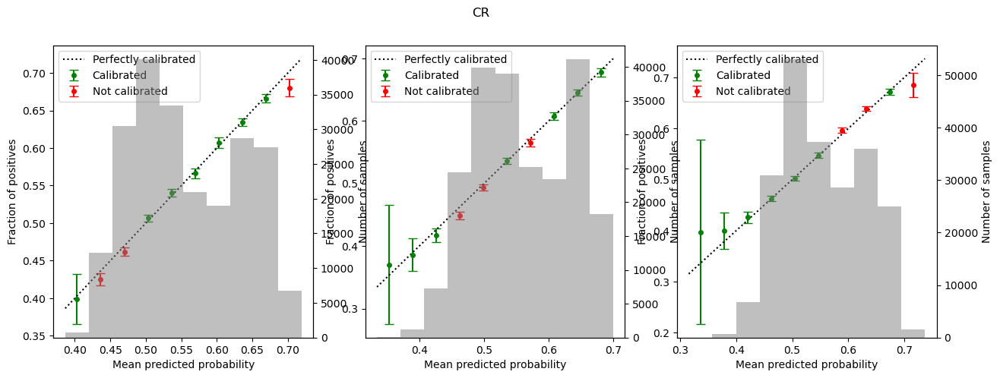

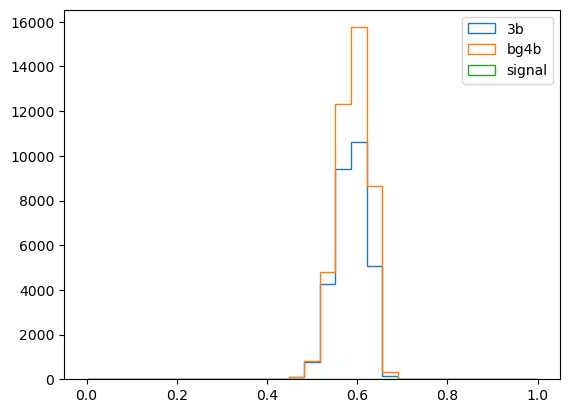

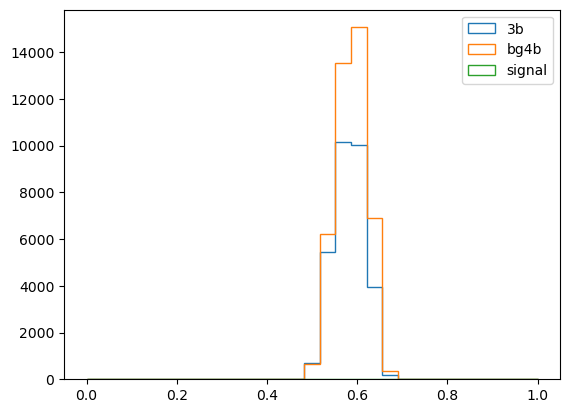

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=8, new=True
Sigma avg CR 2.4766915
Sigma avg bg4b CR 2.4766915
Sigma avg SR 2.2322414
Sigma avg bg4b SR 2.2322414
CR events 219683
SR events 68074


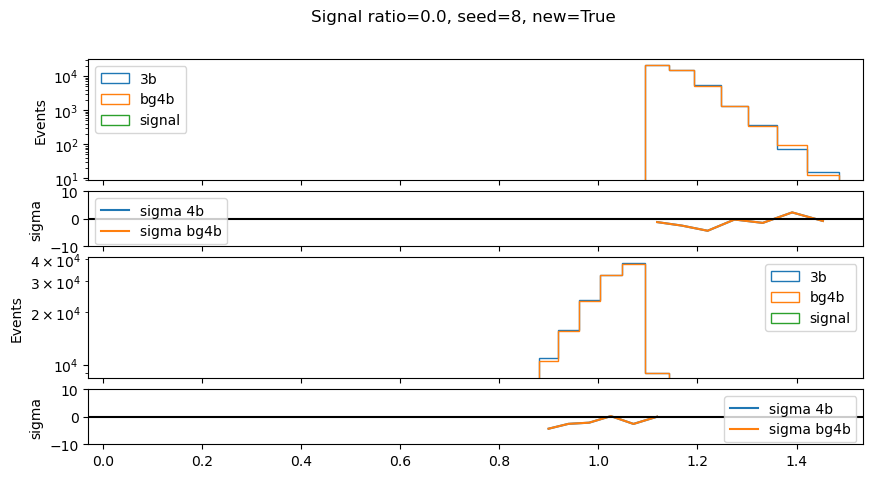

Signal ratio=0.0, seed=8, new=False
Sigma avg CR 4.4432893
Sigma avg bg4b CR 4.4432893
Sigma avg SR 5.4604053
Sigma avg bg4b SR 5.4604053
CR events 219683
SR events 68074


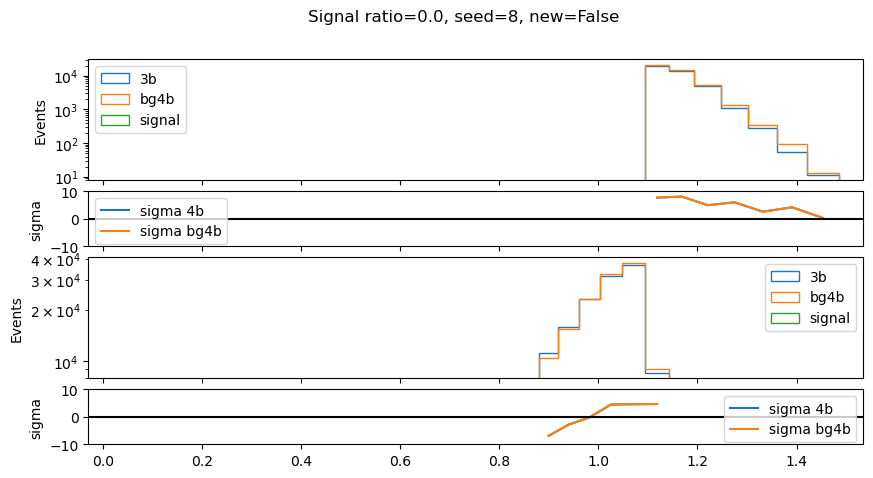

Seed set to 8
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 6: 100%|██████████| 141/141 [00:02<00:00, 51.24it/s, v_num=1, val_loss=0.673, train_loss=0.675]


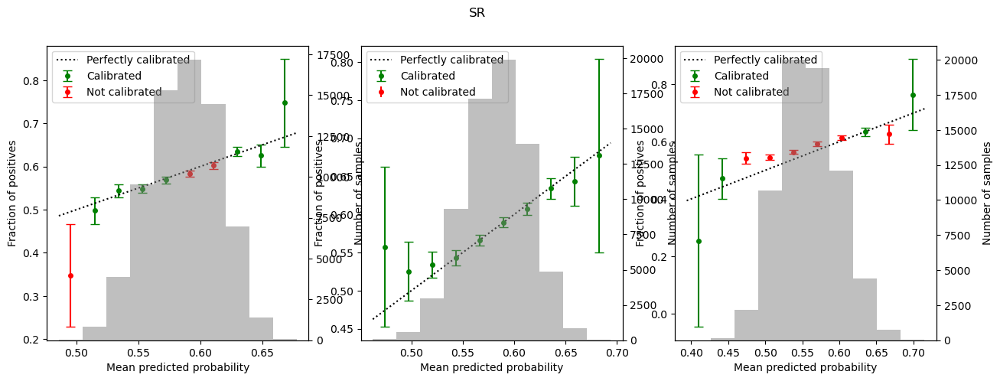

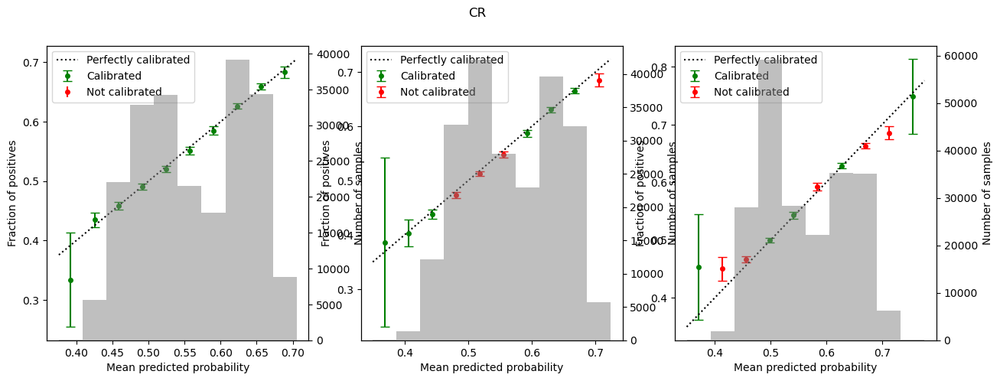

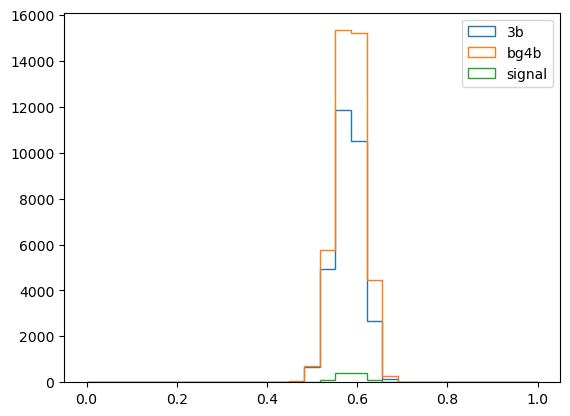

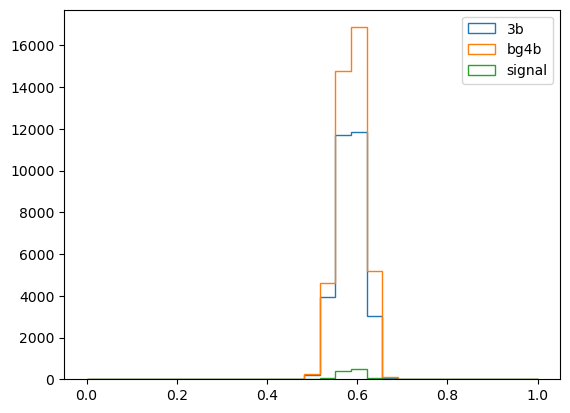

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=8, new=True
Sigma avg CR 2.861807
Sigma avg bg4b CR 3.7553065
Sigma avg SR 1.2005032
Sigma avg bg4b SR 2.7983155
CR events 216465
SR events 69645


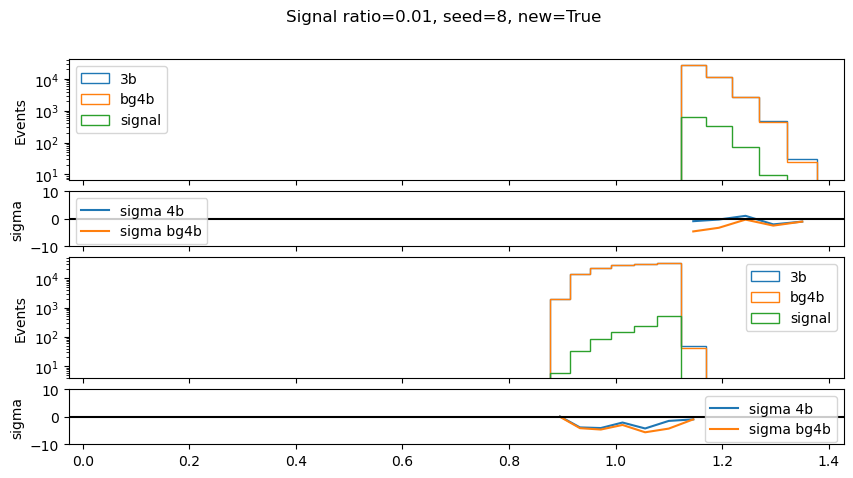

Signal ratio=0.01, seed=8, new=False
Sigma avg CR 4.5907426
Sigma avg bg4b CR 3.9991374
Sigma avg SR 8.240667
Sigma avg bg4b SR 6.0701785
CR events 216465
SR events 69645


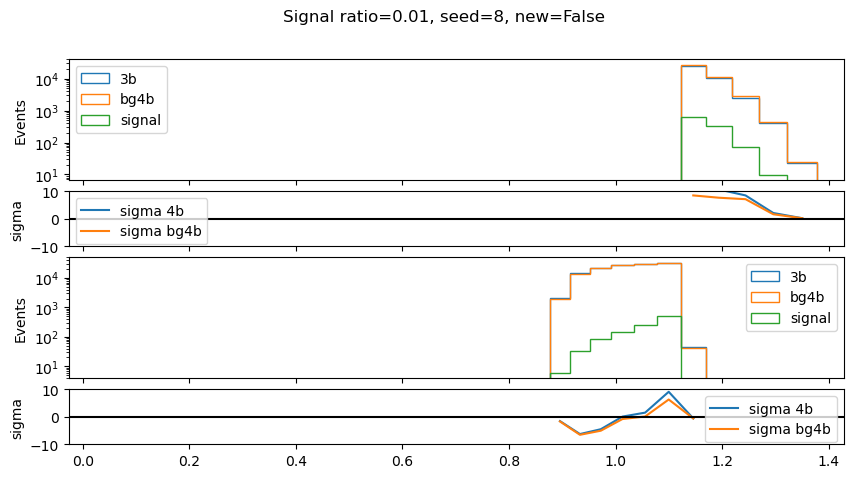

Seed set to 8
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 143/143 [00:02<00:00, 51.93it/s, v_num=1, val_loss=0.676, train_loss=0.676]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 143/143 [00:02<00:00, 51.61it/s, v_num=1, val_loss=0.676, train_loss=0.676]


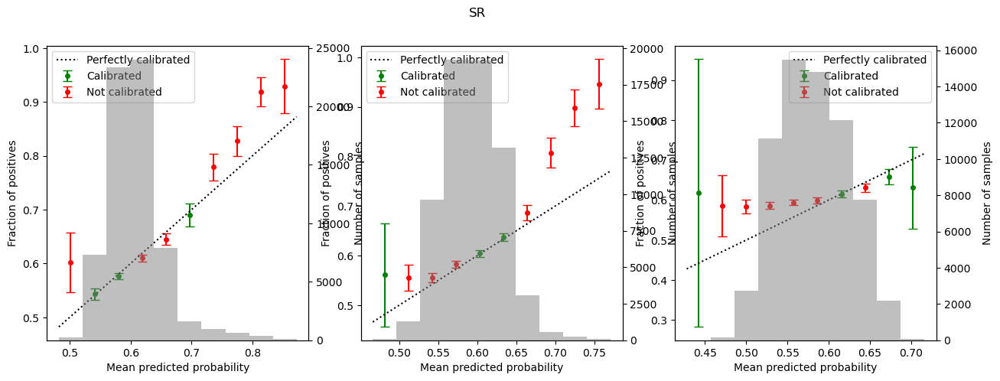

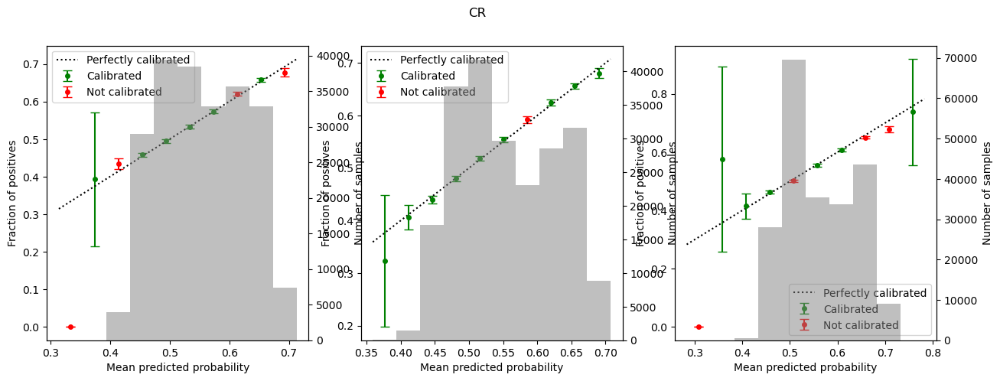

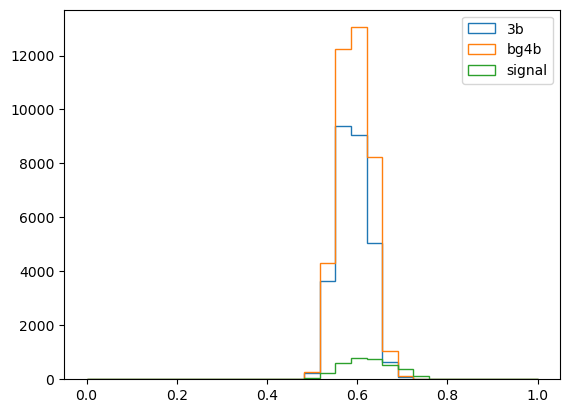

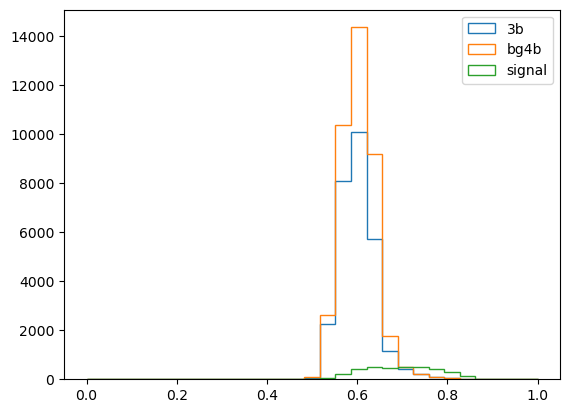

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=8, new=True
Sigma avg CR 2.232041
Sigma avg bg4b CR 1.9498665
Sigma avg SR 5.366632
Sigma avg bg4b SR 2.7458498
CR events 219559
SR events 66413


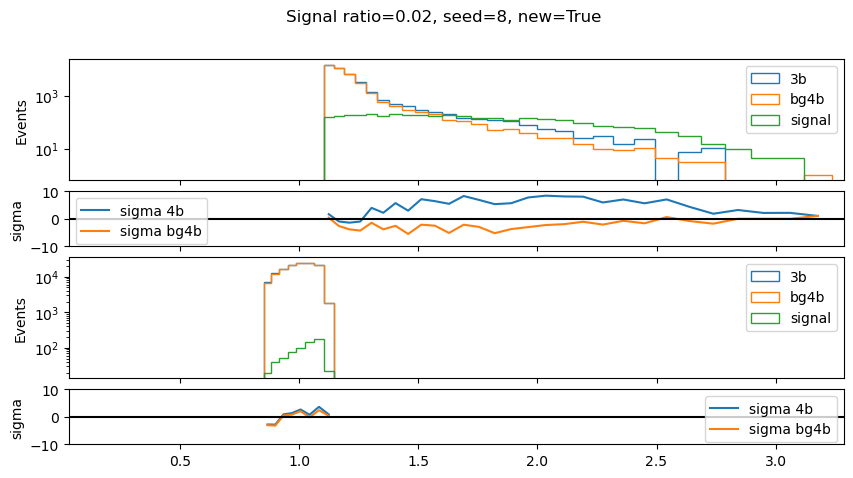

Signal ratio=0.02, seed=8, new=False
Sigma avg CR 4.6325235
Sigma avg bg4b CR 4.879638
Sigma avg SR 7.2564597
Sigma avg bg4b SR 1.021364
CR events 219559
SR events 66413


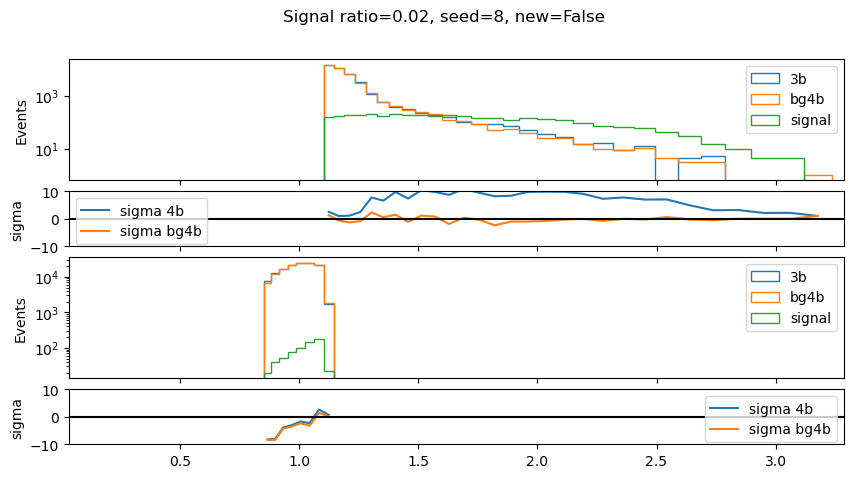

Seed set to 9
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 145/145 [00:02<00:00, 54.84it/s, v_num=1, val_loss=0.683, train_loss=0.682]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 145/145 [00:02<00:00, 54.50it/s, v_num=1, val_loss=0.683, train_loss=0.682]


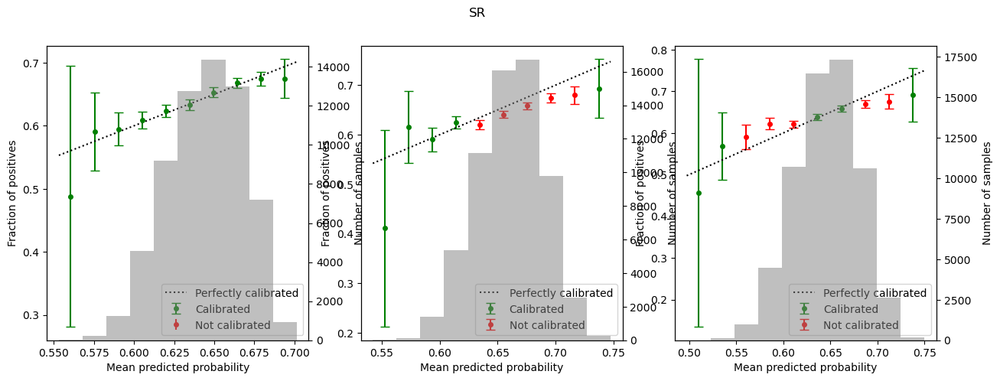

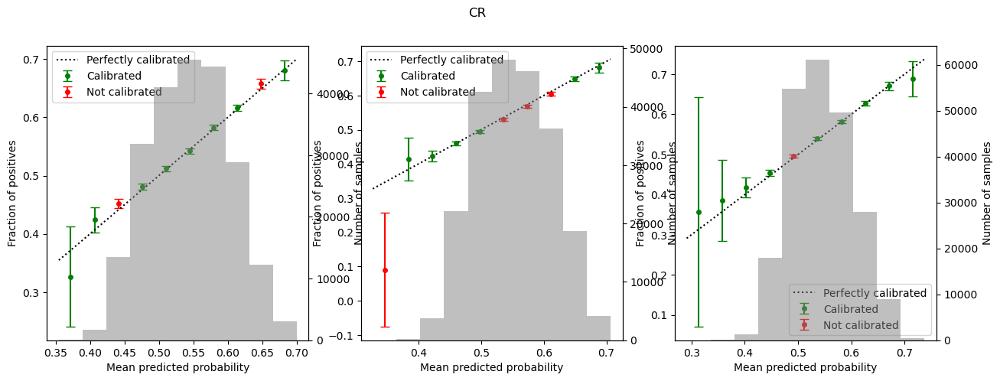

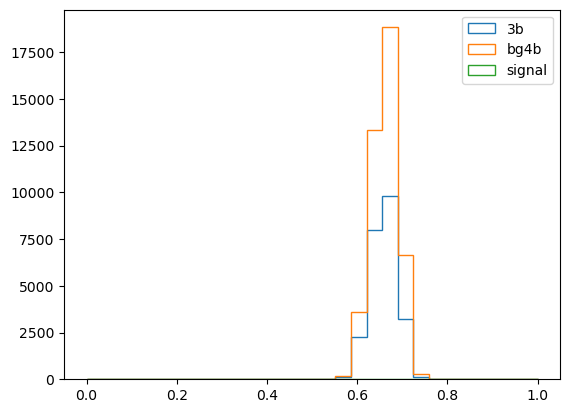

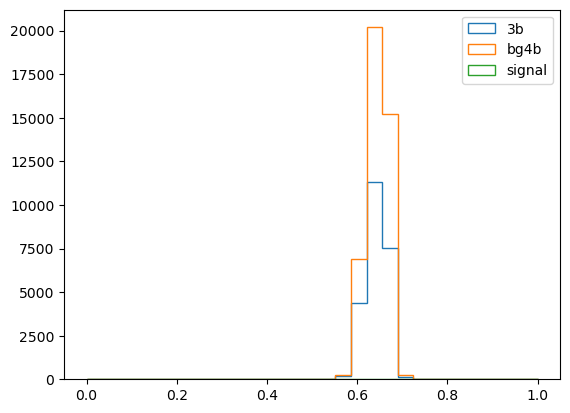

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.0, seed=9, new=True
Sigma avg CR 2.2926586
Sigma avg bg4b CR 2.2926586
Sigma avg SR 5.252092
Sigma avg bg4b SR 5.252092
CR events 221998
SR events 63451


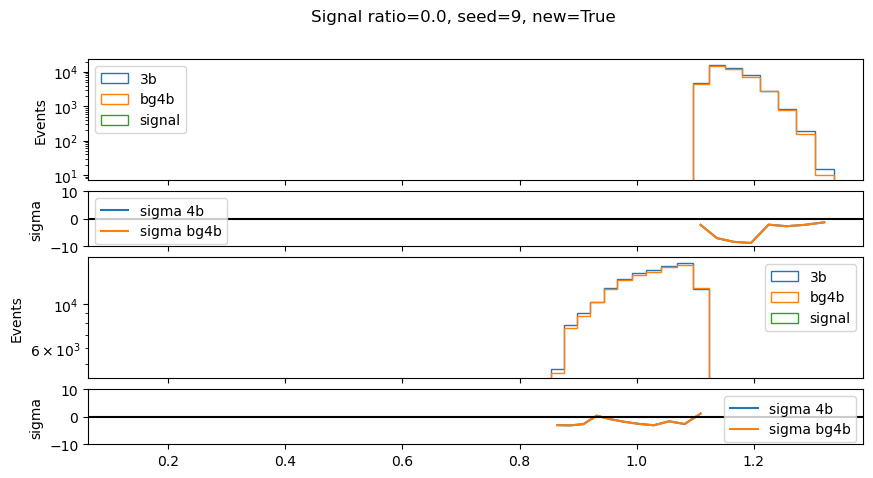

Signal ratio=0.0, seed=9, new=False
Sigma avg CR 4.5729203
Sigma avg bg4b CR 4.5729203
Sigma avg SR 1.7060796
Sigma avg bg4b SR 1.7060796
CR events 221998
SR events 63451


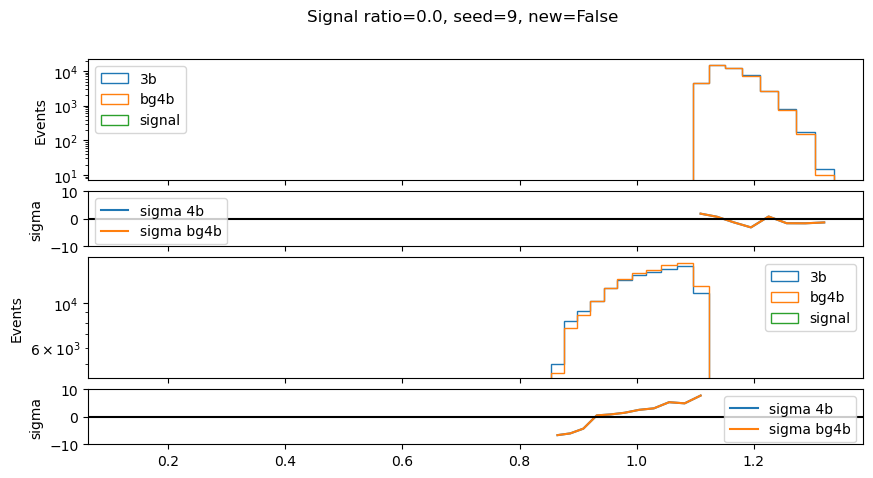

Seed set to 9
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 145/145 [00:02<00:00, 53.89it/s, v_num=1, val_loss=0.682, train_loss=0.681]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 145/145 [00:02<00:00, 51.61it/s, v_num=1, val_loss=0.682, train_loss=0.681]


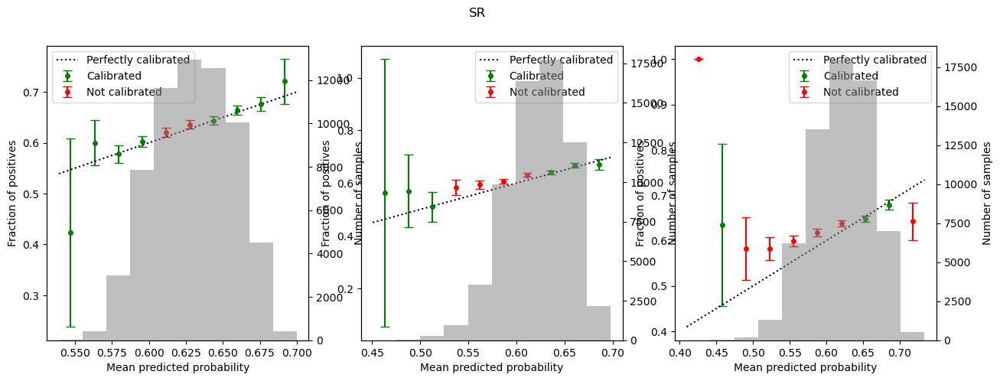

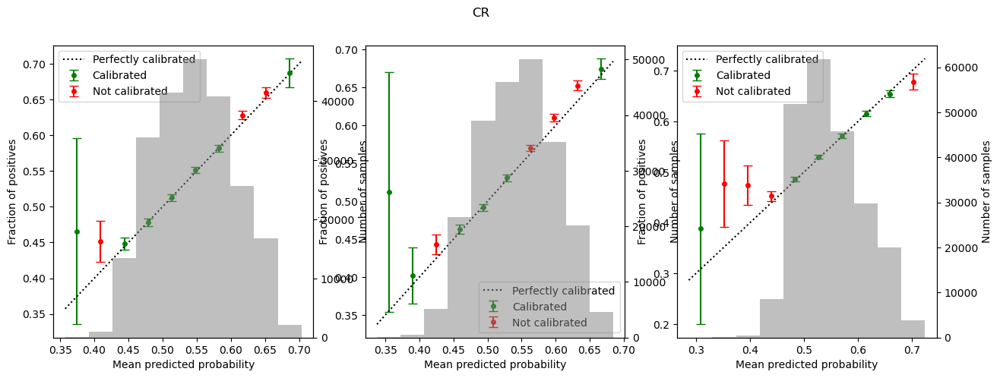

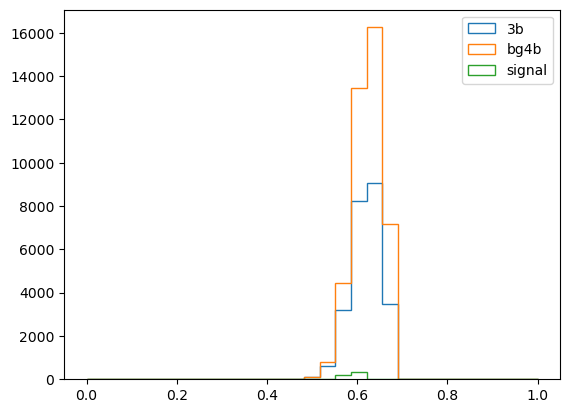

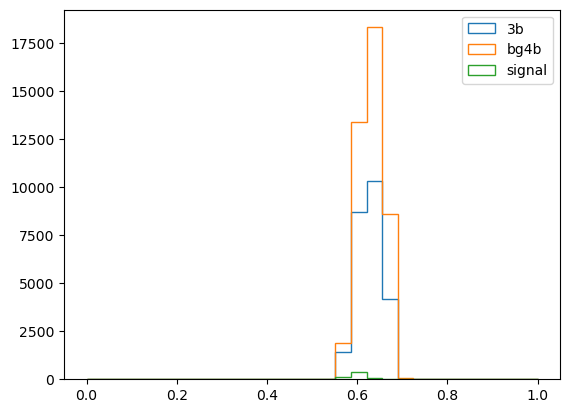

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.01, seed=9, new=True
Sigma avg CR 3.7117195
Sigma avg bg4b CR 2.6885588
Sigma avg SR 3.9469402
Sigma avg bg4b SR 3.1531096
CR events 222254
SR events 63406


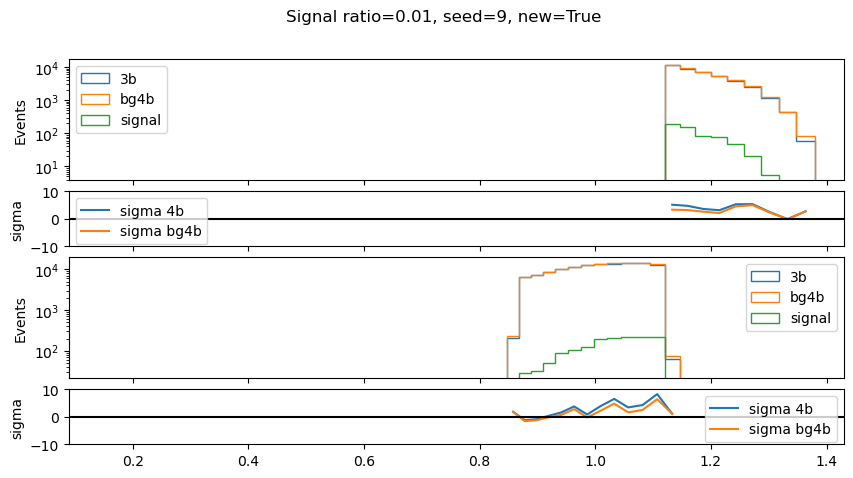

Signal ratio=0.01, seed=9, new=False
Sigma avg CR 4.1971445
Sigma avg bg4b CR 3.8301704
Sigma avg SR 4.1049256
Sigma avg bg4b SR 3.31229
CR events 222254
SR events 63406


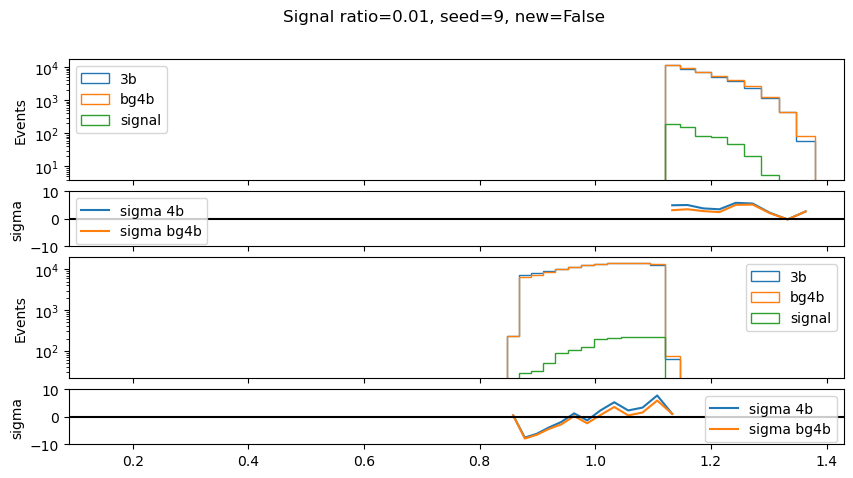

Seed set to 9
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/soheuny/miniconda3/envs/coffea_torch/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/soheuny/HH4bsim/playground/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type       | Params
----------------------------------------
0 | encoder  | FvTEncoder | 920   
1 | select_q | conv1d     | 8     
2 | out      | conv1d     | 16    
----------------------------------------
895       Trainable params
49        Non-trainable params
944       Total params
0.004     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 145/145 [00:02<00:00, 55.46it/s, v_num=1, val_loss=0.680, train_loss=0.680]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 145/145 [00:02<00:00, 53.18it/s, v_num=1, val_loss=0.680, train_loss=0.680]


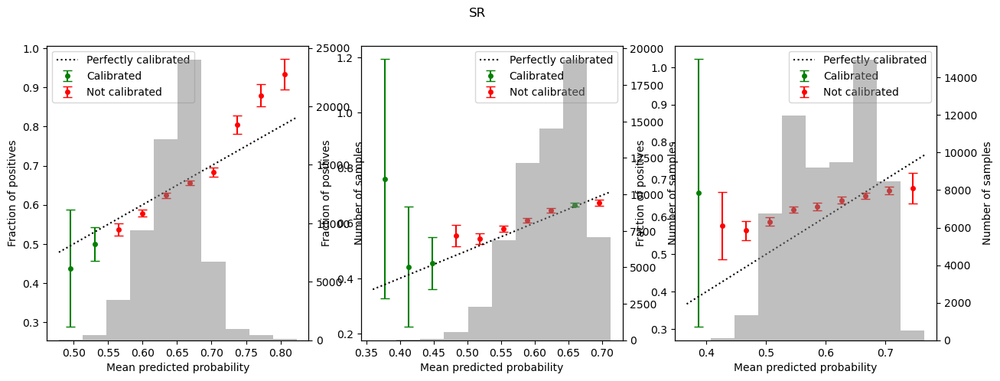

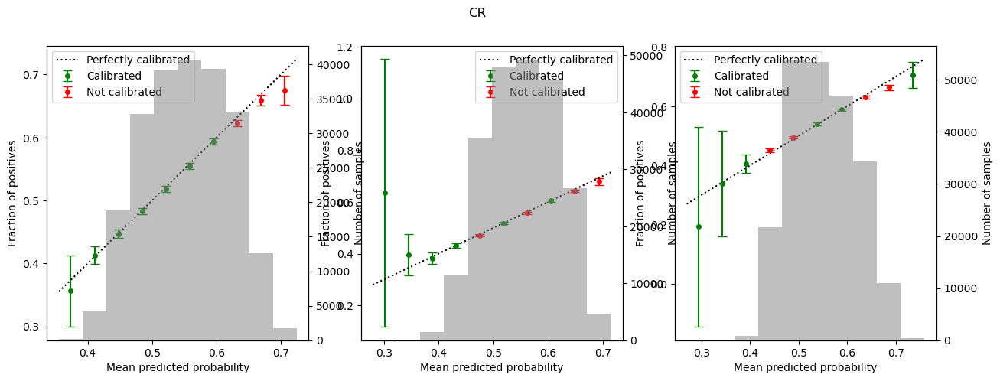

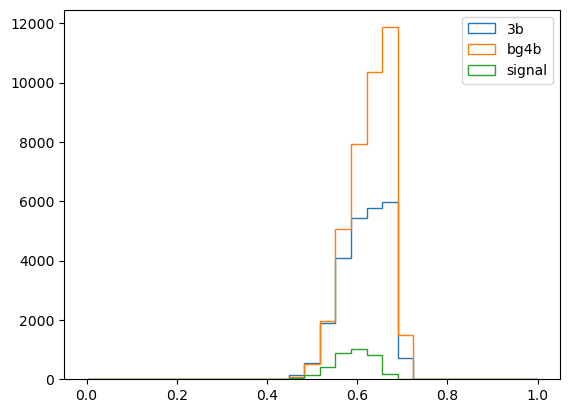

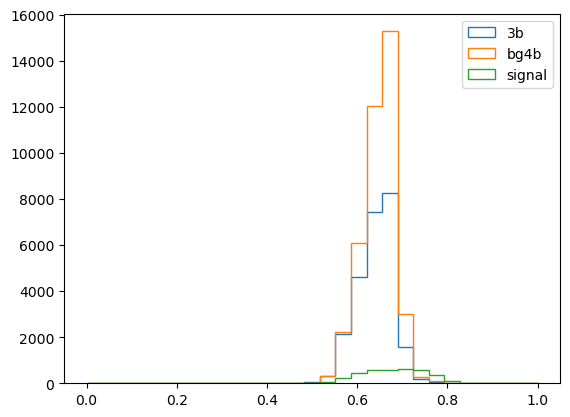

/tmp/ipykernel_3573164/2380245532.py:162: RuntimeWarning: invalid value encountered in divide
  sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:164: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
/tmp/ipykernel_3573164/2380245532.py:168: RuntimeWarning: invalid value encountered in divide
  sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
/tmp/ipykernel_3573164/2380245532.py:170: RuntimeWarning: invalid value encountered in divide
  sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR


Signal ratio=0.02, seed=9, new=True
Sigma avg CR 2.665448
Sigma avg bg4b CR 3.2611983
Sigma avg SR 8.203515
Sigma avg bg4b SR 2.234005
CR events 222531
SR events 62820


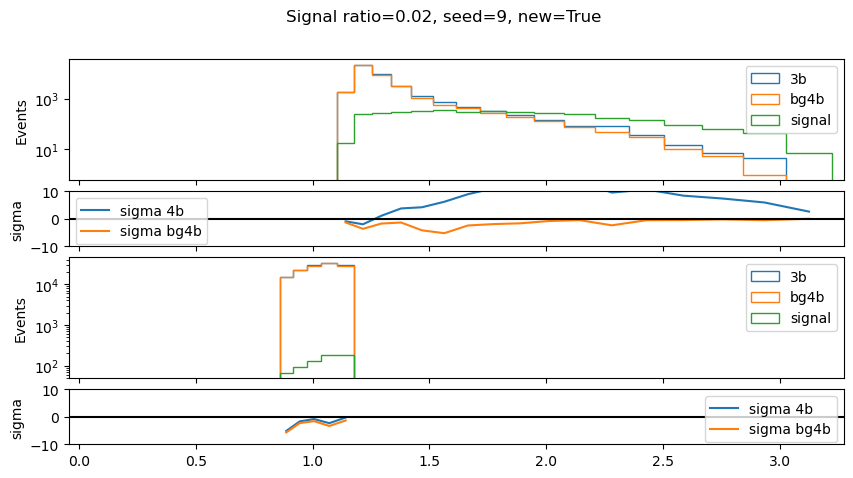

Signal ratio=0.02, seed=9, new=False
Sigma avg CR 4.9567204
Sigma avg bg4b CR 4.95441
Sigma avg SR 10.028909
Sigma avg bg4b SR 1.1701269
CR events 222531
SR events 62820


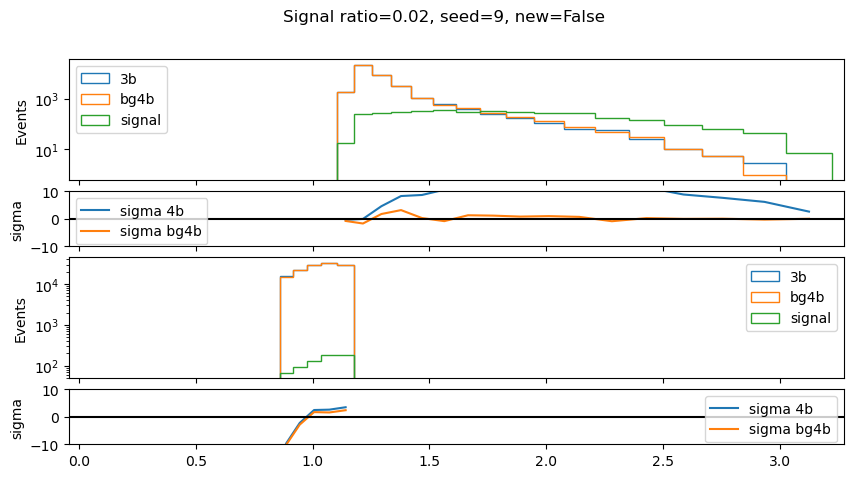

: 

In [6]:
config_filename = "configs/counting_test_v1_base.yml"

config = yaml.safe_load(open(config_filename, "r"))
experiment_name = config["experiment_name"]
n_3b = config["n_3b"]
ratio_4b = config["ratio_4b"]


existing_hparams = TSTInfo.get_existing_hparams()
seeds = np.unique([h["seed"] for h in existing_hparams])
signal_ratios = np.unique([h["signal_ratio"] for h in existing_hparams])
n_3bs = np.unique([h["n_3b"] for h in existing_hparams])

for seed in range(10):
    for signal_ratio in [0.0, 0.01, 0.02]:
        
        hparams_filter = {
            "n_3b": n_3b,
            "signal_ratio": signal_ratio,
            "experiment_name": experiment_name,
            "seed": seed,
        }
        hashes = TSTInfo.find(hparams_filter)
        tst_hash = hashes[0]

        tst_info = TSTInfo.load(tst_hash)

        signal_filename = "HH4b_picoAOD.h5"
        events_tst = events_from_scdinfo(tst_info.scdinfo_tst, features, signal_filename)
        events_tst_original_weights = events_tst.weights
        base_fvt_model = FvTClassifier.load(f"checkpoints/{tst_info.base_fvt_tinfo_hash}_best.ckpt")
        # CR_model = FvTClassifier.load_from_checkpoint(f"checkpoints/{tst_info.base_fvt_tinfo_hash}_best.ckpt")
        training_info = TrainingInfoV2.load(tst_info.CR_fvt_tinfo_hash)

        batch_size = 1024
        train_dset, val_dset = training_info.fetch_train_val_tensor_datasets(features, "fourTag", "weight")
        CR_model_new = FvTClassifier.load_from_checkpoint(f"checkpoints/{tst_info.base_fvt_tinfo_hash}_best.ckpt")
        CR_model_new.fit(train_dset, val_dset, max_epochs=10, batch_size=batch_size, train_seed=training_info.hparams["train_seed"])

        from plots import calibration_plot

        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        CR_model_original = FvTClassifier.load_from_checkpoint(f"checkpoints/{tst_info.CR_fvt_tinfo_hash}_best.ckpt")
        CR_model_original.eval()
        CR_model_original.to(device)
        probs_est_4b_original = CR_model_original.predict(events_tst.X_torch).detach().cpu().numpy()[:, 1]

        CR_model_new.eval()
        CR_model_new.to(device)
        probs_est_4b_new = CR_model_new.predict(events_tst.X_torch).detach().cpu().numpy()[:, 1]

        SR_stats = tst_info.SR_stats
        SR_cut = tst_info.SR_cut
        CR_cut = tst_info.CR_cut
        in_SR = SR_stats >= SR_cut
        in_CR = (SR_stats < SR_cut) & (SR_stats >= CR_cut)

        base_fvt_model.eval()
        base_fvt_model.to(device)
        events_tst.set_model_scores(base_fvt_model)

        bins = np.linspace(0, 1, 30)

        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
        fig.suptitle("SR")
        calibration_plot(events_tst.fvt_score[in_SR], 
                        events_tst.is_4b[in_SR],
                        bins=10, 
                        sample_weights=events_tst.weights[in_SR], 
                        title="Base", 
                        ax=ax[0])

        calibration_plot(probs_est_4b_new[in_SR], 
                        events_tst.is_4b[in_SR],
                        bins=10, 
                        sample_weights=events_tst.weights[in_SR], 
                        title="New",
                            ax=ax[1])

        calibration_plot(probs_est_4b_original[in_SR],
                        events_tst.is_4b[in_SR],
                        bins=10,
                        sample_weights=events_tst.weights[in_SR], 
                        title="Original",
                        ax=ax[2])

        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
        fig.suptitle("CR")
        calibration_plot(events_tst.fvt_score[in_CR], 
                        events_tst.is_4b[in_CR],
                        bins=10, 
                        sample_weights=events_tst.weights[in_CR], 
                        title="Base",
                            ax=ax[0])

        calibration_plot(probs_est_4b_new[in_CR], 
                        events_tst.is_4b[in_CR],
                        bins=10, 
                        sample_weights=events_tst.weights[in_CR], 
                        title="New",
                        ax=ax[1])

        calibration_plot(probs_est_4b_original[in_CR],
                        events_tst.is_4b[in_CR],
                        bins=10,
                        sample_weights=events_tst.weights[in_CR], 
                        title="Original", 
                        ax=ax[2])

        fig, ax = plt.subplots()
        hist_events_by_labels(events_tst[in_SR], probs_est_4b_new[in_SR], bins=bins, ax=ax)
        plt.legend()
        plt.show()

        fig, ax = plt.subplots()
        hist_events_by_labels(events_tst[in_SR], events_tst.fvt_score[in_SR], bins=bins, ax=ax)
        plt.legend()
        plt.show()

        verbose = True
        show_plots = True

        for new in [True, False]:
            if new:
                reweights = ratio_4b * probs_est_4b_new / ((1 - ratio_4b) * (1 - probs_est_4b_new))
            else:
                reweights = ratio_4b * probs_est_4b_original / ((1 - ratio_4b) * (1 - probs_est_4b_original))
            events_tst.reweight(
                np.where(events_tst.is_4b, events_tst_original_weights, events_tst_original_weights * reweights))
            events_tst_SR = events_tst[in_SR]
            events_tst_CR = events_tst[in_CR]

            # hist_values = probs_est_4b_new
            # hist_values = events_tst.fvt_score
            hist_values = SR_stats

            min_score = np.min(hist_values)
            max_score = np.max(hist_values)
            bins = np.geomspace(min_score, max_score, 100)
            midpoints = (bins[1:] + bins[:-1]) / 2

            hist_3b_CR, _ = np.histogram(hist_values[events_tst.is_3b & in_CR], bins=bins, 
                                        weights=events_tst.weights[events_tst.is_3b & in_CR])
            hist_bg4b_CR, _ = np.histogram(hist_values[events_tst.is_bg4b & in_CR], bins=bins, 
                                        weights=events_tst.weights[events_tst.is_bg4b & in_CR])
            hist_signal_CR, _ = np.histogram(hist_values[events_tst.is_signal & in_CR], bins=bins, 
                                        weights=events_tst.weights[events_tst.is_signal & in_CR])
            hist_4b_CR, _ = np.histogram(hist_values[events_tst.is_4b & in_CR], bins=bins,
                                        weights=events_tst.weights[events_tst.is_4b & in_CR])

            hist_3b_SR, _ = np.histogram(hist_values[events_tst.is_3b & in_SR], bins=bins, 
                                        weights=events_tst.weights[events_tst.is_3b & in_SR])
            hist_bg4b_SR, _ = np.histogram(hist_values[events_tst.is_bg4b & in_SR], bins=bins, 
                                        weights=events_tst.weights[events_tst.is_bg4b & in_SR])
            hist_signal_SR, _ = np.histogram(hist_values[events_tst.is_signal & in_SR], bins=bins, 
                                        weights=events_tst.weights[events_tst.is_signal & in_SR])
            hist_4b_SR, _ = np.histogram(hist_values[events_tst.is_4b & in_SR], bins=bins,
                                        weights=events_tst.weights[events_tst.is_4b & in_SR])

            std_est_CR = np.sqrt(np.max([hist_4b_CR, hist_3b_CR], axis=0))
            sigma_CR = (hist_4b_CR - hist_3b_CR)  / std_est_CR
            sigma_avg_CR = np.sqrt(np.mean(sigma_CR[~np.isnan(sigma_CR)] ** 2))
            sigma_bg4b_CR = (hist_bg4b_CR - hist_3b_CR)  / std_est_CR
            sigma_avg_bg4b_CR = np.sqrt(np.mean(sigma_bg4b_CR[~np.isnan(sigma_bg4b_CR)] ** 2))

            std_est_SR = np.sqrt(np.max([hist_4b_SR, hist_3b_SR], axis=0))
            sigma_SR = (hist_4b_SR - hist_3b_SR)  / std_est_SR
            sigma_avg_SR = np.sqrt(np.mean(sigma_SR[~np.isnan(sigma_SR)] ** 2))
            sigma_bg4b_SR = (hist_bg4b_SR - hist_3b_SR)  / std_est_SR
            sigma_avg_bg4b_SR = np.sqrt(np.mean(sigma_bg4b_SR[~np.isnan(sigma_bg4b_SR)] ** 2))

            if verbose:
                print(f"Signal ratio={signal_ratio}, seed={seed}, new={new}")
                print("Sigma avg CR", sigma_avg_CR)
                print("Sigma avg bg4b CR", sigma_avg_bg4b_CR)
                print("Sigma avg SR", sigma_avg_SR)
                print("Sigma avg bg4b SR", sigma_avg_bg4b_SR)
                print("CR events", len(events_tst_CR))
                print("SR events", len(events_tst_SR))

            if show_plots:
                fig = plt.figure(figsize=(10, 5))
                fig.suptitle(f"Signal ratio={signal_ratio}, seed={seed}, new={new}")
                gs = GridSpec(6, 1, figure=fig)
                ax1 = fig.add_subplot(gs[0:2])
                
                hist_events_by_labels(events_tst_SR, hist_values[in_SR], bins, ax1)
                ax1.set_xlim(min_score - 0.05, max_score + 0.05)
                ax1.set_yscale("log")
                ax1.set_xlabel("FvT score")
                ax1.set_ylabel("Events")
                ax1.legend()

                ax3 = fig.add_subplot(gs[2])
                ax3.plot(midpoints, sigma_SR, label="sigma 4b")
                ax3.plot(midpoints, sigma_bg4b_SR, label="sigma bg4b")
                ax3.axhline(0, color="black")
                # ax3.set_xlabel("SR stats")
                ax3.set_ylabel("sigma")
                ax3.set_xlim(min_score - 0.05, max_score + 0.05)
                ax3.set_ylim(-10, 10)
                ax3.legend()

                ax2 = fig.add_subplot(gs[3:5])
                hist_events_by_labels(events_tst_CR, hist_values[in_CR], bins, ax2)
                ax2.set_xlim(min_score - 0.05, max_score + 0.05)
                ax2.set_yscale("log")
                ax2.set_xlabel("FvT score")
                ax2.set_ylabel("Events")
                ax2.legend()
                

                ax4 = fig.add_subplot(gs[5])
                ax4.plot(midpoints, sigma_CR, label="sigma 4b")
                ax4.plot(midpoints, sigma_bg4b_CR, label="sigma bg4b")
                ax4.axhline(0, color="black")
                # ax4.set_xlabel("SR stats")
                ax4.set_ylabel("sigma")
                ax4.set_xlim(min_score - 0.05, max_score + 0.05)
                ax4.set_ylim(-10, 10)
                ax4.legend()
                plt.show()

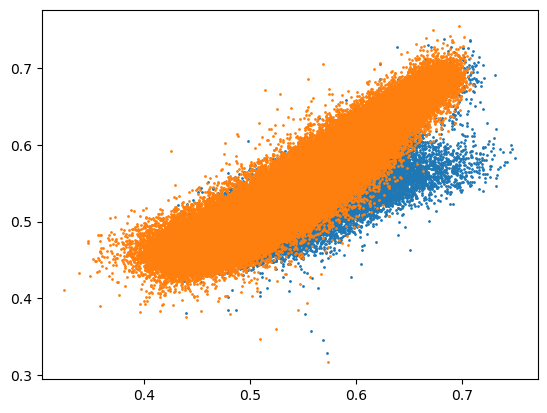

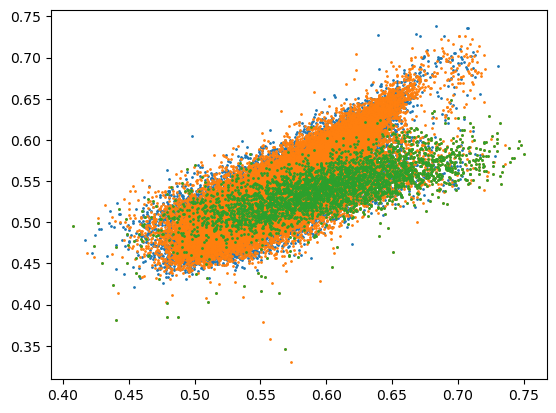

In [36]:
plt.scatter(probs_est_4b[in_SR], probs_est_4b_original[in_SR], s=1)
plt.scatter(probs_est_4b[in_CR], probs_est_4b_original[in_CR], s=1)
plt.show()

is_signal = events_tst.is_signal
is_4b = events_tst.is_4b
is_bg4b = events_tst.is_bg4b
is_3b = events_tst.is_3b

plt.scatter(probs_est_4b[in_SR & is_3b], probs_est_4b_original[in_SR & is_3b], s=1)
plt.scatter(probs_est_4b[in_SR & is_4b], probs_est_4b_original[in_SR & is_4b], s=1)
plt.scatter(probs_est_4b[in_SR & is_signal], probs_est_4b_original[in_SR & is_signal], s=1)
plt.show()